# Contents


[Tarisio violins](#Tarisio-violins) <br>










[Violin Sale Prices Before 1960](#Violin-Sale-Prices-Before-1960) <br>
[Violin Sale Prices Between 1960 and 1980](#Violin-Sale-Prices-Between-1960-and-1980) <br>
[Violin Sale Prices Between 1980 and 2010](#Violin-Sale-Prices-Between-1980-and-2010) <br>
[Violin Sale Prices After 2010](#Violin-Sale-Prices-After-2010) <br>
[Price Ranges](#Price-Ranges) <br>
[Maker Trends](#Maker-Trends) <br>
[Regional Trends](#Regional-Trends)

[More Maker Trends](#More-Maker-Trends) 

[Bubble Charts](#Bubble-Charts)






[Violin Bow Sales](#Violin-Bow-Sales) <br>
[Resources](#Resources) <br>

# Notes
[Return to Table of Contents](#Contents)

### Import datasets to merge

In [4]:
# Cities is the Tarisio.com data that contains data scraped from Maker Cities. 
import pandas as pd

Cities = pd.read_csv('CityCountry2_duplicates_df.csv', index_col = 0)
Cities

,MakerID,Maker,City,Country
0,166,Richard Duke,Aachen,Germany
1,1497,Nicolò Gagliano,Aachen,Germany
2,254,Johann Gottfried Hamm,Aachen,Germany
3,355,Marc André Joseph Laberte,Aachen,Germany
4,9091,Edward Lewis II,Aachen,Germany
...,...,...,...,...
5567,2685,Eugen Tenucci,Zurich,Switzerland
5568,769,Georg Ullmann,Zurich,Switzerland
5569,1262,J. Emil Zust,Zurich,Switzerland
5570,537,Johann Gottlob Pfretzschner,Zwota,Germany


In [20]:
# Makers is the Tarisio.com data that contains data scraped from Maker Names. 
import pandas as pd

Makers = pd.read_csv('Tarisio2.csv', index_col = 0, parse_dates=['SaleDate'])
Makers

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker
0,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael"
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael"
2,Violin,2018-05-17,24000,Tarisio,Mittenwald,2611,"Achner, Philip"
3,Violin,2008-11-15,3884,Bongartz's,NaN,2611,"Achner, Philip"
4,Violin,1990-03-27,2146,Sotheby's,Mittenwald,2611,"Achner, Philip"
...,...,...,...,...,...,...,...
55278,Violin,2012-04-27,108000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel"
55279,Violin,2009-12-14,15634,Brompton's,NaN,844,"Zygmuntowicz, Samuel"
55280,Violin,2009-12-14,15634,Brompton's,NaN,844,"Zygmuntowicz, Samuel"
55281,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel"


In [22]:
Cities.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5572 entries, 0 to 5571
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   MakerID  5572 non-null   int64 
 1   Maker    5572 non-null   object
 2   City     5572 non-null   object
 3   Country  5570 non-null   object
dtypes: int64(1), object(3)
memory usage: 217.7+ KB


In [24]:
Makers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 55283 entries, 0 to 55282
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Instrument    55283 non-null  object        
 1   SaleDate      55283 non-null  datetime64[ns]
 2   SalePrice     55283 non-null  int64         
 3   AuctionHouse  50712 non-null  object        
 4   AuctionCity   35673 non-null  object        
 5   MakerID       55283 non-null  int64         
 6   Maker         55283 non-null  object        
dtypes: datetime64[ns](1), int64(2), object(4)
memory usage: 3.4+ MB


# Merge the datasets 

for a new Tarisio2_Shiny df, with makers and cities and no dropped duplicates. 

In [26]:
Makers.set_index('MakerID')

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker
MakerID,,,,,,
2919,Violin,2010-02-20,4200,Tarisio,Wallgau,"Achner, Michael"
2919,Violin,1987-04-27,2838,Bongartz's,Mittenwald,"Achner, Michael"
2611,Violin,2018-05-17,24000,Tarisio,Mittenwald,"Achner, Philip"
2611,Violin,2008-11-15,3884,Bongartz's,NaN,"Achner, Philip"
2611,Violin,1990-03-27,2146,Sotheby's,Mittenwald,"Achner, Philip"
...,...,...,...,...,...,...
844,Violin,2012-04-27,108000,Tarisio,"Brooklyn, NY","Zygmuntowicz, Samuel"
844,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel"
844,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel"


In [28]:
Cities.set_index('MakerID')

,Maker,City,Country
MakerID,,,
166,Richard Duke,Aachen,Germany
1497,Nicolò Gagliano,Aachen,Germany
254,Johann Gottfried Hamm,Aachen,Germany
355,Marc André Joseph Laberte,Aachen,Germany
9091,Edward Lewis II,Aachen,Germany
...,...,...,...
2685,Eugen Tenucci,Zurich,Switzerland
769,Georg Ullmann,Zurich,Switzerland
1262,J. Emil Zust,Zurich,Switzerland


In [72]:
Cities['MakerID'].nunique()

4073

In [74]:
Cities['Maker'].nunique()

4064

In [76]:
Cities[Cities['MakerID'] == 1497]

,MakerID,Maker,City,Country
1,1497,Nicolò Gagliano,Aachen,Germany
3643,1497,Nicolò Gagliano,Naples,Italy


In [78]:
Makers[Makers['MakerID'] == 1497]

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker
16803,Violin,2024-05-31,66000,NaN,Naples,1497,"Gagliano, Nicolò"
16804,Violin,2024-03-15,130000,NaN,Naples,1497,"Gagliano, Nicolò"
16805,Violin,2023-10-31,116521,NaN,Naples,1497,"Gagliano, Nicolò"
16806,Violin,2023-06-05,148578,NaN,Naples,1497,"Gagliano, Nicolò"
16807,Violin,2023-03-28,221556,NaN,Naples,1497,"Gagliano, Nicolò"
...,...,...,...,...,...,...,...
16938,Violin,1968-07-19,2104,Sotheby's,NaN,1497,"Gagliano, Nicolò"
16939,Violin,1968-04-18,2883,Sotheby's,NaN,1497,"Gagliano, Nicolò"
16940,Violin,1956-05-24,320,Puttick & Simpson,NaN,1497,"Gagliano, Nicolò"
16941,Cello,1946-10-22,2200,Puttick & Simpson,NaN,1497,"Gagliano, Nicolò"


In [80]:
# merge with an inner join to keep only the indices in common.
Tarisio_Shiny = pd.merge(Makers, Cities, on='MakerID', how='left').reset_index()

Tarisio_Shiny

,index,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker_x,Maker_y,City,Country
0,0,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Michael Achner,Mittenwald,Germany
1,1,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Michael Achner,Wallgau,Germany
2,2,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Michael Achner,Mittenwald,Germany
3,3,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Michael Achner,Wallgau,Germany
4,4,Violin,2018-05-17,24000,Tarisio,Mittenwald,2611,"Achner, Philip",Philip Achner,Mittenwald,Germany
...,...,...,...,...,...,...,...,...,...,...,...
100071,100071,Violin,2009-12-14,15634,Brompton's,NaN,844,"Zygmuntowicz, Samuel",Samuel Zygmuntowicz,"New York, NY",US
100072,100072,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel",Samuel Zygmuntowicz,"Brooklyn, NY",US
100073,100073,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel",Samuel Zygmuntowicz,"New York, NY",US
100074,100074,Violin,2003-05-08,83250,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel",Samuel Zygmuntowicz,"Brooklyn, NY",US


In [82]:
Tarisio_Shiny[Tarisio_Shiny['MakerID'] == 1497]

,index,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker_x,Maker_y,City,Country
31609,31609,Violin,2024-05-31,66000,NaN,Naples,1497,"Gagliano, Nicolò",Nicolò Gagliano,Aachen,Germany
31610,31610,Violin,2024-05-31,66000,NaN,Naples,1497,"Gagliano, Nicolò",Nicolò Gagliano,Naples,Italy
31611,31611,Violin,2024-03-15,130000,NaN,Naples,1497,"Gagliano, Nicolò",Nicolò Gagliano,Aachen,Germany
31612,31612,Violin,2024-03-15,130000,NaN,Naples,1497,"Gagliano, Nicolò",Nicolò Gagliano,Naples,Italy
31613,31613,Violin,2023-10-31,116521,NaN,Naples,1497,"Gagliano, Nicolò",Nicolò Gagliano,Aachen,Germany
...,...,...,...,...,...,...,...,...,...,...,...
31884,31884,Violin,1956-05-24,320,Puttick & Simpson,NaN,1497,"Gagliano, Nicolò",Nicolò Gagliano,Naples,Italy
31885,31885,Cello,1946-10-22,2200,Puttick & Simpson,NaN,1497,"Gagliano, Nicolò",Nicolò Gagliano,Aachen,Germany
31886,31886,Cello,1946-10-22,2200,Puttick & Simpson,NaN,1497,"Gagliano, Nicolò",Nicolò Gagliano,Naples,Italy
31887,31887,Cello,1912-06-14,1714,Puttick & Simpson,NaN,1497,"Gagliano, Nicolò",Nicolò Gagliano,Aachen,Germany


To skip over Tarisio_Shiny df handling, skip to the Tarisio df where multiple city assignations were dropped.

[Skip to 'Tarisio violins'](#Tarisio-violins)

In [34]:
# Tarisio_Shiny.drop(columns=['index'], inplace=True)
Tarisio_Shiny

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker_x,Maker_y,City,Country
0,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Michael Achner,Mittenwald,Germany
1,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Michael Achner,Wallgau,Germany
2,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Michael Achner,Mittenwald,Germany
3,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Michael Achner,Wallgau,Germany
4,Violin,2018-05-17,24000,Tarisio,Mittenwald,2611,"Achner, Philip",Philip Achner,Mittenwald,Germany
...,...,...,...,...,...,...,...,...,...,...
100071,Violin,2009-12-14,15634,Brompton's,NaN,844,"Zygmuntowicz, Samuel",Samuel Zygmuntowicz,"New York, NY",US
100072,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel",Samuel Zygmuntowicz,"Brooklyn, NY",US
100073,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel",Samuel Zygmuntowicz,"New York, NY",US
100074,Violin,2003-05-08,83250,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel",Samuel Zygmuntowicz,"Brooklyn, NY",US


In [36]:
# Tarisio_Shiny.drop(columns=['Maker_y'], inplace=True)
Tarisio_Shiny

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker_x,City,Country
0,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Mittenwald,Germany
1,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Wallgau,Germany
2,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Mittenwald,Germany
3,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Wallgau,Germany
4,Violin,2018-05-17,24000,Tarisio,Mittenwald,2611,"Achner, Philip",Mittenwald,Germany
...,...,...,...,...,...,...,...,...,...
100071,Violin,2009-12-14,15634,Brompton's,NaN,844,"Zygmuntowicz, Samuel","New York, NY",US
100072,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel","Brooklyn, NY",US
100073,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel","New York, NY",US
100074,Violin,2003-05-08,83250,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel","Brooklyn, NY",US


In [38]:
# Rename Maker_x --> 'Maker'
Tarisio_Shiny.rename(columns={'Maker_x': 'Maker'}, inplace=True)
Tarisio_Shiny

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country
0,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Mittenwald,Germany
1,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Wallgau,Germany
2,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Mittenwald,Germany
3,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Wallgau,Germany
4,Violin,2018-05-17,24000,Tarisio,Mittenwald,2611,"Achner, Philip",Mittenwald,Germany
...,...,...,...,...,...,...,...,...,...
100071,Violin,2009-12-14,15634,Brompton's,NaN,844,"Zygmuntowicz, Samuel","New York, NY",US
100072,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel","Brooklyn, NY",US
100073,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel","New York, NY",US
100074,Violin,2003-05-08,83250,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel","Brooklyn, NY",US


In [40]:
# Add a column, 'Year'
Tarisio_Shiny['Year'] = Tarisio_Shiny['SaleDate'].dt.year
Tarisio_Shiny

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country,Year
0,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Mittenwald,Germany,2010
1,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Wallgau,Germany,2010
2,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Mittenwald,Germany,1987
3,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Wallgau,Germany,1987
4,Violin,2018-05-17,24000,Tarisio,Mittenwald,2611,"Achner, Philip",Mittenwald,Germany,2018
...,...,...,...,...,...,...,...,...,...,...
100071,Violin,2009-12-14,15634,Brompton's,NaN,844,"Zygmuntowicz, Samuel","New York, NY",US,2009
100072,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2003
100073,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel","New York, NY",US,2003
100074,Violin,2003-05-08,83250,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2003


In [42]:
Tarisio_Shiny.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100076 entries, 0 to 100075
Data columns (total 10 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Instrument    100076 non-null  object        
 1   SaleDate      100076 non-null  datetime64[ns]
 2   SalePrice     100076 non-null  int64         
 3   AuctionHouse  91354 non-null   object        
 4   AuctionCity   65107 non-null   object        
 5   MakerID       100076 non-null  int64         
 6   Maker         100076 non-null  object        
 7   City          98074 non-null   object        
 8   Country       98071 non-null   object        
 9   Year          100076 non-null  int32         
dtypes: datetime64[ns](1), int32(1), int64(2), object(6)
memory usage: 7.3+ MB


In [47]:
# Final dataframe
Tarisio_Shiny.to_csv('Tarisio2_Shiny.csv')

In [489]:
Tarisio_Shiny.describe()

,index,SaleDate,SalePrice,MakerID
count,100076.000000,100076,1.000760e+05,100076.000000
mean,50037.500000,2003-01-18 10:19:18.319677184,1.849947e+04,1312.100723
min,0.000000,1829-05-03 00:00:00,0.000000e+00,2.000000
25%,25018.750000,1992-05-11 00:00:00,1.815000e+03,396.000000
50%,50037.500000,2004-05-06 00:00:00,4.407000e+03,800.000000
75%,75056.250000,2012-11-28 00:00:00,1.175500e+04,1384.000000
max,100075.000000,2024-10-08 00:00:00,1.582128e+07,16057.000000
std,28889.597107,NaN,1.351071e+05,2222.515904


In [841]:
Tarisio_Shiny[['SaleDate', 'SalePrice']].sort_values(by='SalePrice').head(25)

,SaleDate,SalePrice
20481,1989-11-20,0
70249,1987-04-27,0
38781,1985-11-18,0
38782,1985-11-18,0
73503,1877-06-28,20
73504,1877-06-28,20
64857,2002-10-21,24
64858,2002-10-21,24
34566,2002-10-21,29
34565,2002-10-21,29


# Tarisio violins
[Return to Table of Contents](#Contents)

In [4]:
# Import Tarisio_df.csv file
import numpy as np
import pandas as pd

Tarisio = pd.read_csv('Tarisio_df.csv', index_col = 0, parse_dates=['SaleDate'])
Tarisio

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country,Year
0,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Mittenwald,Germany,2010
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Mittenwald,Germany,1987
2,Violin,2018-05-17,24000,Tarisio,Mittenwald,2611,"Achner, Philip",Mittenwald,Germany,2018
3,Violin,2008-11-15,3884,Bongartz's,NaN,2611,"Achner, Philip",Mittenwald,Germany,2008
4,Violin,1990-03-27,2146,Sotheby's,Mittenwald,2611,"Achner, Philip",Mittenwald,Germany,1990
...,...,...,...,...,...,...,...,...,...,...
55278,Violin,2012-04-27,108000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2012
55279,Violin,2009-12-14,15634,Brompton's,NaN,844,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2009
55280,Violin,2009-12-14,15634,Brompton's,NaN,844,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2009
55281,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2003


In [6]:
Tarisio.describe()

,SaleDate,SalePrice,MakerID,Year
count,55283,5.528300e+04,55283.000000,55283.000000
mean,2002-09-03 05:56:51.283757952,1.488276e+04,1511.311018,2002.122877
min,1829-05-03 00:00:00,0.000000e+00,2.000000,1829.000000
25%,1991-11-11 00:00:00,1.507000e+03,467.000000,1991.000000
50%,2003-10-19 00:00:00,3.577000e+03,922.000000,2003.000000
75%,2012-06-25 00:00:00,9.216500e+03,1521.000000,2012.000000
max,2024-10-08 00:00:00,1.582128e+07,16057.000000,2024.000000
std,NaN,1.229547e+05,2461.032708,13.793132


In [113]:
# Create a smaller dataframe of only violins
violins = Tarisio.query('Instrument == "Violin"').reset_index().drop(['index','MakerID'], axis=1)
violins

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
0,Violin,2010-02-20,4200,Tarisio,Wallgau,"Achner, Michael",Mittenwald,Germany,2010
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,"Achner, Michael",Mittenwald,Germany,1987
2,Violin,2018-05-17,24000,Tarisio,Mittenwald,"Achner, Philip",Mittenwald,Germany,2018
3,Violin,2008-11-15,3884,Bongartz's,NaN,"Achner, Philip",Mittenwald,Germany,2008
4,Violin,1990-03-27,2146,Sotheby's,Mittenwald,"Achner, Philip",Mittenwald,Germany,1990
...,...,...,...,...,...,...,...,...,...
25260,Violin,2012-04-27,108000,Tarisio,"Brooklyn, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2012
25261,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2009
25262,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2009
25263,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2003


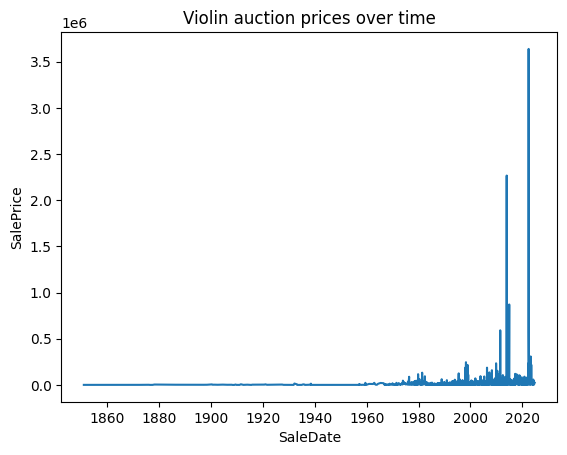

In [115]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.lineplot(x = 'SaleDate', y = 'SalePrice', data = violins, errorbar=None).set_title('Violin auction prices over time')
plt.show()

# Visualize with Plotly

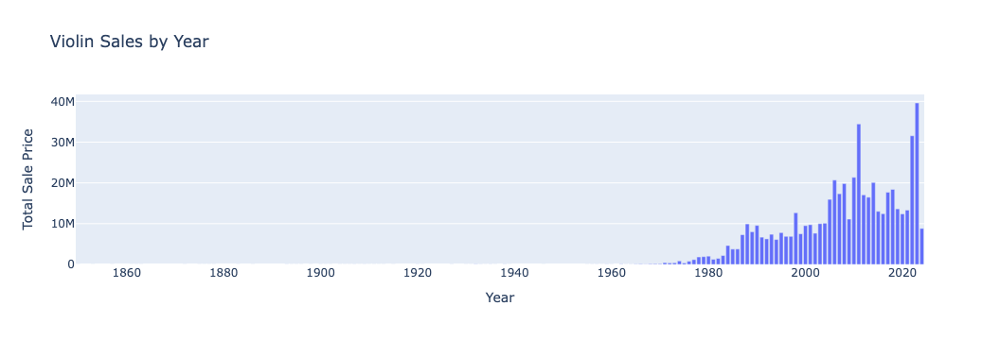

In [235]:
import plotly.express as px
import pandas as pd

# Data to plot
violins = Tarisio.query('Instrument == "Violin"').reset_index().drop(['index','MakerID'], axis=1)
# violins

# Group by 'Year' to get total sale price and count of sales per year
yearly_data = violins.groupby('Year').agg(
    total_sale_price=('SalePrice', 'sum'),
    sale_count=('SalePrice', 'count')
).reset_index()

# Create the histogram using aggregated data
fig = px.bar(
    yearly_data,
    x="Year",
    y="total_sale_price",
    labels={'total_sale_price': 'Total Sale Price', 'Year': 'Year'},
    title="Violin Sales by Year"
)

# Update hover information to show total sale price and count of sales
fig.update_traces(
    hovertemplate='Year: %{x}<br>Total Sale Price: %{y}<br>Instruments Sold: %{customdata}',
    customdata=yearly_data['sale_count']
)

# Display the plot
fig.show()

In [237]:
# Plots without interactive instrument counts

# import plotly.express as px
# import pandas as pd

# # Data to plot
# violins = Tarisio.query('Instrument == "Violin"').reset_index().drop(['index','MakerID'], axis=1)
# # violins

# # Create a histogram with plotly
# fig = px.histogram(
#     violins,
#     x="Year",
#     y="SalePrice",
#     nbins=300,  # Adjust the number of bins as needed
#     labels={'Year': 'Year', 'SalePrice': 'Total Sale Price'},
#     title="Violin Sale Prices by Year"
# )

# # Update hover information to show the count of sales in each bin
# fig.update_traces(hovertemplate='Year: %{x}<br>Total SalePrice: %{y}<br>Instruments Sold: %{text}',
#                   text=violins.groupby('Year')['Instrument'].count())

# # Display the plot
# fig.show()

In [254]:
# This did not graph well. Better graphs later

# import plotly.express as px
# import pandas as pd

# # Create a bar chart with Plotly
# fig = px.bar(violins, x="Year", y="SalePrice", title="Sale Price of Violins Over Time - bar chart")
# # fig = px.histogram(violins, x="Year", y="SalePrice", nbins=300, title="Sale Price of Violins Over Time")

# fig.update_layout(xaxis_title="Year", yaxis_title="Sale Price")

# fig.show()

## General code for creating a bar chart for any instrument in the dataset

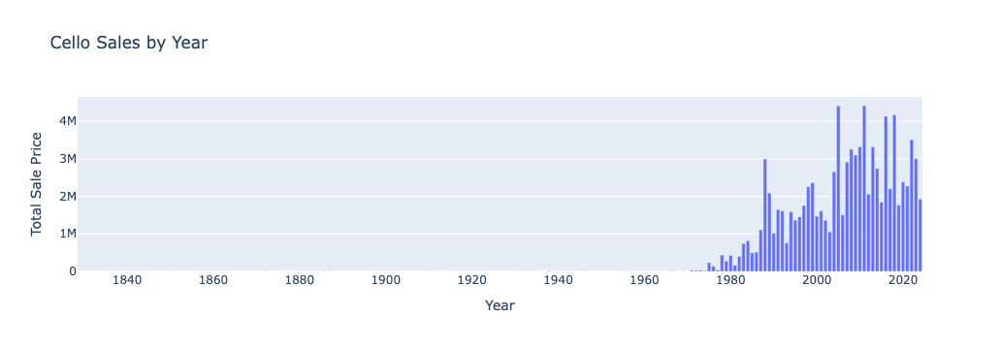

In [290]:
import plotly.express as px
import pandas as pd

def instrument_bar_chart(instrument):

    """
    Plot a bar chart of instrument SalePrice vs. Year.

    Parameters:
        instrument - Instrument field from the Tarisio df
    """

    # Data to plot
    inst = Tarisio.query(f'Instrument == "{instrument}"').reset_index().drop(['index','MakerID'], axis=1)

    # Group by 'Year' to get total sale price and count of sales per year
    yearly_data = inst.groupby('Year').agg(
        total_sale_price=('SalePrice', 'sum'),
        sale_count=('SalePrice', 'count')
    ).reset_index()
    
    # Create a histogram using aggregated data
    fig = px.bar(
        yearly_data,
        x="Year",
        y="total_sale_price",
        labels={'total_sale_price': 'Total Sale Price', 'Year': 'Year'},
        title=f'{instrument} Sales by Year'
    )

    # Update hover information to show total sale price and count of sales
    fig.update_traces(
        hovertemplate='Year: %{x}<br>Total Sale Price: %{y}<br>Instruments Sold: %{customdata}',
        customdata=yearly_data['sale_count']
    )

    # Display the plot
    fig.show()

instrument_bar_chart("Cello")

In [223]:
cellos.groupby('Year')['Instrument'].count()

Year
1829     1
1850     1
1857     1
1862     2
1872     2
        ..
2020    39
2021    37
2022    43
2023    79
2024    55
Name: Instrument, Length: 84, dtype: int64

In [197]:
viola_damore

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
0,Viola d'Amore,2017-05-12,10620,Tarisio,Milan,"Bisiach, Leandro I",Milan,Italy,2017
1,Viola d'Amore,2012-11-28,15600,Tarisio,Milan,"Bisiach, Leandro I",Milan,Italy,2012
2,Viola d'Amore,2010-06-28,60000,Tarisio,Naples,"Gagliano, Ferdinando",Naples,Italy,2010


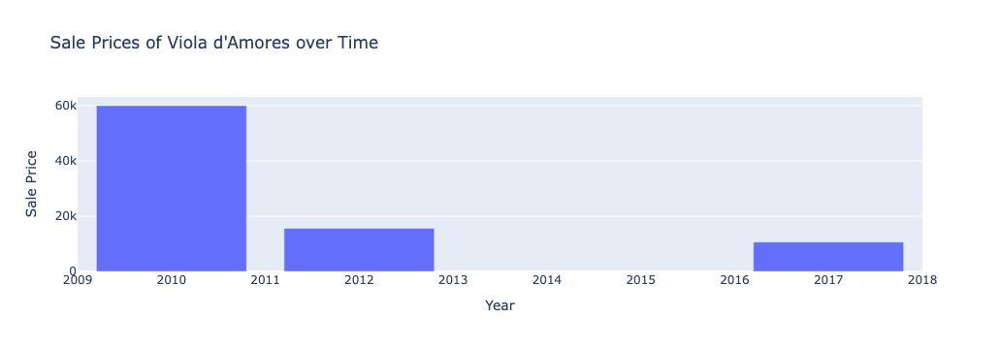

In [213]:
# visual for Viola d'Amore (3 entries) 
# Used a bar chart instead of a histogram, so the bins would not spread over the entire axis.
viola_damore = Tarisio.query('Instrument == "Viola d\'Amore"').reset_index().drop(['index','MakerID'], axis=1)
# viola_damore

import pandas as pd
import plotly.express as px

# Create the Plotly bar chart
fig = px.bar(viola_damore, x="Year", y="SalePrice", title="Sale Prices of Viola d'Amores over Time")
fig.update_layout(xaxis_title="Year", yaxis_title="Sale Price") #, template="plotly_white")

# Show the figure
fig.show()

In [313]:
Tarisio['Instrument'].count()

55283

In [321]:
violins.groupby('Country')['Instrument'].count().sum()

24369

In [319]:
violins.groupby('Country')['Instrument'].count()

Country
Algeria             14
Argentina           71
Australia            5
Austria            218
Belgium            614
Brazil               5
Canada              10
China                2
Czechia            342
Denmark             74
Egypt                5
France            5979
Germany           3449
Hungary            272
Ireland            195
Isle of Man          4
Israel               1
Italy             7934
Mexico               1
Monaco               2
Netherlands        220
New Zealand          3
Norway               4
Poland              35
Portugal            63
Romania             28
Russia               9
Slovakia            40
Slovenia             4
South Africa         1
Spain               63
Sweden               3
Switzerland        140
Turkey               1
US                1154
Ukraine              4
United Kingdom    3308
United States       75
Uruguay              2
Venezuela           15
Name: Instrument, dtype: int64

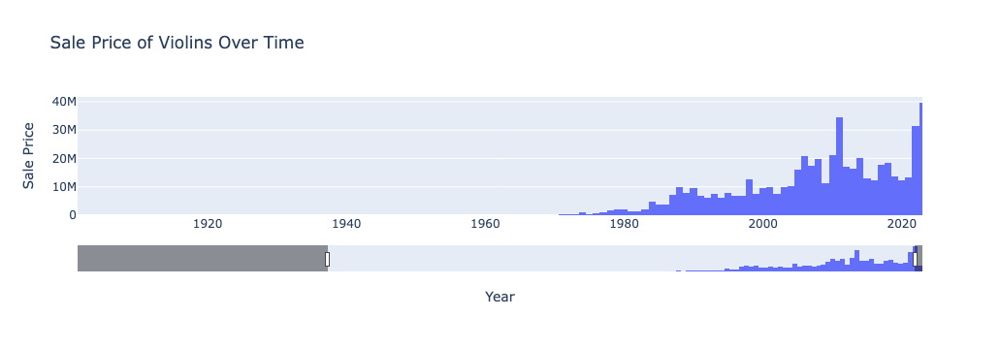

In [153]:
import plotly.express as px
import pandas as pd

# Create the histogram with Plotly
fig = px.histogram(violins, x="Year", y="SalePrice", nbins=300, title="Sale Price of Violins Over Time")
fig.update_layout(xaxis_title="Year", yaxis_title="Sale Price")

# Adding a date range slider
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=5, label="5y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

# Set y-axis to automatically adjust based on visible data
fig.update_yaxes(matches='y')
fig.update_yaxes(autorange=True)

fig.show()

# Violin Sale Prices Before 1960
[Return to Table of Contents](#Contents)

In [11]:
# look more closely at how prices have changed before 1960
violins_b1960 = violins[violins['SaleDate'] < '1960-01-01'].reset_index(drop=True)
violins_b1960

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country
0,Violin,1955-11-17,84,Puttick & Simpson,NaN,"Albani, Matthias II",Bolzano,Italy
1,Violin,1909-12-08,667,Puttick & Simpson,NaN,"Amati, Antonio & Girolamo",Cremona,Italy
2,Violin,1908-12-10,143,Puttick & Simpson,NaN,"Amati, Antonio & Girolamo",Cremona,Italy
3,Violin,1893-12-06,619,Puttick & Simpson,NaN,"Amati, Girolamo II",Cremona,Italy
4,Violin,1956-07-26,695,Puttick & Simpson,NaN,"Amati, Nicolò",Cremona,Italy
...,...,...,...,...,...,...,...,...
164,Violin,1915-06-29,114,Puttick & Simpson,NaN,"Toppani, Angelo",Rome,Italy
165,Violin,1956-05-24,362,Puttick & Simpson,NaN,"Valenzano, Joannes Maria",Barcelona,Spain
166,Violin,1946-09-26,460,Puttick & Simpson,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France
167,Violin,1909-10-27,319,Glendining & Co.,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France


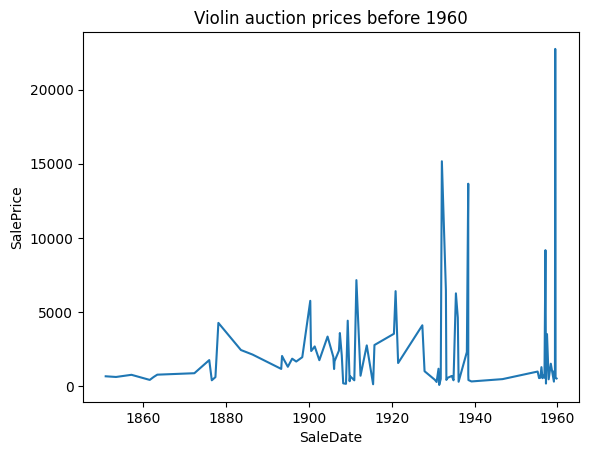

In [13]:
sns.lineplot(x = 'SaleDate', y = 'SalePrice', data = violins_b1960, errorbar=None).set_title('Violin auction prices before 1960')
plt.show()

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Exclude dates after 1960
violins_b1960 = violins[violins['SaleDate'] < '1960-01-01']

# Extract years from SaleDate for grouping
# violins_b1960.loc[:, ('Year')] = violins_b1960['SaleDate'].dt.year
# violins_b1960

violins_b1960['Year'] = violins_b1960['SaleDate'].dt.year
violins_b1960['Year']

/var/folders/tn/yy89yz_94q5b571nxcz7c_2m0000gn/T/ipykernel_72757/1157359694.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  violins_b1960['Year'] = violins_b1960['SaleDate'].dt.year


144      1955
301      1909
302      1908
319      1893
381      1956
         ... 
23204    1915
23344    1956
24237    1946
24238    1909
24239    1908
Name: Year, Length: 169, dtype: int32

In [18]:
violins_b1960

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
144,Violin,1955-11-17,84,Puttick & Simpson,NaN,"Albani, Matthias II",Bolzano,Italy,1955
301,Violin,1909-12-08,667,Puttick & Simpson,NaN,"Amati, Antonio & Girolamo",Cremona,Italy,1909
302,Violin,1908-12-10,143,Puttick & Simpson,NaN,"Amati, Antonio & Girolamo",Cremona,Italy,1908
319,Violin,1893-12-06,619,Puttick & Simpson,NaN,"Amati, Girolamo II",Cremona,Italy,1893
381,Violin,1956-07-26,695,Puttick & Simpson,NaN,"Amati, Nicolò",Cremona,Italy,1956
...,...,...,...,...,...,...,...,...,...
23204,Violin,1915-06-29,114,Puttick & Simpson,NaN,"Toppani, Angelo",Rome,Italy,1915
23344,Violin,1956-05-24,362,Puttick & Simpson,NaN,"Valenzano, Joannes Maria",Barcelona,Spain,1956
24237,Violin,1946-09-26,460,Puttick & Simpson,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France,1946
24238,Violin,1909-10-27,319,Glendining & Co.,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France,1909


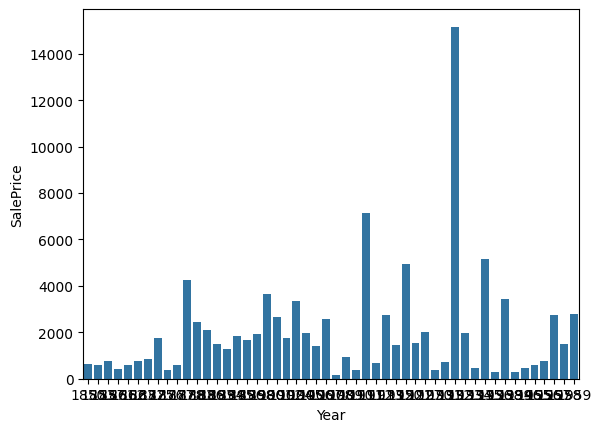

In [20]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# data to plot: violins_b1960

# Create year labels for the x-axis
labels = violins_b1960.Year.tolist()

# Define the label locations and width of bars 
x = np.arange(len(labels))  

# Create the figure
sns.barplot(violins_b1960, x='Year', y='SalePrice', errorbar=None) #, width=0.8, label='', color='red')

# Resize the figure   
plt.show()

In [22]:
violins_b1960

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
144,Violin,1955-11-17,84,Puttick & Simpson,NaN,"Albani, Matthias II",Bolzano,Italy,1955
301,Violin,1909-12-08,667,Puttick & Simpson,NaN,"Amati, Antonio & Girolamo",Cremona,Italy,1909
302,Violin,1908-12-10,143,Puttick & Simpson,NaN,"Amati, Antonio & Girolamo",Cremona,Italy,1908
319,Violin,1893-12-06,619,Puttick & Simpson,NaN,"Amati, Girolamo II",Cremona,Italy,1893
381,Violin,1956-07-26,695,Puttick & Simpson,NaN,"Amati, Nicolò",Cremona,Italy,1956
...,...,...,...,...,...,...,...,...,...
23204,Violin,1915-06-29,114,Puttick & Simpson,NaN,"Toppani, Angelo",Rome,Italy,1915
23344,Violin,1956-05-24,362,Puttick & Simpson,NaN,"Valenzano, Joannes Maria",Barcelona,Spain,1956
24237,Violin,1946-09-26,460,Puttick & Simpson,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France,1946
24238,Violin,1909-10-27,319,Glendining & Co.,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France,1909


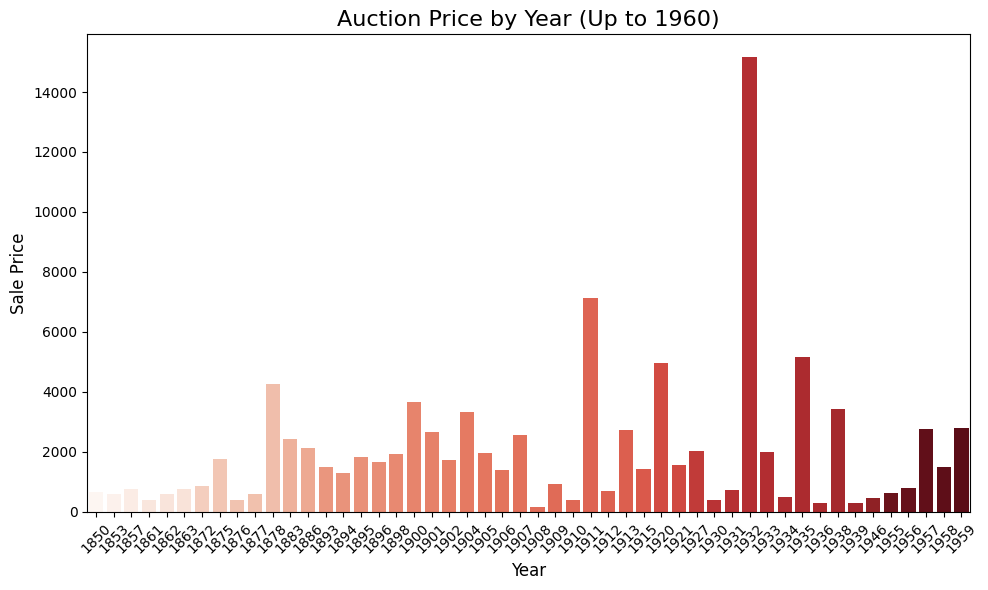

In [24]:
# # Calculate average SalePrice for year
# avg_price_per_year = df_filtered.groupby('Year')['SalePrice'].mean().reset_index()

# Create barplot with seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x='Year', y='SalePrice', data=violins_b1960, palette='Reds', hue='Year', legend=False, errorbar=None)

# Customize the plot
plt.title('Auction Price by Year (Up to 1960)', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Sale Price', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

In [26]:
violins_b1960.groupby('Year').count()

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country
Year,,,,,,,,
1850,2,2,2,2,0,2,2,2
1853,1,1,1,1,0,1,1,1
1857,7,7,7,7,0,7,7,7
1861,1,1,1,1,0,1,1,1
1862,2,2,2,2,0,2,2,2
1863,2,2,2,2,0,2,2,2
1872,9,9,9,9,0,9,9,9
1875,1,1,1,1,0,1,1,1
1876,1,1,1,1,0,1,1,1


In [28]:
# What instruments sold in 1932? 
violins_b1960[violins_b1960['Year'] == 1932]

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
11421,Violin,1932-02-05,16000,Anderson Galleries Inc.,NaN,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,1932
11422,Violin,1932-02-05,15500,Anderson Galleries Inc.,NaN,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,1932
22067,Violin,1932-02-05,14000,Anderson Galleries Inc.,NaN,"Stradivari, Antonio",Cremona,Italy,1932


In [30]:
import pandas as pd
import matplotlib.pyplot as plt

# Create a column, 'Year', for grouping
violins_b1960['SaleDate'].dt.year

144      1955
301      1909
302      1908
319      1893
381      1956
         ... 
23204    1915
23344    1956
24237    1946
24238    1909
24239    1908
Name: SaleDate, Length: 169, dtype: int32

/var/folders/tn/yy89yz_94q5b571nxcz7c_2m0000gn/T/ipykernel_72757/164159155.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  violins_b1960['Year'] = violins_b1960['SaleDate'].dt.year
/var/folders/tn/yy89yz_94q5b571nxcz7c_2m0000gn/T/ipykernel_72757/164159155.py:22: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


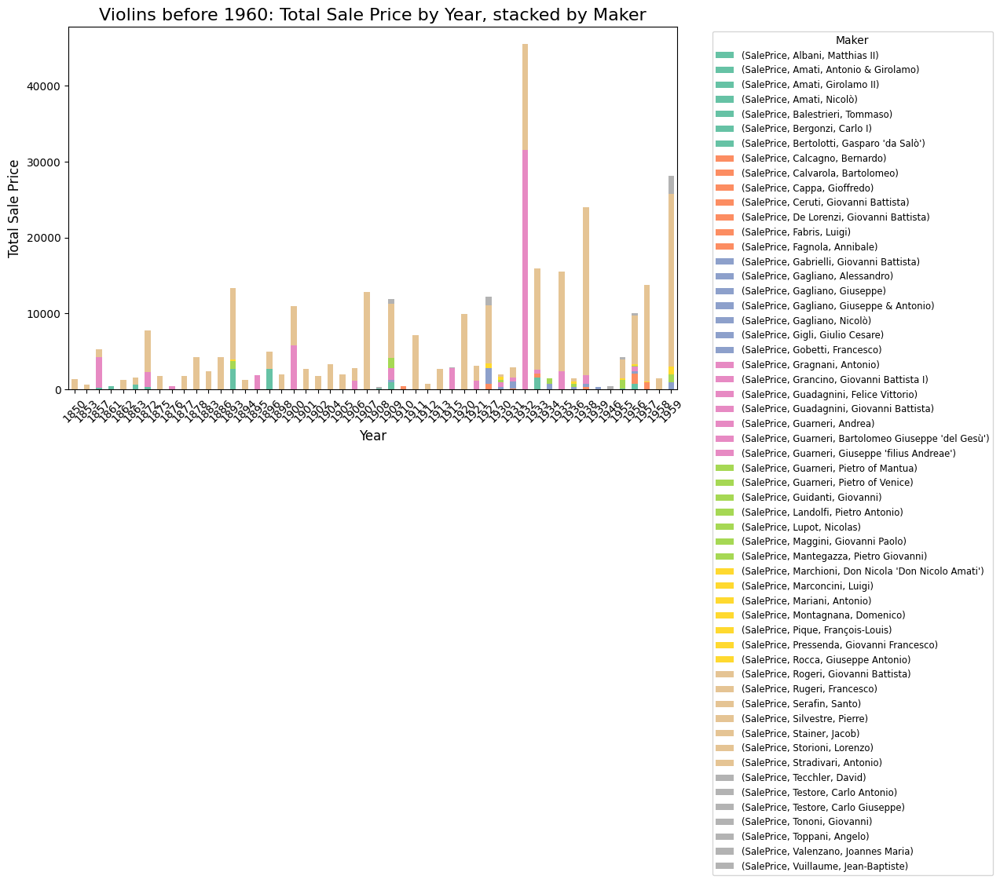

In [32]:
# import libraries
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
violins_b1960 = violins[violins['SaleDate'] < '1960-01-01']

# Extract years from SaleDate for grouping
violins_b1960['Year'] = violins_b1960['SaleDate'].dt.year

# Group by 'Year' and 'Maker', and compute average SalePrice
df_grouped = violins_b1960.groupby(['Year', 'Maker']).agg({'SalePrice': 'sum'}).unstack().fillna(0)

# Create a stacked bar chart, partitioned by 'Maker'
ax = df_grouped.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='Set2')

# Customize the plot
plt.title('Violins before 1960: Total Sale Price by Year, stacked by Maker', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Sale Price', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()

# Move the legend outside the plot area
ax.legend(title='Maker', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title_fontsize='medium')

# Show the plot
plt.show()

In [34]:
df_grouped = violins_b1960.groupby(['Year', 'Maker'])['SalePrice'].count()
df_grouped

Year  Maker                                   
1850  Stradivari, Antonio                         2
1853  Stradivari, Antonio                         1
1857  Amati, Nicolò                               1
      Guarneri, Bartolomeo Giuseppe 'del Gesù'    5
      Stradivari, Antonio                         1
                                                 ..
1959  Marchioni, Don Nicola 'Don Nicolo Amati'    1
      Marconcini, Luigi                           2
      Stradivari, Antonio                         1
      Testore, Carlo Antonio                      2
      Tononi, Giovanni                            1
Name: SalePrice, Length: 135, dtype: int64

In [36]:
df_grouped = violins_b1960.groupby(['Year', 'Maker'])['SalePrice'].sum().unstack(fill_value=0)
df_grouped

Maker,"Albani, Matthias II","Amati, Antonio & Girolamo","Amati, Girolamo II","Amati, Nicolò","Balestrieri, Tommaso","Bergonzi, Carlo I","Bertolotti, Gasparo 'da Salò'","Calcagno, Bernardo","Calvarola, Bartolomeo","Cappa, Gioffredo",...,"Stainer, Jacob","Storioni, Lorenzo","Stradivari, Antonio","Tecchler, David","Testore, Carlo Antonio","Testore, Carlo Giuseppe","Tononi, Giovanni","Toppani, Angelo","Valenzano, Joannes Maria","Vuillaume, Jean-Baptiste"
Year,,,,,,,,,,,,,,,,,,,,,
1850,0,0,0,0,0,0,0,0,0,0,...,0,0,1303,0,0,0,0,0,0,0
1853,0,0,0,0,0,0,0,0,0,0,...,0,0,606,0,0,0,0,0,0,0
1857,0,0,0,195,0,0,0,0,0,0,...,0,0,973,0,0,0,0,0,0,0
1861,0,0,0,407,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1862,0,0,0,0,0,0,0,0,0,0,...,0,0,1207,0,0,0,0,0,0,0
1863,0,0,0,0,0,637,0,0,0,0,...,0,0,885,0,0,0,0,0,0,0
1872,0,0,0,339,0,0,0,0,0,0,...,0,0,5448,0,0,0,0,0,0,0
1875,0,0,0,0,0,0,0,0,0,0,...,0,0,1745,0,0,0,0,0,0,0
1876,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


/var/folders/tn/yy89yz_94q5b571nxcz7c_2m0000gn/T/ipykernel_72757/3629823850.py:22: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


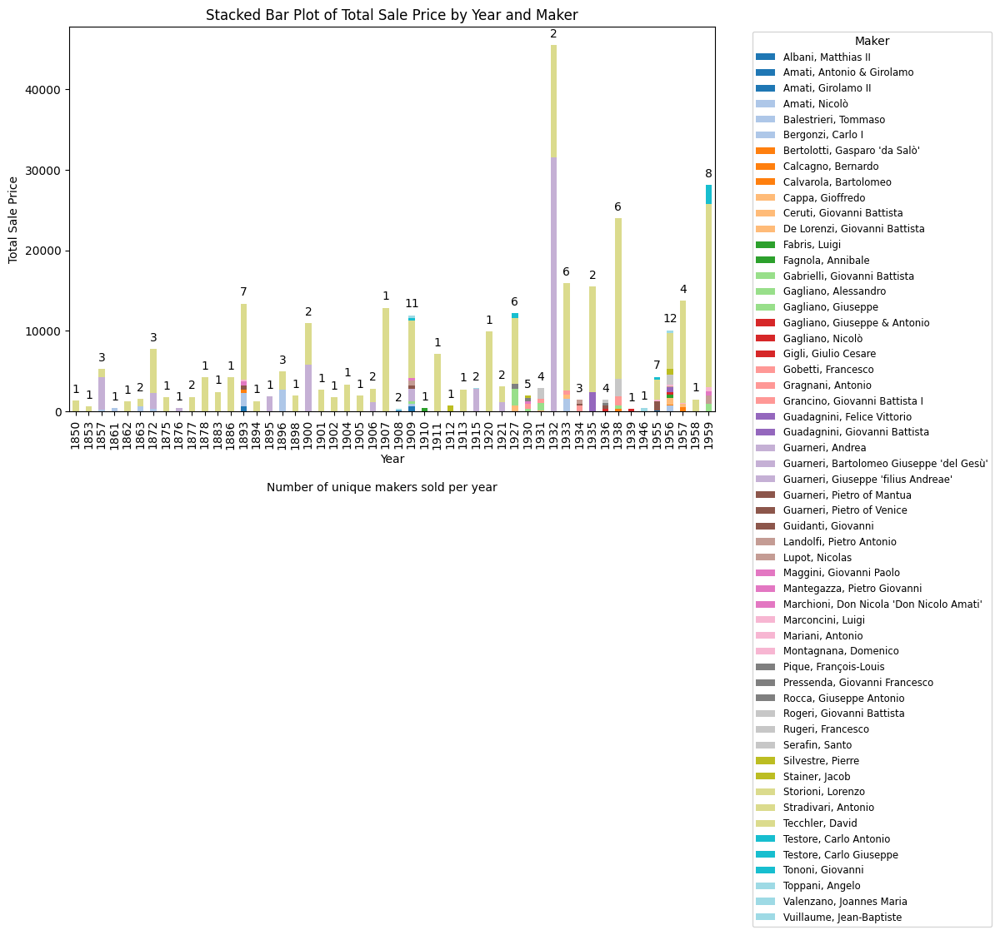

In [38]:
# Group by 'Year' and 'Maker' and sum 'SalePrice' for each maker per year
df_grouped = violins_b1960.groupby(['Year', 'Maker'])['SalePrice'].sum().unstack(fill_value=0)

# Plot stacked bar chart
ax = df_grouped.plot(kind='bar', stacked=True, figsize=(10, 6), colormap="tab20")
plt.xlabel('Year')
plt.ylabel('Total Sale Price')
plt.title('Stacked Bar Plot of Total Sale Price by Year and Maker')
plt.legend(title='Maker')

# Annotate each bar with the count of makers per year
for i, year in enumerate(df_grouped.index):
    total_makers = (df_grouped.loc[year] > 0).sum()
    plt.text(i, df_grouped.loc[year].sum() + 1000, f'{total_makers}', ha='center')

# Move the legend outside the plot area
ax.legend(title='Maker', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title_fontsize='medium')

# Add caption
plt.figtext(0.5, -0.05, "Number of unique makers sold per year", ha="center", fontsize=10)

plt.tight_layout()
plt.show()

In [40]:
violins_b1960

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
144,Violin,1955-11-17,84,Puttick & Simpson,NaN,"Albani, Matthias II",Bolzano,Italy,1955
301,Violin,1909-12-08,667,Puttick & Simpson,NaN,"Amati, Antonio & Girolamo",Cremona,Italy,1909
302,Violin,1908-12-10,143,Puttick & Simpson,NaN,"Amati, Antonio & Girolamo",Cremona,Italy,1908
319,Violin,1893-12-06,619,Puttick & Simpson,NaN,"Amati, Girolamo II",Cremona,Italy,1893
381,Violin,1956-07-26,695,Puttick & Simpson,NaN,"Amati, Nicolò",Cremona,Italy,1956
...,...,...,...,...,...,...,...,...,...
23204,Violin,1915-06-29,114,Puttick & Simpson,NaN,"Toppani, Angelo",Rome,Italy,1915
23344,Violin,1956-05-24,362,Puttick & Simpson,NaN,"Valenzano, Joannes Maria",Barcelona,Spain,1956
24237,Violin,1946-09-26,460,Puttick & Simpson,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France,1946
24238,Violin,1909-10-27,319,Glendining & Co.,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France,1909


/var/folders/tn/yy89yz_94q5b571nxcz7c_2m0000gn/T/ipykernel_72757/2380791056.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


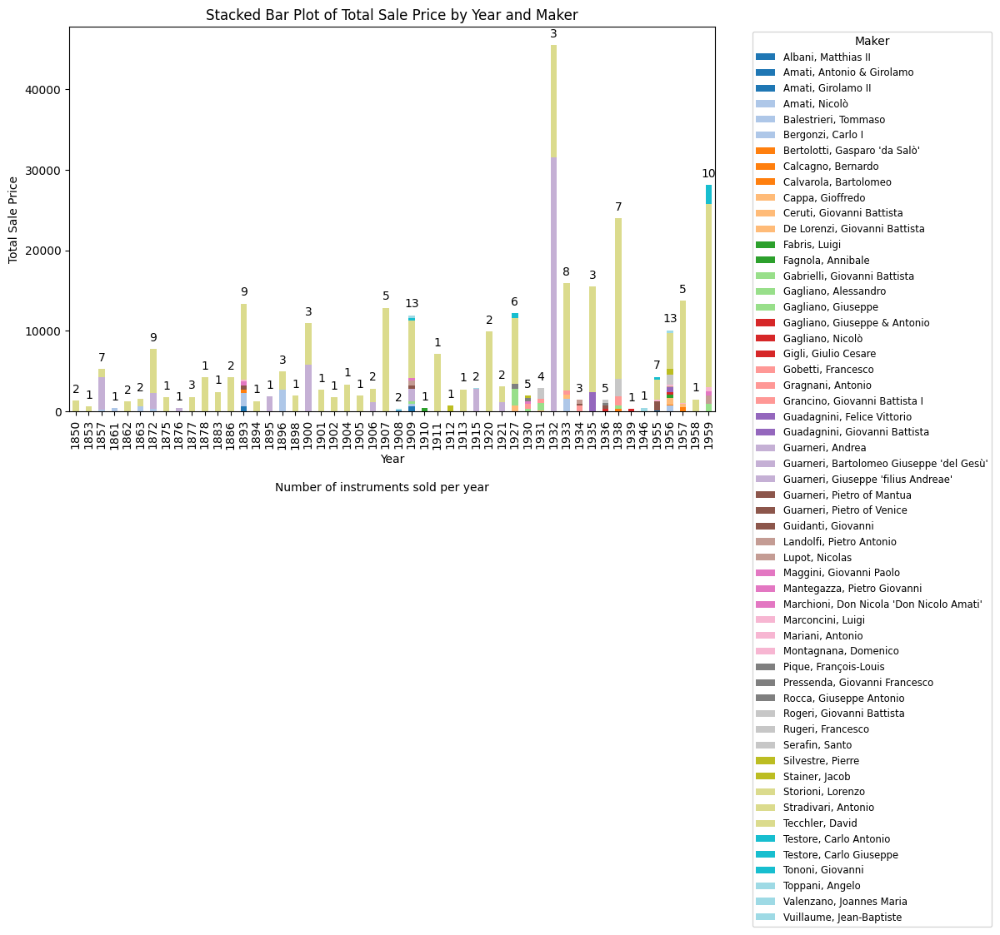

In [42]:
import pandas as pd
import matplotlib.pyplot as plt

# Group by 'Year' and 'Maker' and sum 'SalePrice' for each maker per year
df_grouped = violins_b1960.groupby(['Year', 'Maker'])['SalePrice'].sum().unstack(fill_value=0)

# Plot stacked bar chart
ax = df_grouped.plot(kind='bar', stacked=True, figsize=(10, 6), colormap="tab20")
plt.xlabel('Year')
plt.ylabel('Total Sale Price')
plt.title('Stacked Bar Plot of Total Sale Price by Year and Maker')
plt.legend(title='Maker')

# Annotate each bar with the total number of instruments sold per year
for i, year in enumerate(df_grouped.index):
    total_instruments = (violins_b1960['Year'] == year).sum()
    plt.text(i, df_grouped.loc[year].sum() + 1000, f'{total_instruments}', ha='center')

# Move the legend outside the plot area
ax.legend(title='Maker', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title_fontsize='medium')

# Add caption
plt.figtext(0.5, -0.05, "Number of instruments sold per year", ha="center", fontsize=10)

plt.tight_layout()
plt.show()

#

# Violin Sale Prices Between 1960 and 1980
[Return to Table of Contents](#Contents)

In [44]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Include sale dates from 1960 - 1980
violins_6080 = violins[(violins['SaleDate'] >= '1960-01-01') & (violins['SaleDate'] < '1980-01-01')]

# Extract years from SaleDate for grouping
violins_6080['Year'] = violins_6080['SaleDate'].dt.year
violins_6080['Year']

/var/folders/tn/yy89yz_94q5b571nxcz7c_2m0000gn/T/ipykernel_72757/1861267167.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  violins_6080['Year'] = violins_6080['SaleDate'].dt.year


170      1976
171      1973
197      1976
254      1978
298      1979
         ... 
24236    1963
24345    1973
24346    1971
24347    1971
24348    1969
Name: Year, Length: 575, dtype: int32

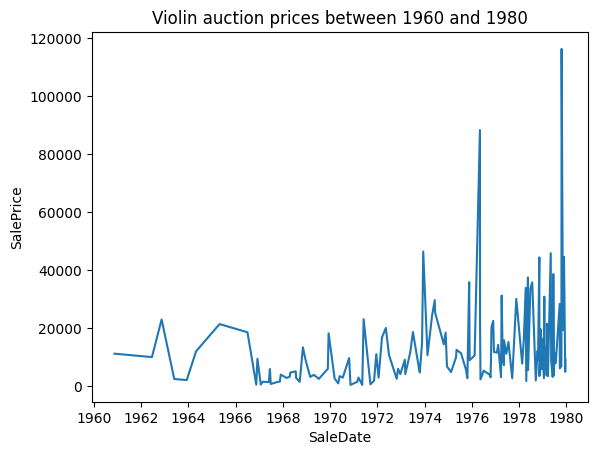

In [46]:
sns.lineplot(x = 'SaleDate', y = 'SalePrice', data = violins_6080, errorbar=None).set_title('Violin auction prices between 1960 and 1980')
plt.show()

# Violin Sale Prices Between 1980 and 2010
[Return to Table of Contents](#Contents)

In [48]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Include sale dates from 1980 - 2010
violins_8010 = violins[(violins['SaleDate'] >= '1980-01-01') & (violins['SaleDate'] < '2010-01-01')]

In [50]:
violins_8010

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,"Achner, Michael",Mittenwald,Germany
3,Violin,2008-11-15,3884,Bongartz's,NaN,"Achner, Philip",Mittenwald,Germany
4,Violin,1990-03-27,2146,Sotheby's,Mittenwald,"Achner, Philip",Mittenwald,Germany
7,Violin,2007-10-25,4388,Tarisio,Mirecourt,"Acoulon, Alexandre Alfred",Mirecourt,France
8,Violin,1994-07-19,1365,Bonhams,Paris,"Acoulon, Alexandre Alfred",Mirecourt,France
...,...,...,...,...,...,...,...,...
25254,Violin,1987-04-23,540,Phillip's,Passau,"Zwerger, Anton II",Passau,Germany
25261,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel","Brooklyn, NY",US
25262,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel","Brooklyn, NY",US
25263,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US


In [119]:
# Extract years from SaleDate for grouping
violins_8010['Year'] = violins_8010['SaleDate'].dt.year
violins_8010['Year']

/var/folders/tn/yy89yz_94q5b571nxcz7c_2m0000gn/T/ipykernel_50645/251298398.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  violins_8010['Year'] = violins_8010['SaleDate'].dt.year


1        1987
3        2008
4        1990
7        2007
8        1994
         ... 
25254    1987
25261    2009
25262    2009
25263    2003
25264    2003
Name: Year, Length: 17531, dtype: int32

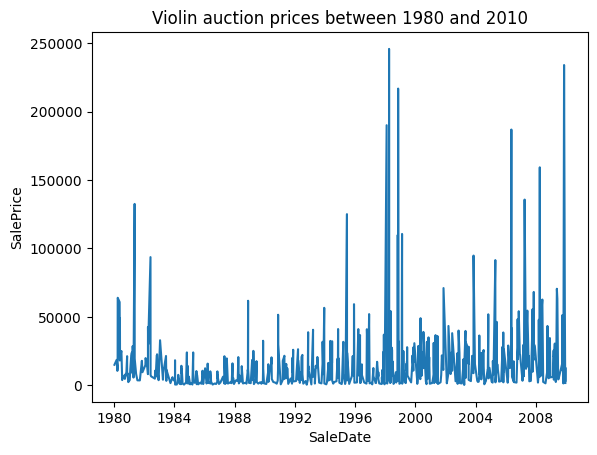

In [52]:
sns.lineplot(x = 'SaleDate', y = 'SalePrice', data = violins_8010, errorbar=None).set_title('Violin auction prices between 1980 and 2010')
plt.show()

# Violin Sale Prices After 2010
[Return to Table of Contents](#Contents)

In [54]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sale dates from after 2010
violins_2010 = violins[violins['SaleDate'] >= '2010-01-01']

# Extract years from SaleDate for grouping
violins_2010['Year'] = violins_2010['SaleDate'].dt.year
violins_2010

/var/folders/tn/yy89yz_94q5b571nxcz7c_2m0000gn/T/ipykernel_72757/2437010251.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  violins_2010['Year'] = violins_2010['SaleDate'].dt.year


,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
0,Violin,2010-02-20,4200,Tarisio,Wallgau,"Achner, Michael",Mittenwald,Germany,2010
2,Violin,2018-05-17,24000,Tarisio,Mittenwald,"Achner, Philip",Mittenwald,Germany,2018
5,Violin,2019-11-08,2950,Tarisio,NaN,"Acoulon, Alexandre Alfred",Mirecourt,France,2019
6,Violin,2013-10-16,3000,Tarisio,Paris,"Acoulon, Alexandre Alfred",Mirecourt,France,2013
23,Violin,2017-06-27,3767,Tarisio,Copenhagen,"Adamsen, Peter Petersen",Copenhagen,Denmark,2017
...,...,...,...,...,...,...,...,...,...
25256,Violin,2016-02-26,102000,Tarisio,"New York, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2016
25257,Violin,2015-10-24,102000,Tarisio,"New York, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2015
25258,Violin,2014-10-17,57000,Tarisio,"New York, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2014
25259,Violin,2013-05-03,84000,Tarisio,"Brooklyn, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2013


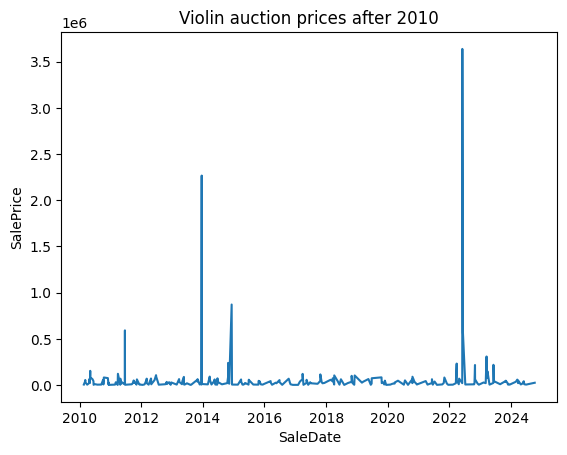

In [56]:
sns.lineplot(x = 'SaleDate', y = 'SalePrice', data = violins_2010, errorbar=None).set_title('Violin auction prices after 2010')
plt.show()

# Price Ranges
[Return to Table of Contents](#Contents)

In [58]:
# Look at extreme outliers
violins_above_million = violins[violins['SalePrice'] >= 1000000]
print(len(violins_above_million))
violins_above_million

36


,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country
1961,Violin,2005-11-01,1001384,Sotheby's,Cremona,"Bergonzi, Carlo I",Cremona,Italy
11211,Violin,2021-11-02,1062767,NaN,Piacenza,"Guadagnini, Giovanni Battista",Como,Italy
11216,Violin,2019-05-17,1160000,Tarisio,Milan,"Guadagnini, Giovanni Battista",Como,Italy
11217,Violin,2018-06-25,2106933,Tarisio,Turin,"Guadagnini, Giovanni Battista",Como,Italy
11218,Violin,2018-02-22,1253000,Tarisio,Turin,"Guadagnini, Giovanni Battista",Como,Italy
11220,Violin,2017-03-27,1019895,Tarisio,Turin,"Guadagnini, Giovanni Battista",Como,Italy
11222,Violin,2016-10-14,1253000,Tarisio,Milan,"Guadagnini, Giovanni Battista",Como,Italy
11224,Violin,2014-10-28,1178475,J & A Beare Auctions,Turin,"Guadagnini, Giovanni Battista",Como,Italy
11225,Violin,2013-10-16,1390000,Tarisio,Turin,"Guadagnini, Giovanni Battista",Como,Italy
11227,Violin,2011-11-11,1080000,Tarisio,Turin,"Guadagnini, Giovanni Battista",Como,Italy


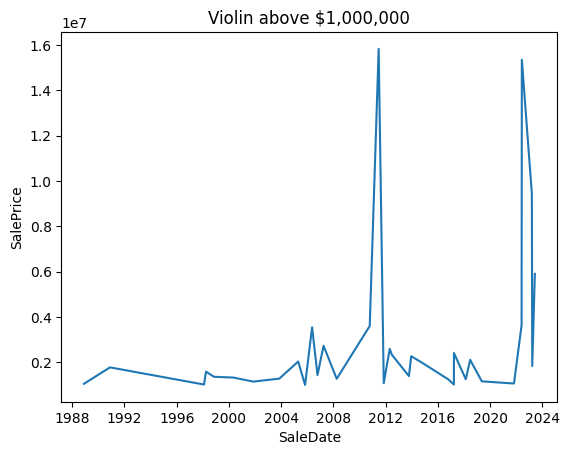

In [60]:
sns.lineplot(x = 'SaleDate', y = 'SalePrice', data = violins_above_million, errorbar=None).set_title('Violin above $1,000,000')
plt.show()

In [62]:
# Violins since 2010 between $500,000 and $1,000,000
print(len(violins_2010[(violins_2010['SalePrice'] > 500000) & (violins_2010['SalePrice'] <= 1000000)]))
violins_2010[(violins_2010['SalePrice'] > 500000) & (violins_2010['SalePrice'] <= 1000000)]

30


,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
309,Violin,2018-10-30,917453,Ingles & Hayday,Cremona,"Amati, Girolamo II",Cremona,Italy,2018
311,Violin,2013-10-30,507436,Tarisio,Cremona,"Amati, Girolamo II",Cremona,Italy,2013
326,Violin,2013-05-21,654588,Ingles & Hayday,Cremona,"Amati, Nicolò",Cremona,Italy,2013
328,Violin,2010-10-15,576000,Tarisio,Cremona,"Amati, Nicolò",Cremona,Italy,2010
1292,Violin,2015-03-30,621575,Ingles & Hayday,Mantua,"Balestrieri, Tommaso",Cremona,Italy,2015
11207,Violin,2024-03-15,750000,NaN,Milan,"Guadagnini, Giovanni Battista",Como,Italy,2024
11209,Violin,2023-10-24,732193,NaN,Piacenza,"Guadagnini, Giovanni Battista",Como,Italy,2023
11210,Violin,2022-11-01,853226,NaN,Piacenza,"Guadagnini, Giovanni Battista",Como,Italy,2022
11213,Violin,2021-11-19,540000,NaN,Milan,"Guadagnini, Giovanni Battista",Como,Italy,2021
11226,Violin,2013-05-03,716000,Tarisio,Milan,"Guadagnini, Giovanni Battista",Como,Italy,2013


In [64]:
# Violins between $250,000 and $500,000 since 2010
print(len(violins_2010[(violins_2010['SalePrice'] > 250000) & (violins_2010['SalePrice'] <= 500000)]))
violins_2010[(violins_2010['SalePrice'] > 250000) & (violins_2010['SalePrice'] <= 500000)]

109


,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
257,Violin,2023-06-06,327282,NaN,Cremona,"Amati, Andrea",Cremona,Italy,2023
260,Violin,2023-10-31,320432,NaN,Cremona,"Amati, Antonio & Girolamo",Cremona,Italy,2023
268,Violin,2011-11-11,447200,Tarisio,Cremona,"Amati, Antonio & Girolamo",Cremona,Italy,2011
308,Violin,2023-03-23,369426,NaN,Cremona,"Amati, Girolamo II",Cremona,Italy,2023
310,Violin,2015-10-24,405500,Tarisio,Cremona,"Amati, Girolamo II",Cremona,Italy,2015
...,...,...,...,...,...,...,...,...,...
23942,Violin,2019-05-17,258600,Tarisio,Paris,"Vuillaume, Jean-Baptiste",Mirecourt,France,2019
23944,Violin,2018-12-05,322932,Vichy-Enchères,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France,2018
23950,Violin,2018-03-20,252191,Ingles & Hayday,Paris,"Vuillaume, Jean-Baptiste",Mirecourt,France,2018
23965,Violin,2015-11-04,251563,Tarisio,Paris,"Vuillaume, Jean-Baptiste",Mirecourt,France,2015


In [66]:
# Violins between $100,000 and $250,000 since 2010
violins_2010[(violins_2010['SalePrice'] > 100000) & (violins_2010['SalePrice'] <= 250000)]

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
262,Violin,2020-10-20,202327,Ingles & Hayday,Cremona,"Amati, Antonio & Girolamo",Cremona,Italy,2020
263,Violin,2019-03-18,190660,Brompton's,Cremona,"Amati, Antonio & Girolamo",Cremona,Italy,2019
264,Violin,2017-11-09,106200,Tarisio,Cremona,"Amati, Antonio & Girolamo",Cremona,Italy,2017
266,Violin,2015-06-30,242999,Tarisio,Cremona,"Amati, Antonio & Girolamo",Cremona,Italy,2015
269,Violin,2011-06-09,114090,Vichy-Enchères,NaN,"Amati, Antonio & Girolamo",Cremona,Italy,2011
...,...,...,...,...,...,...,...,...,...
24004,Violin,2010-03-09,145904,Sotheby's,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France,2010
25255,Violin,2019-03-01,132000,Tarisio,"New York, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2019
25256,Violin,2016-02-26,102000,Tarisio,"New York, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2016
25257,Violin,2015-10-24,102000,Tarisio,"New York, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2015


# Maker Trends
Looking at violins by specific makers

[Return to Table of Contents](#Contents)

### Strads

In [68]:
# Find a single violin maker
Strads = violins[violins['Maker'].str.contains('Strad')]
Strads

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country
21948,Violin,2023-06-09,5900000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21949,Violin,2023-03-28,2215565,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21950,Violin,2023-03-28,1452426,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21951,Violin,2022-06-10,15340000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21952,Violin,2017-03-28,2410310,Ingles & Hayday,Cremona,"Stradivari, Antonio",Cremona,Italy
...,...,...,...,...,...,...,...,...
22115,Violin,1974-04-25,36045,Sotheby's,NaN,"Stradivari, Francesco",Cremona,Italy
22116,Violin,2016-05-13,156000,Tarisio,Cremona,"Stradivari, Omobono Felice",Cremona,Italy
22117,Violin,2005-11-04,370000,Tarisio,Cremona,"Stradivari, Omobono Felice",Cremona,Italy
22118,Violin,1976-05-06,28059,Sotheby's,NaN,"Stradivari, Omobono Felice",Cremona,Italy


### Strads_Antonio

In [72]:
# Find a single violin maker
Strads_Antonio = violins[(violins['Maker'].str.contains('Strad')) & (violins['Maker'].str.contains('Antonio'))]
Strads_Antonio

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country
21948,Violin,2023-06-09,5900000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21949,Violin,2023-03-28,2215565,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21950,Violin,2023-03-28,1452426,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21951,Violin,2022-06-10,15340000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21952,Violin,2017-03-28,2410310,Ingles & Hayday,Cremona,"Stradivari, Antonio",Cremona,Italy
...,...,...,...,...,...,...,...,...
22109,Violin,1862-06-26,853,Puttick & Simpson,NaN,"Stradivari, Antonio",Cremona,Italy
22110,Violin,1857-02-18,973,Christie & Manson,NaN,"Stradivari, Antonio",Cremona,Italy
22111,Violin,1853-05-28,606,Puttick & Simpson,NaN,"Stradivari, Antonio",Cremona,Italy
22112,Violin,1850-11-28,588,Puttick & Simpson,NaN,"Stradivari, Antonio",Cremona,Italy


In [74]:
Strads_Antonio.sort_values(by=['SalePrice'], ascending=False)

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country
21956,Violin,2011-06-22,15821285,Tarisio,Cremona,"Stradivari, Antonio",Cremona,Italy
21951,Violin,2022-06-10,15340000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21948,Violin,2023-06-09,5900000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21958,Violin,2010-10-15,3600000,Tarisio,Cremona,"Stradivari, Antonio",Cremona,Italy
21962,Violin,2006-05-16,3544000,Christie's,NaN,"Stradivari, Antonio",Cremona,Italy
...,...,...,...,...,...,...,...,...
22112,Violin,1850-11-28,588,Puttick & Simpson,NaN,"Stradivari, Antonio",Cremona,Italy
22102,Violin,1872-04-29,548,Christie's,NaN,"Stradivari, Antonio",Cremona,Italy
22103,Violin,1872-04-29,416,Christie's,NaN,"Stradivari, Antonio",Cremona,Italy
22108,Violin,1862-06-26,354,Puttick & Simpson,NaN,"Stradivari, Antonio",Cremona,Italy


In [76]:
Strads_Antonio['SaleDate'].min()

Timestamp('1850-11-28 00:00:00')

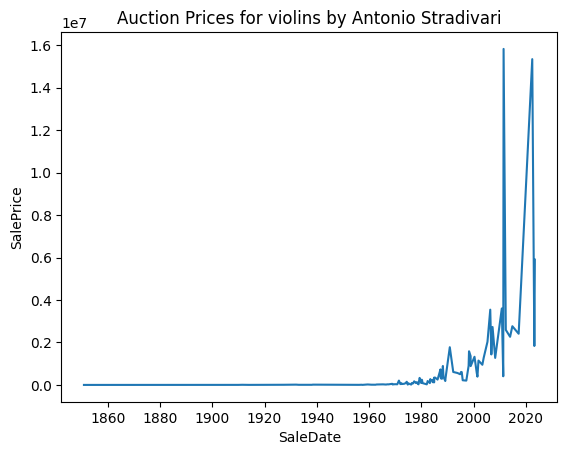

In [78]:
sns.lineplot(x = 'SaleDate', y = 'SalePrice', data = Strads_Antonio, errorbar=None).set_title('Auction Prices for violins by Antonio Stradivari')
plt.show()

In [80]:
# Add a field, 'Year', to violins dataframe
violins['Year'] = violins['SaleDate'].dt.year
violins.head()

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
0,Violin,2010-02-20,4200,Tarisio,Wallgau,"Achner, Michael",Mittenwald,Germany,2010
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,"Achner, Michael",Mittenwald,Germany,1987
2,Violin,2018-05-17,24000,Tarisio,Mittenwald,"Achner, Philip",Mittenwald,Germany,2018
3,Violin,2008-11-15,3884,Bongartz's,NaN,"Achner, Philip",Mittenwald,Germany,2008
4,Violin,1990-03-27,2146,Sotheby's,Mittenwald,"Achner, Philip",Mittenwald,Germany,1990


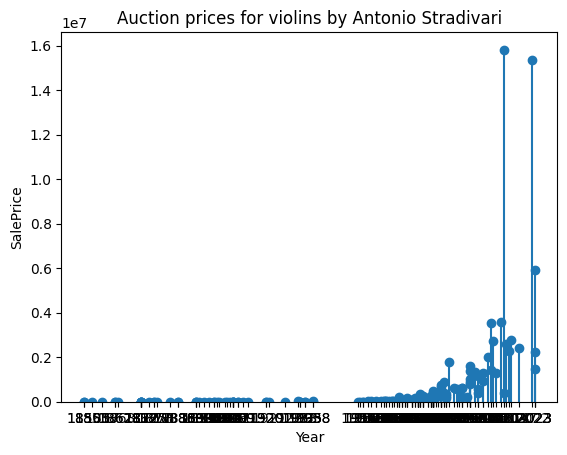

In [82]:
# importing modules 
from pandas import *
import matplotlib.pyplot as plt 

# Maker data
Strads_Antonio = violins[(violins['Maker'].str.contains('Strad')) & (violins['Maker'].str.contains('Antonio'))]

# creating an empty chart 
fig, axes = plt.subplots() 

# plotting using plt.stem 
axes.stem(Strads_Antonio['Year'], Strads_Antonio['SalePrice'], basefmt=' ') 

# starting value of y-axis 
axes.set_ylim(0) 

# details and formatting of chart 
plt.title('Auction prices for violins by Antonio Stradivari') 
plt.xlabel('Year') 
plt.ylabel('SalePrice') 
plt.xticks(Strads_Antonio['Year']) 

plt.show()

In [85]:
violins_above_million.sort_values('SalePrice', ascending=False)

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country
21956,Violin,2011-06-22,15821285,Tarisio,Cremona,"Stradivari, Antonio",Cremona,Italy
21951,Violin,2022-06-10,15340000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
11402,Violin,2023-03-17,9440000,NaN,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy
21948,Violin,2023-06-09,5900000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
11403,Violin,2022-06-03,3637892,NaN,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy
21958,Violin,2010-10-15,3600000,Tarisio,Cremona,"Stradivari, Antonio",Cremona,Italy
21962,Violin,2006-05-16,3544000,Christie's,NaN,"Stradivari, Antonio",Cremona,Italy
21953,Violin,2014-10-28,2764767,J & A Beare Auctions,Cremona,"Stradivari, Antonio",Cremona,Italy
21960,Violin,2007-04-02,2728000,Christie's,Cremona,"Stradivari, Antonio",Cremona,Italy
21955,Violin,2012-04-27,2592000,Tarisio,Cremona,"Stradivari, Antonio",Cremona,Italy


In [87]:
# How many violins auctioned above $1 million?
len(violins_above_million)

36

In [89]:
violins_above_million.count()

Instrument      36
SaleDate        36
SalePrice       36
AuctionHouse    29
AuctionCity     34
Maker           36
City            36
Country         36
dtype: int64

In [91]:
# How many unique makers are above $1 million dollars? 
violins_above_million.groupby('Maker').count()

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,City,Country
Maker,,,,,,,
"Bergonzi, Carlo I",1,1,1,1,1,1,1
"Guadagnini, Giovanni Battista",9,9,9,8,9,9,9
"Guarneri, Bartolomeo Giuseppe 'del Gesù'",4,4,4,2,4,4,4
"Stradivari, Antonio",22,22,22,18,20,22,22


In [93]:
# What are their highest sale prices?
violins_above_million.groupby('Maker').SalePrice.max()

Maker
Bergonzi, Carlo I                            1001384
Guadagnini, Giovanni Battista                2106933
Guarneri, Bartolomeo Giuseppe 'del Gesù'     9440000
Stradivari, Antonio                         15821285
Name: SalePrice, dtype: int64

In [95]:
# Lowest sale prices? 
violins_above_million.groupby('Maker').SalePrice.min()

Maker
Bergonzi, Carlo I                           1001384
Guadagnini, Giovanni Battista               1019895
Guarneri, Bartolomeo Giuseppe 'del Gesù'    1050764
Stradivari, Antonio                         1017862
Name: SalePrice, dtype: int64

In [97]:
# When did the first violin fetch more than $1 million at auction?
violins_above_million['SaleDate'].min()

Timestamp('1988-11-23 00:00:00')

In [99]:
# What instrument? 
violins_above_million.loc[violins_above_million['SaleDate'] == '1988-11-23']

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country
11409,Violin,1988-11-23,1050764,Sotheby's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy


In [101]:
violins_above_million.sort_values('SaleDate')

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country
11409,Violin,1988-11-23,1050764,Sotheby's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy
21982,Violin,1990-11-21,1775587,Christie's,Cremona,"Stradivari, Antonio",Cremona,Italy
21973,Violin,1998-02-03,1017862,Tajan,Cremona,"Stradivari, Antonio",Cremona,Italy
21972,Violin,1998-04-01,1586115,Christie's,Cremona,"Stradivari, Antonio",Cremona,Italy
21970,Violin,1998-11-09,1360222,Bongartz's,NaN,"Stradivari, Antonio",Cremona,Italy
21969,Violin,2000-05-05,1326000,Christie's,Cremona,"Stradivari, Antonio",Cremona,Italy
21966,Violin,2001-11-13,1147509,Sotheby's,Cremona,"Stradivari, Antonio",Cremona,Italy
21964,Violin,2003-11-11,1279076,Sotheby's,Cremona,"Stradivari, Antonio",Cremona,Italy
21963,Violin,2005-04-22,2032000,Christie's,Cremona,"Stradivari, Antonio",Cremona,Italy
1961,Violin,2005-11-01,1001384,Sotheby's,Cremona,"Bergonzi, Carlo I",Cremona,Italy


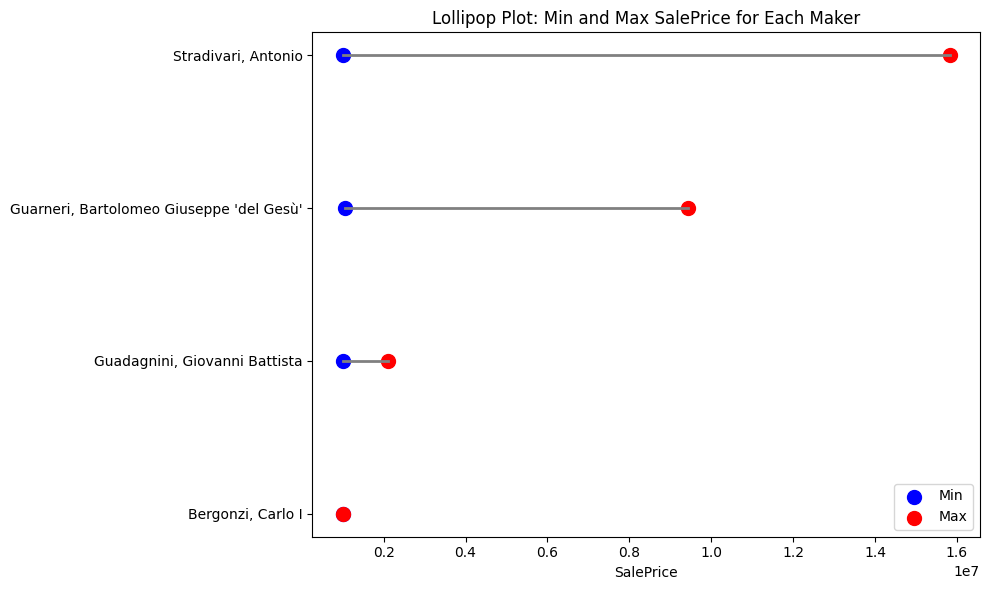

In [103]:
# Data for plot
violins_above_million = violins[violins['SalePrice'] >= 1000000]

# Group by 'Maker' and calculate min and max SalePrice
min_max_prices = violins_above_million.groupby('Maker')['SalePrice'].agg(['min', 'max']).reset_index()

# Plotting a lollipop plot using matplotlib
plt.figure(figsize=(10, 6))

# Loop through each maker to create a lollipop
for idx, row in min_max_prices.iterrows():
    plt.plot([row['min'], row['max']], [idx, idx], color='grey', linewidth=2)  # Line between min and max
    plt.scatter(row['min'], idx, color='blue', s=100, label='Min' if idx == 0 else "")  # Min point
    plt.scatter(row['max'], idx, color='red', s=100, label='Max' if idx == 0 else "")  # Max point

# Customize the plot
plt.yticks(range(len(min_max_prices)), min_max_prices['Maker'])
plt.xlabel('SalePrice')
plt.title('Lollipop Plot: Min and Max SalePrice for Each Maker')
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()

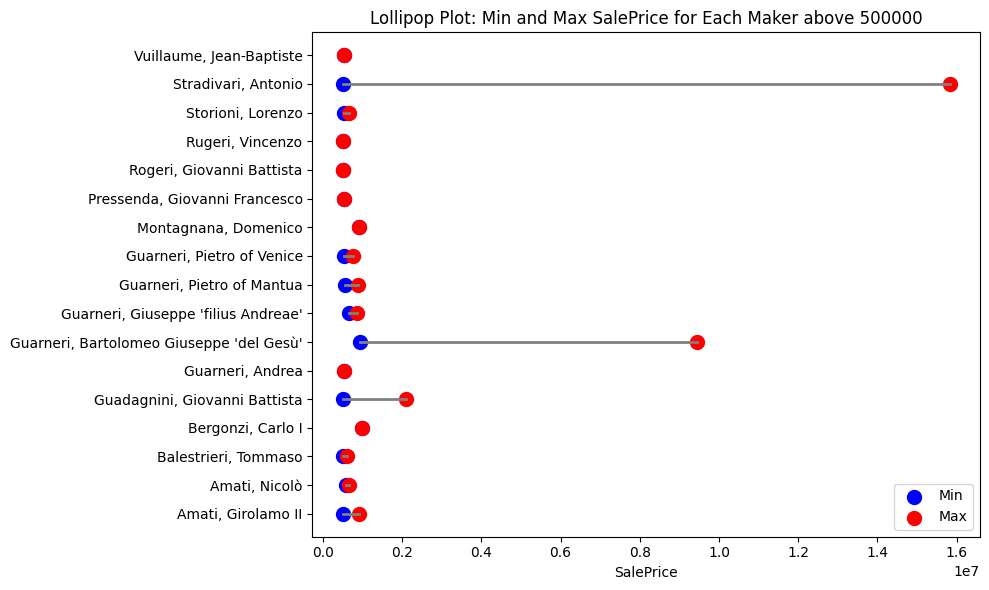

In [105]:
# Data for plot
violins_above = violins[violins['SalePrice'] >= 500000]

# Group by 'Maker' and calculate min and max SalePrice
min_max_prices = violins_above.groupby('Maker')['SalePrice'].agg(['min', 'max']).reset_index()

# Plotting a lollipop plot using matplotlib
plt.figure(figsize=(10, 6))

# Loop through each maker to create a lollipop
for idx, row in min_max_prices.iterrows():
    plt.plot([row['min'], row['max']], [idx, idx], color='grey', linewidth=2)  # Line between min and max
    plt.scatter(row['min'], idx, color='blue', s=100, label='Min' if idx == 0 else "")  # Min point
    plt.scatter(row['max'], idx, color='red', s=100, label='Max' if idx == 0 else "")  # Max point

# Customize the plot
plt.yticks(range(len(min_max_prices)), min_max_prices['Maker'])
plt.xlabel('SalePrice')
plt.title('Lollipop Plot: Min and Max SalePrice for Each Maker above 500000')
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()

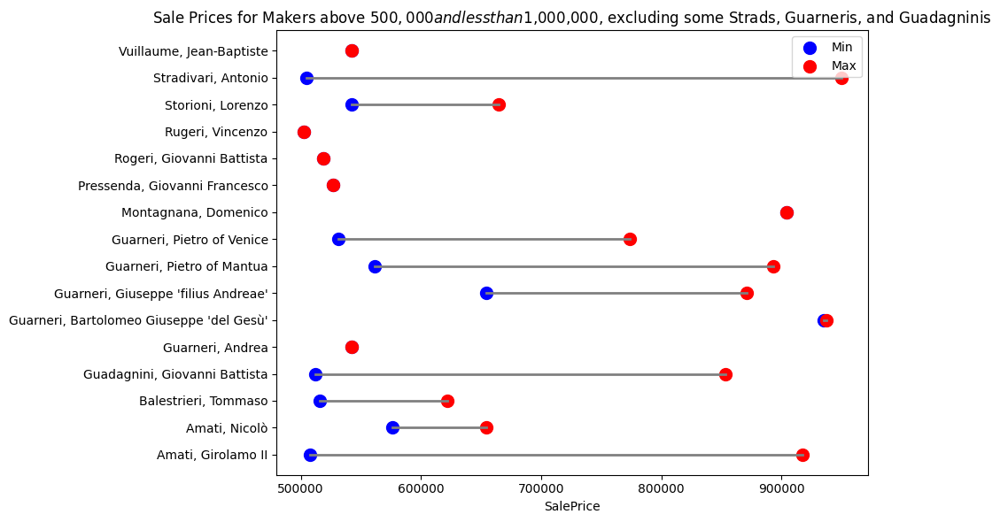

In [107]:
# Remove Strads (Antonio), Guarneris, and Guadagninis
# Violins between $500,000 and $1,000,0000
violins_above = violins[(violins['SalePrice'] >= 500000) & (violins['SalePrice'] < 1000000)]

# Group by 'Maker' and calculate min and max SalePrice
min_max_prices = violins_above.groupby('Maker')['SalePrice'].agg(['min', 'max']).reset_index()

# Plotting a lollipop plot using matplotlib
plt.figure(figsize=(10, 6))

# Loop through each maker to create a lollipop
for idx, row in min_max_prices.iterrows():
    plt.plot([row['min'], row['max']], [idx, idx], color='grey', linewidth=2)  # Line between min and max
    plt.scatter(row['min'], idx, color='blue', s=100, label='Min' if idx == 0 else "")  # Min point
    plt.scatter(row['max'], idx, color='red', s=100, label='Max' if idx == 0 else "")  # Max point

# Customize the plot
plt.yticks(range(len(min_max_prices)), min_max_prices['Maker'])
plt.xlabel('SalePrice')
plt.title('Sale Prices for Makers above $500,000 and less than $1,000,000, excluding some Strads, Guarneris, and Guadagninis')
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()

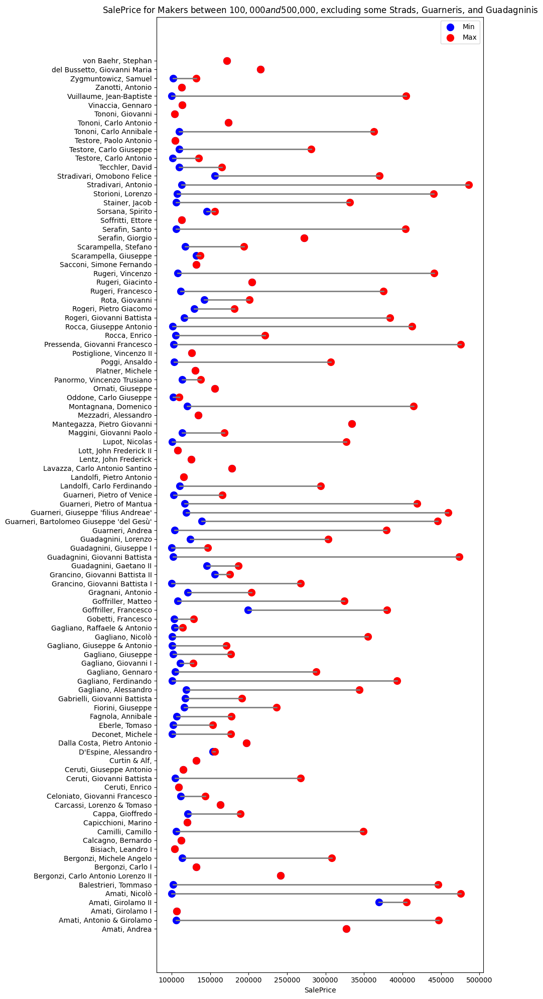

In [109]:
# Consider violins between $100,000 and $500,000, excluding some Strads (Antonio), Guarneris, and Guadagninis
# Violins above $500000
violins_mid = violins[(violins['SalePrice'] >= 100000) & (violins['SalePrice'] < 500000)]

# Group by 'Maker' and calculate min and max SalePrice
min_max_prices = violins_mid.groupby('Maker')['SalePrice'].agg(['min', 'max']).reset_index()

# Plotting a lollipop plot using matplotlib
plt.figure(figsize=(10, 20))

# Loop through each maker to create a lollipop
for idx, row in min_max_prices.iterrows():
    plt.plot([row['min'], row['max']], [idx, idx], color='grey', linewidth=2)  # Line between min and max
    plt.scatter(row['min'], idx, color='blue', s=100, label='Min' if idx == 0 else "")  # Min point
    plt.scatter(row['max'], idx, color='red', s=100, label='Max' if idx == 0 else "")  # Max point

# Customize the plot
plt.yticks(range(len(min_max_prices)), min_max_prices['Maker'])
plt.xlabel('SalePrice')
plt.title('SalePrice for Makers between $100,000 and $500,000, excluding some Strads, Guarneris, and Guadagninis')
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()

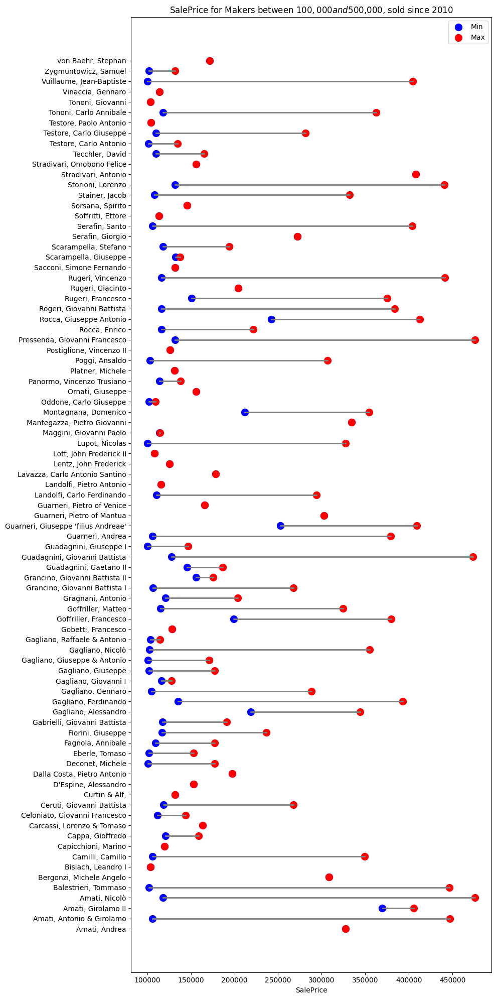

In [110]:
# Consider violins between $100,000 and $500,000, sold since 2010, 
# excluding violins above $1,000,000
vlns = violins_2010[(violins_2010['SalePrice'] >= 100000) & (violins_2010['SalePrice'] < 500000)]

# Group by 'Maker' and calculate min and max SalePrice
min_max_prices = vlns.groupby('Maker')['SalePrice'].agg(['min', 'max']).reset_index()

# Plotting a lollipop plot using matplotlib
plt.figure(figsize=(10, 20))

# Loop through each maker to create a lollipop
for idx, row in min_max_prices.iterrows():
    plt.plot([row['min'], row['max']], [idx, idx], color='grey', linewidth=2)  # Line between min and max
    plt.scatter(row['min'], idx, color='blue', s=100, label='Min' if idx == 0 else "")  # Min point
    plt.scatter(row['max'], idx, color='red', s=100, label='Max' if idx == 0 else "")  # Max point

# Customize the plot
plt.yticks(range(len(min_max_prices)), min_max_prices['Maker'])
plt.xlabel('SalePrice')
plt.title('SalePrice for Makers between $100,000 and $500,000, sold since 2010')
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()

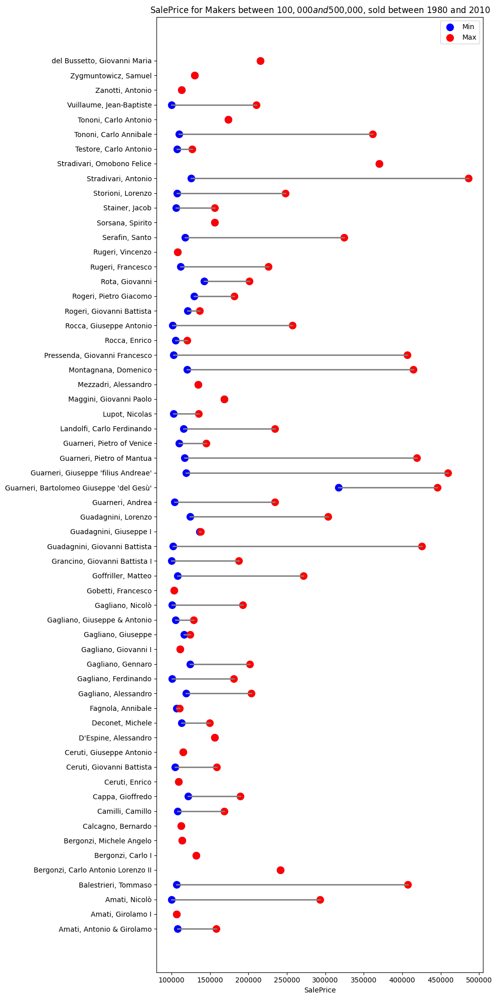

In [112]:
# Consider violins between $100,000 and $500,000, sold since between 1980 and 2010, 
# excluding violins above $1,000,000
vlns = violins_8010[(violins_8010['SalePrice'] >= 100000) & (violins_8010['SalePrice'] < 500000)]

# Group by 'Maker' and calculate min and max SalePrice
min_max_prices = vlns.groupby('Maker')['SalePrice'].agg(['min', 'max']).reset_index()

# Plotting a lollipop plot using matplotlib
plt.figure(figsize=(10, 20))

# Loop through each maker to create a lollipop
for idx, row in min_max_prices.iterrows():
    plt.plot([row['min'], row['max']], [idx, idx], color='grey', linewidth=2)  # Line between min and max
    plt.scatter(row['min'], idx, color='blue', s=100, label='Min' if idx == 0 else "")  # Min point
    plt.scatter(row['max'], idx, color='red', s=100, label='Max' if idx == 0 else "")  # Max point

# Customize the plot
plt.yticks(range(len(min_max_prices)), min_max_prices['Maker'])
plt.xlabel('SalePrice')
plt.title('SalePrice for Makers between $100,000 and $500,000, sold between 1980 and 2010')
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()

Interactive by decade
Interactive by Maker (select makers)

Also, select instrument (violin, viola, bow, etc)

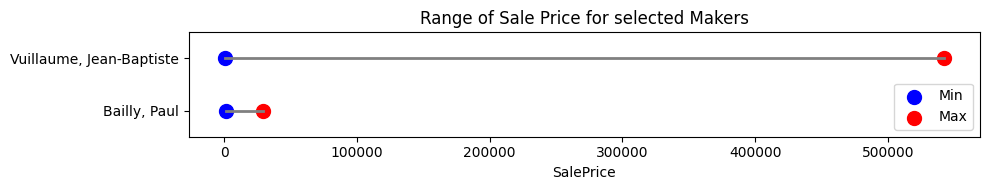

In [420]:

# User input data
Tarisio_inst = Tarisio[Tarisio['Instrument'] == 'Violin']
maker1 = 'Bailly, Paul'
maker2 = 'Vuillaume, Jean-Baptiste'
selected_makers = Tarisio_inst[Tarisio_inst['Maker'].isin([maker1, maker2])]
selected_makers

# Group by 'Maker' and calculate min and max SalePrice

min_max_prices = selected_makers.groupby('Maker')['SalePrice'].agg(['min', 'max']).reset_index()
min_max_prices

# Plotting a lollipop plot using matplotlib
plt.figure(figsize=(10, 2))

# Loop through each maker to create a lollipop
for idx, row in min_max_prices.iterrows():
    plt.plot([row['min'], row['max']], [idx, idx], color='grey', linewidth=2)  # Line between min and max
    plt.scatter(row['min'], idx, color='blue', s=100, label='Min' if idx == 0 else "")  # Min point
    plt.scatter(row['max'], idx, color='red', s=100, label='Max' if idx == 0 else "")  # Max point

# Customize the plot
plt.yticks(range(len(min_max_prices)), min_max_prices['Maker'])
plt.xlabel('SalePrice')
plt.title('Range of Sale Price for selected Makers')
plt.legend()
plt.tight_layout()

# Define the padding value and add padding to the top and bottom of the graph
padding = 0.5
plt.ylim(-padding, len(min_max_prices) - 1 + padding)

# Show the plot
plt.show()

### Using Plotly

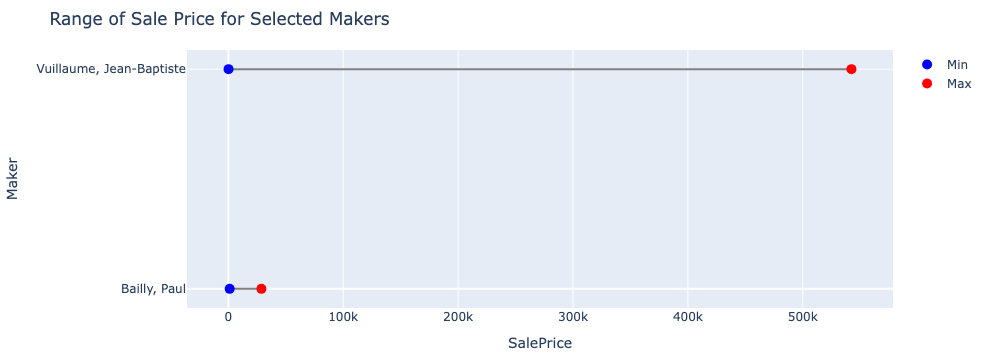

In [493]:
import plotly.graph_objects as go
import pandas as pd

# User input data
Tarisio_inst = Tarisio[Tarisio['Instrument'] == 'Violin']
maker1 = 'Bailly, Paul'
maker2 = 'Vuillaume, Jean-Baptiste'
selected_makers = Tarisio_inst[Tarisio_inst['Maker'].isin([maker1, maker2])]
selected_makers


# Group by 'Maker' and calculate min and max SalePrice

min_max_prices = selected_makers.groupby('Maker')['SalePrice'].agg(['min', 'max']).reset_index()
min_max_prices

# Create the figure
fig = go.Figure()

# Add lines and scatter points for each maker
# Add a switch so that the min/max legend only appears one time
legend_status = True    # Turn legend on
for idx, row in min_max_prices.iterrows():
    # Add line (lollipop stick)
    fig.add_trace(go.Scatter(
        x=[row['min'], row['max']],
        y=[idx, idx],
        mode='lines',
        line=dict(color='grey', width=2),
        showlegend=False
    ))

    # Add min point
    fig.add_trace(go.Scatter(
        x=[row['min']],
        y=[idx],
        mode='markers',
        marker=dict(color='blue', size=10),
        name='Min' if idx == 0 else "",  # Add legend entry only once
        showlegend=legend_status
    ))

    # Add max point
    fig.add_trace(go.Scatter(
        x=[row['max']],
        y=[idx],
        mode='markers',
        marker=dict(color='red', size=10),
        name='Max' if idx == 0 else "",  # Add legend entry only once
        showlegend=legend_status

    ))
    legend_status = False       # Turn legend off

# Customize layout
fig.update_layout(
    title="Range of Sale Price for Selected Makers",
    xaxis_title="SalePrice",
    yaxis=dict(
        tickvals=list(range(len(min_max_prices))),
        ticktext=min_max_prices['Maker'],
        title="Maker"
    ),
    #legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    margin=dict(l=100, r=20, t=50, b=20),
    height=150  # Adjust height to control vertical spacing
)

# Show the plot
fig.show()

### vlns_by_region

Look at just a few regions in the violins dataset.

In [119]:
vlns_by_region = violins.groupby(['Country'])['SalePrice'].sum()
vlns_by_region = pd.DataFrame(vlns_by_region).reset_index()
vlns_by_region.sort_values(by=['SalePrice'], ascending=False)

,Country,SalePrice
17,Italy,413129498
11,France,64765254
12,Germany,27250915
36,United Kingdom,15399553
34,US,10057400
4,Belgium,4289968
20,Netherlands,3729736
3,Austria,3166358
14,Ireland,2812910
13,Hungary,1786836


### Look at the top regions contributing at least $1 million in sales

In [122]:
by_region1 = Tarisio.groupby(['Country'])['SalePrice'].sum()
by_region1 = pd.DataFrame(by_region1).reset_index()
by_region1.sort_values(by=['SalePrice'], ascending=False)

,Country,SalePrice
20,Italy,496303640
14,France,168867485
40,United Kingdom,48848838
15,Germany,40006499
4,Belgium,23375085
38,US,17160968
23,Netherlands,5080619
3,Austria,3865957
17,Ireland,3242874
16,Hungary,2299096


### vln_top_regions

Top countries with the highest aggregate SalePrice, violins only

In [125]:
Italy_df   = violins[violins['Country'] == 'Italy']
France_df  = violins[violins['Country'] == 'France']
UK_df      = violins[violins['Country'] == 'United Kingdom']
Germany_df = violins[violins['Country'] == 'Germany']
US_df      = violins[violins['Country'] == 'US']
Belgium_df = violins[violins['Country'] == 'Belgium']
Nlands_df  = violins[violins['Country'] == 'Netherlands']
Austria_df = violins[violins['Country'] == 'Austria']
Ireland_df = violins[violins['Country'] == 'Ireland']
Hungary_df = violins[violins['Country'] == 'Hungary']
Czechia_df = violins[violins['Country'] == 'Czechia']

import pandas as pd
vln_top_regions = pd.concat(
    [Italy_df, France_df, UK_df, Germany_df, US_df, 
     Belgium_df, Nlands_df, Austria_df, Ireland_df, 
     Hungary_df, Czechia_df ]
)
vln_top_regions

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
33,Violin,2019-11-08,4130,Tarisio,Milan,"Agostinelli, Luigi",Gubbio,Italy,2019
34,Violin,2018-06-25,3603,Tarisio,Milan,"Agostinelli, Luigi",Gubbio,Italy,2018
35,Violin,2017-10-23,5934,Tarisio,Turin,"Agostinelli, Luigi",Gubbio,Italy,2017
36,Violin,2013-10-16,4800,Tarisio,Milan,"Agostinelli, Luigi",Gubbio,Italy,2013
37,Violin,2005-10-16,4700,Skinner,Milan,"Agostinelli, Luigi",Gubbio,Italy,2005
...,...,...,...,...,...,...,...,...,...
24450,Violin,2019-10-21,4054,Brompton's,Znojmo,"Wassermann, Joseph",Znojmo,Czechia,2019
24451,Violin,2008-03-31,3706,Dorotheum,NaN,"Wassermann, Joseph",Znojmo,Czechia,2008
24452,Violin,1990-03-27,5366,Sotheby's,NaN,"Wassermann, Joseph",Znojmo,Czechia,1990
24758,Violin,1995-05-11,143,Phillip's,Rochdale,"Wild, Franz Anton",Brno,Czechia,1995


### Violin plot: maker regions
[Return to Table of Contents](#Contents)

In [145]:
Tarisio

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country
0,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Mittenwald,Germany
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Mittenwald,Germany
2,Violin,2018-05-17,24000,Tarisio,Mittenwald,2611,"Achner, Philip",Mittenwald,Germany
3,Violin,2008-11-15,3884,Bongartz's,NaN,2611,"Achner, Philip",Mittenwald,Germany
4,Violin,1990-03-27,2146,Sotheby's,Mittenwald,2611,"Achner, Philip",Mittenwald,Germany
...,...,...,...,...,...,...,...,...,...
55278,Violin,2012-04-27,108000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel","Brooklyn, NY",US
55279,Violin,2009-12-14,15634,Brompton's,NaN,844,"Zygmuntowicz, Samuel","Brooklyn, NY",US
55280,Violin,2009-12-14,15634,Brompton's,NaN,844,"Zygmuntowicz, Samuel","Brooklyn, NY",US
55281,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY",844,"Zygmuntowicz, Samuel","Brooklyn, NY",US


In [147]:
Tarisio['Maker'].nunique()

3573

In [149]:
Tarisio['Country'].nunique()

44

### by_region

From Tarisio, group Makers by Country and return the sum total Sale Price for each maker in that country.

In [153]:
by_region = Tarisio.groupby(['Country', 'Maker'])['SalePrice'].sum()
by_region = pd.DataFrame(by_region).reset_index()
by_region

,Country,Maker,SalePrice
0,Algeria,"Bauer, Jean",124833
1,Algeria,"Peyrot, Alfred",583
2,Argentina,"Baldoni, Dante",59190
3,Argentina,"Bruni, Mateo",30396
4,Argentina,"Capalbo, Giovanni",6900
...,...,...,...
3078,United States,"Smart, Winfred",2070
3079,United States,"Watson, William D.",440258
3080,United States,"Woodward, C.F.",6436
3081,Uruguay,"Fulquet, Annibal",6703


In [155]:
by_region['Country'].nunique()

44

In [157]:
by_region['Maker'].nunique()

3080

In [159]:
by_region[by_region['Maker'].str.contains('Strad')]

,Country,Maker,SalePrice
2071,Italy,"Stradivari, Antonio",101516606
2072,Italy,"Stradivari, Francesco",71595
2073,Italy,"Stradivari, Omobono Felice",568883


In [161]:
c = Tarisio[(Tarisio['Maker'].str.contains('Strad')) & (Tarisio['Maker'].str.contains('Antonio'))]
c['SalePrice'].sum()

101516606

# Why are these different? 

Number of unique makers is different in by_region (grouped Tarisio) and Tarisio

In [170]:
# number of unique makers in the grouped dataframe
by_region['Maker'].nunique()

3080

In [172]:
# number of unique makers in Tarisio
Tarisio['Maker'].nunique()

3573

# Regional Trends
[Return to Table of Contents](#Contents)

In [175]:
by_region = Tarisio.groupby(['Country', 'Maker'])['SalePrice'].sum()
by_region = pd.DataFrame(by_region).reset_index()
by_region

,Country,Maker,SalePrice
0,Algeria,"Bauer, Jean",124833
1,Algeria,"Peyrot, Alfred",583
2,Argentina,"Baldoni, Dante",59190
3,Argentina,"Bruni, Mateo",30396
4,Argentina,"Capalbo, Giovanni",6900
...,...,...,...
3078,United States,"Smart, Winfred",2070
3079,United States,"Watson, William D.",440258
3080,United States,"Woodward, C.F.",6436
3081,Uruguay,"Fulquet, Annibal",6703


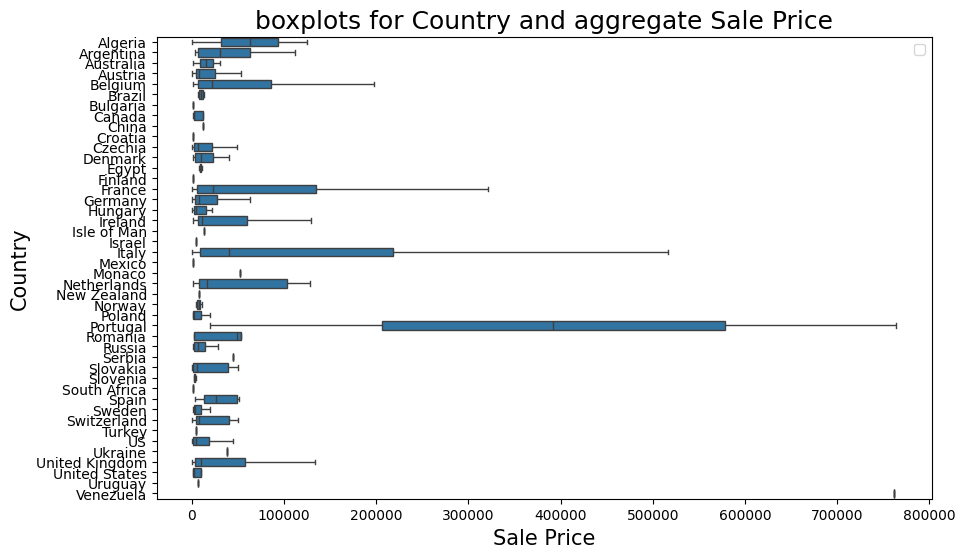

In [177]:
# Look at the aggregate sale prices for all the makers in a give country

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

sns.boxplot(x=by_region['SalePrice'], y=by_region['Country'], showfliers=False)
plt.title('boxplots for Country and aggregate Sale Price', fontsize=18)
plt.ylabel('Country', fontsize=15)
plt.xlabel('Sale Price', fontsize=15)
plt.legend('')

plt.show()

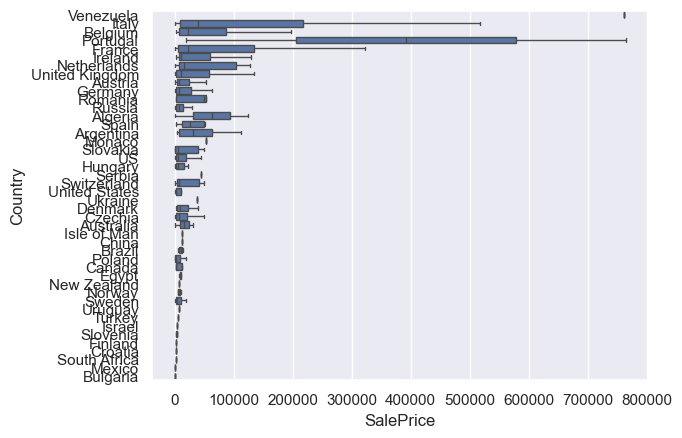

In [179]:
# Look at the mean sale prices for all the makers in a given country. 

# libraries & dataset
import seaborn as sns
import matplotlib.pyplot as plt
  
sns.set_theme(style="darkgrid")
df = by_region
 
# Using pandas methods and slicing to determine the order by decreasing median
my_order = df.groupby(by=['Country'])['SalePrice'].mean().sort_values().iloc[::-1].index
 
# Specifying the 'order' parameter with my_order and plotting
sns.boxplot(x='SalePrice', y='Country', data=df, order=my_order, showfliers=False)
plt.show()

In [181]:
by_region[by_region['Country'] == 'Venezuela']

,Country,Maker,SalePrice
3082,Venezuela,"Peresson, Sergio",761168


In [183]:
means = df.groupby('Country')['SalePrice'].mean().rename('Country_mean')
means.sort_values(ascending=False)

Country
Venezuela         761168.000000
Italy             623497.035176
Belgium           497342.234043
Portugal          392087.000000
France            304265.738739
Ireland           249451.846154
Netherlands       163890.935484
United Kingdom    122122.095000
Austria            78897.081633
Germany            75200.186090
Romania            71815.000000
Russia             69615.250000
Algeria            62708.000000
Spain              59663.052632
Argentina          53348.466667
Monaco             52328.000000
Slovakia           51224.750000
US                 50622.324484
Hungary            45080.313725
Serbia             45079.000000
Switzerland        42002.000000
United States      40940.545455
Ukraine            37813.000000
Denmark            35129.388889
Czechia            23777.253165
Australia          15874.500000
Isle of Man        12702.000000
China              11826.000000
Brazil              9930.000000
Poland              9483.692308
Canada              9252.428571


In [185]:
by_region

,Country,Maker,SalePrice
0,Algeria,"Bauer, Jean",124833
1,Algeria,"Peyrot, Alfred",583
2,Argentina,"Baldoni, Dante",59190
3,Argentina,"Bruni, Mateo",30396
4,Argentina,"Capalbo, Giovanni",6900
...,...,...,...
3078,United States,"Smart, Winfred",2070
3079,United States,"Watson, William D.",440258
3080,United States,"Woodward, C.F.",6436
3081,Uruguay,"Fulquet, Annibal",6703


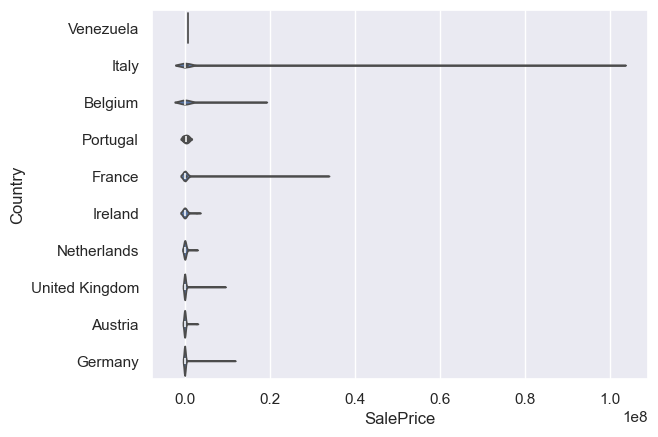

In [188]:
# Look at the top 10 groups from by_region: 10 countries with the top highest sale price means

# libraries & dataset
import seaborn as sns
import matplotlib.pyplot as plt
  
sns.set_theme(style="darkgrid")
df = by_region
 
# Using pandas methods and slicing to determine the order by decreasing median
my_order = df.groupby(by=['Country'])['SalePrice'].mean().sort_values(ascending=False).iloc[::-1]
top_groups = my_order.nlargest(10).index
 
# Specifying the 'order' parameter with my_order and plotting
sns.violinplot(x='SalePrice', y='Country', data=df, order=top_groups)
plt.show()

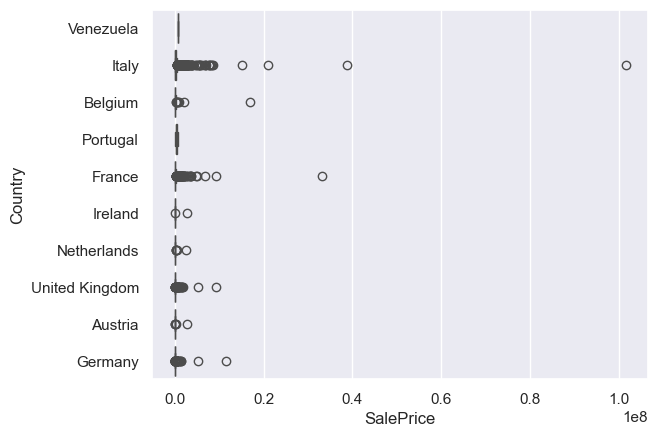

In [190]:
# libraries & dataset
import seaborn as sns
import matplotlib.pyplot as plt
  
sns.set_theme(style="darkgrid")
df = by_region
 
# Using pandas methods and slicing to determine the order by decreasing median
my_order = df.groupby(by=['Country'])['SalePrice'].mean().sort_values(ascending=False).iloc[::-1]
top_groups = my_order.nlargest(10).index
 
# Specifying the 'order' parameter with my_order and plotting
sns.boxplot(x='SalePrice', y='Country', data=df, order=top_groups)
plt.show()

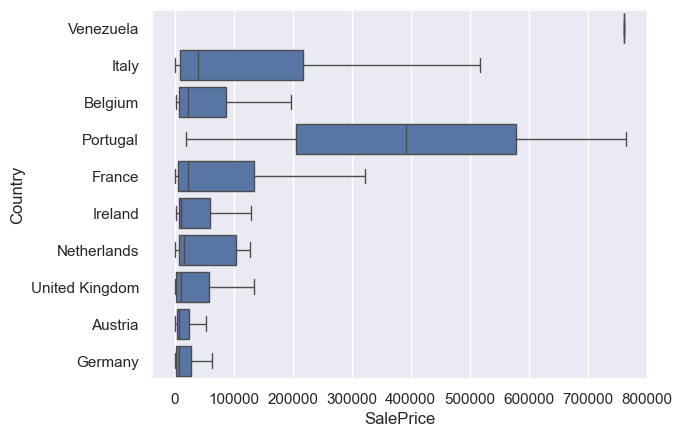

In [192]:
# libraries & dataset
import seaborn as sns
import matplotlib.pyplot as plt
  
sns.set_theme(style="darkgrid")
df = by_region
 
# Using pandas methods and slicing to determine the order by decreasing median
my_order = df.groupby(by=['Country'])['SalePrice'].mean().sort_values(ascending=False).iloc[::-1]
top_groups = my_order.nlargest(10).index
 
# Specifying the 'order' parameter with my_order and plotting
sns.boxplot(x='SalePrice', y='Country', data=df, order=top_groups, showfliers=False)
plt.show()

In [194]:
by_region[by_region['Country'] == 'Venezuela']

,Country,Maker,SalePrice
3082,Venezuela,"Peresson, Sergio",761168


In [196]:
Tarisio[Tarisio['Country'] == 'Venezuela'].sort_values(by=['SalePrice'])

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country
38178,Violin,2006-07-15,4025,Tarisio,"Haddonfield, NJ",531,"Peresson, Sergio",Caracas,Venezuela
38165,Viola,2017-03-27,11332,Tarisio,"Haddonfield, NJ",531,"Peresson, Sergio",Caracas,Venezuela
38171,Viola,2013-10-16,12000,Tarisio,"Haddonfield, NJ",531,"Peresson, Sergio",Caracas,Venezuela
38179,Viola,2005-05-12,13800,Tarisio,"Haddonfield, NJ",531,"Peresson, Sergio",Caracas,Venezuela
38185,Viola,2001-11-09,14000,Tarisio,"Haddonfield, NJ",531,"Peresson, Sergio",Caracas,Venezuela
38186,Violin,2001-10-04,18000,Sotheby's,NaN,531,"Peresson, Sergio",Caracas,Venezuela
38172,Viola,2011-11-11,18000,Tarisio,"Haddonfield, NJ",531,"Peresson, Sergio",Caracas,Venezuela
38187,Violin,1997-11-18,18523,Bonhams,NaN,531,"Peresson, Sergio",Caracas,Venezuela
38176,Viola,2009-10-18,19200,Tarisio,"Haddonfield, NJ",531,"Peresson, Sergio",Caracas,Venezuela
38166,Viola,2017-02-24,20650,Tarisio,"Haddonfield, NJ",531,"Peresson, Sergio",Caracas,Venezuela


# 

In [199]:
# Does this make sense? What is the mean sale price for Strads (Antonio)?
Strads1 = Tarisio[Tarisio['Maker'] == 'Stradivari, Antonio']
Strads1['SalePrice'].mean()

531500.554973822

In [201]:
(Strads1['SalePrice'].sum()) / (Strads1['SalePrice'].count())

531500.554973822

In [203]:
It = Tarisio[Tarisio['Country'] == 'Italy']
(It['SalePrice'].sum()) / (It['SalePrice'].count())

50345.26678839521

In [205]:
It['SalePrice'].count()

9858

<Axes: xlabel='SalePrice', ylabel='Count'>

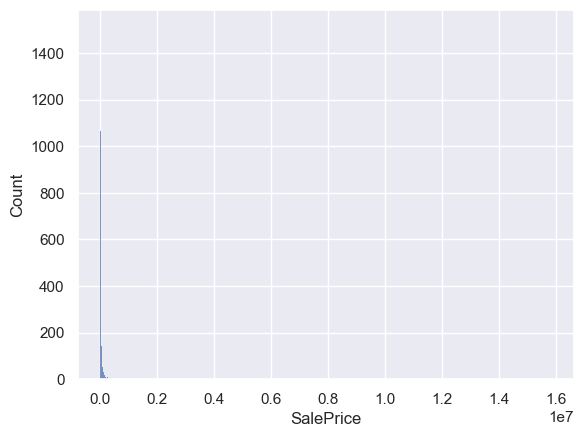

In [207]:
# Visualize Italian violin prices
import seaborn as sns

sns.histplot(data=It, x='SalePrice')

In [208]:
Peresson = Tarisio[Tarisio['Maker'] == 'Peresson, Sergio']
Peresson['SalePrice'].mean()

25372.266666666666

In [211]:
Peresson['SalePrice'].count()

30

In [213]:
(Peresson['SalePrice'].sum()) / (Peresson['SalePrice'].count())

25372.266666666666

### vln_top_regions

violins from Tarisio

these are the top 11 countries with the highest aggregate sales of violins (see above)

In [217]:
Italy_df   = violins[violins['Country'] == 'Italy']
France_df  = violins[violins['Country'] == 'France']
UK_df      = violins[violins['Country'] == 'United Kingdom']
Germany_df = violins[violins['Country'] == 'Germany']
US_df      = violins[violins['Country'] == 'US']
Belgium_df = violins[violins['Country'] == 'Belgium']
Nlands_df  = violins[violins['Country'] == 'Netherlands']
Austria_df = violins[violins['Country'] == 'Austria']
Ireland_df = violins[violins['Country'] == 'Ireland']
Hungary_df = violins[violins['Country'] == 'Hungary']
Czechia_df = violins[violins['Country'] == 'Czechia']

import pandas as pd
vln_top_regions = pd.concat(
    [Italy_df, France_df, UK_df, Germany_df, US_df, 
     Belgium_df, Nlands_df, Austria_df, Ireland_df, 
     Hungary_df, Czechia_df ]
)
vln_top_regions

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
33,Violin,2019-11-08,4130,Tarisio,Milan,"Agostinelli, Luigi",Gubbio,Italy,2019
34,Violin,2018-06-25,3603,Tarisio,Milan,"Agostinelli, Luigi",Gubbio,Italy,2018
35,Violin,2017-10-23,5934,Tarisio,Turin,"Agostinelli, Luigi",Gubbio,Italy,2017
36,Violin,2013-10-16,4800,Tarisio,Milan,"Agostinelli, Luigi",Gubbio,Italy,2013
37,Violin,2005-10-16,4700,Skinner,Milan,"Agostinelli, Luigi",Gubbio,Italy,2005
...,...,...,...,...,...,...,...,...,...
24450,Violin,2019-10-21,4054,Brompton's,Znojmo,"Wassermann, Joseph",Znojmo,Czechia,2019
24451,Violin,2008-03-31,3706,Dorotheum,NaN,"Wassermann, Joseph",Znojmo,Czechia,2008
24452,Violin,1990-03-27,5366,Sotheby's,NaN,"Wassermann, Joseph",Znojmo,Czechia,1990
24758,Violin,1995-05-11,143,Phillip's,Rochdale,"Wild, Franz Anton",Brno,Czechia,1995


<Figure size 1000x600 with 0 Axes>

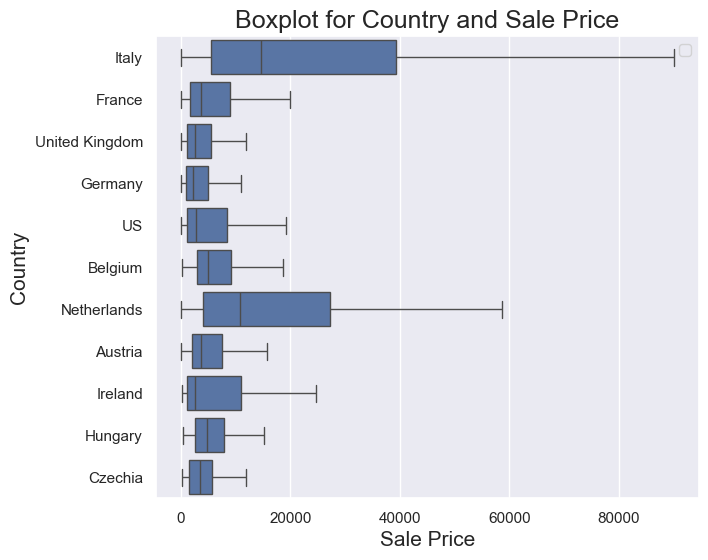

In [219]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

# Initialize the figure with a logarithmic x axis
fig, ax = plt.subplots(figsize=(7, 6))
# ax.set_xscale('log')

sns.boxplot(x=vln_top_regions['SalePrice'], y=vln_top_regions['Country'], showfliers=False)
plt.title('Boxplot for Country and Sale Price', fontsize=18)
plt.ylabel('Country', fontsize=15)
plt.xlabel('Sale Price', fontsize=15)
plt.legend('')

plt.show()

<Figure size 1000x600 with 0 Axes>

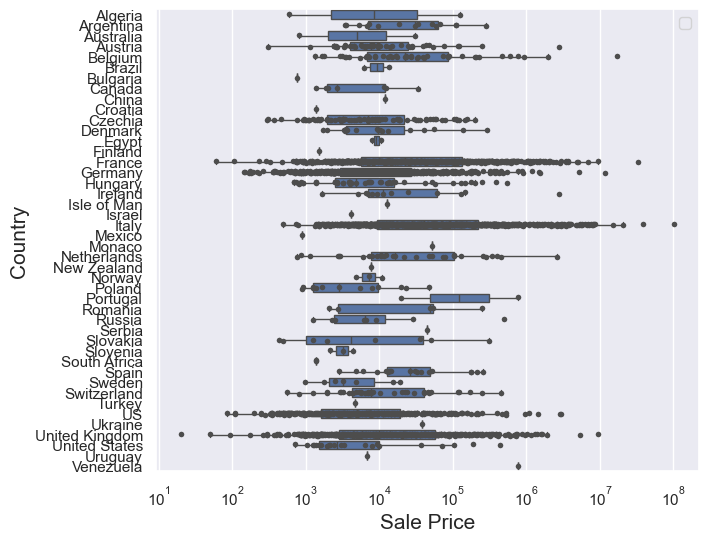

In [221]:
# This was more useful when looking at only 4 countries
# This is looking at all the regions

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(figsize=(7, 6))
ax.set_xscale('log')

sns.boxplot(x=by_region['SalePrice'], y=by_region['Country'], showfliers=False)

# Add in points to show each observation
sns.stripplot(by_region, x=by_region['SalePrice'], y=by_region['Country'], size=4, color=".3")

plt.title('', fontsize=18)
plt.ylabel('Country', fontsize=15)
plt.xlabel('Sale Price', fontsize=15)
plt.legend('')

plt.show()

### Looking at the top 4 regions, in by_region

In [223]:
by_region1 = Tarisio.groupby(['Country'])['SalePrice'].sum()
by_region1 = pd.DataFrame(by_region1).reset_index()
by_region1.sort_values(by=['SalePrice'], ascending=False)

,Country,SalePrice
20,Italy,496303640
14,France,168867485
40,United Kingdom,48848838
15,Germany,40006499
4,Belgium,23375085
38,US,17160968
23,Netherlands,5080619
3,Austria,3865957
17,Ireland,3242874
16,Hungary,2299096


In [225]:
Tarisio[Tarisio['Country'] == 'Italy'].count()

Instrument      9858
SaleDate        9858
SalePrice       9858
AuctionHouse    9194
AuctionCity     7224
MakerID         9858
Maker           9858
City            9858
Country         9858
dtype: int64

In [226]:
Tarisio.groupby('Country').count()

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City
Country,,,,,,,,
Algeria,21,21,21,16,14,21,21,21
Argentina,90,90,90,80,82,90,90,90
Australia,6,6,6,6,6,6,6,6
Austria,280,280,280,269,210,280,280,280
Belgium,2061,2061,2061,1875,1523,2061,2061,2061
Brazil,5,5,5,5,3,5,5,5
Bulgaria,1,1,1,1,1,1,1,1
Canada,36,36,36,31,29,36,36,36
China,2,2,2,1,2,2,2,2


In [227]:
Italy_df   = Tarisio[Tarisio['Country'] == 'Italy']
France_df  = Tarisio[Tarisio['Country'] == 'France']
UK_df      = Tarisio[Tarisio['Country'] == 'United Kingdom']
Germany_df = Tarisio[Tarisio['Country'] == 'Germany']

import pandas as pd
top4_regions = pd.concat([Italy_df, France_df, UK_df, Germany_df])
top4_regions

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country
152,Violin,2019-11-08,4130,Tarisio,Milan,2665,"Agostinelli, Luigi",Gubbio,Italy
153,Violin,2018-06-25,3603,Tarisio,Milan,2665,"Agostinelli, Luigi",Gubbio,Italy
154,Violin,2017-10-23,5934,Tarisio,Turin,2665,"Agostinelli, Luigi",Gubbio,Italy
155,Violin,2013-10-16,4800,Tarisio,Milan,2665,"Agostinelli, Luigi",Gubbio,Italy
156,Viola,2012-11-27,8180,Tarisio,Milan,2665,"Agostinelli, Luigi",Gubbio,Italy
...,...,...,...,...,...,...,...,...,...
55234,Violin,1985-03-14,250,Phillip's,Markneukirchen,1394,"Zimmermann, Julius Heinrich",Markneukirchen,Germany
55266,Violin,2002-10-24,2138,Tarisio,NaN,15204,"Zwerger, Anton II",Passau,Germany
55267,Violin,1997-11-18,2633,Bonhams,Passau,15204,"Zwerger, Anton II",Passau,Germany
55268,Viola,1991-09-19,1520,Phillip's,Passau,15204,"Zwerger, Anton II",Passau,Germany


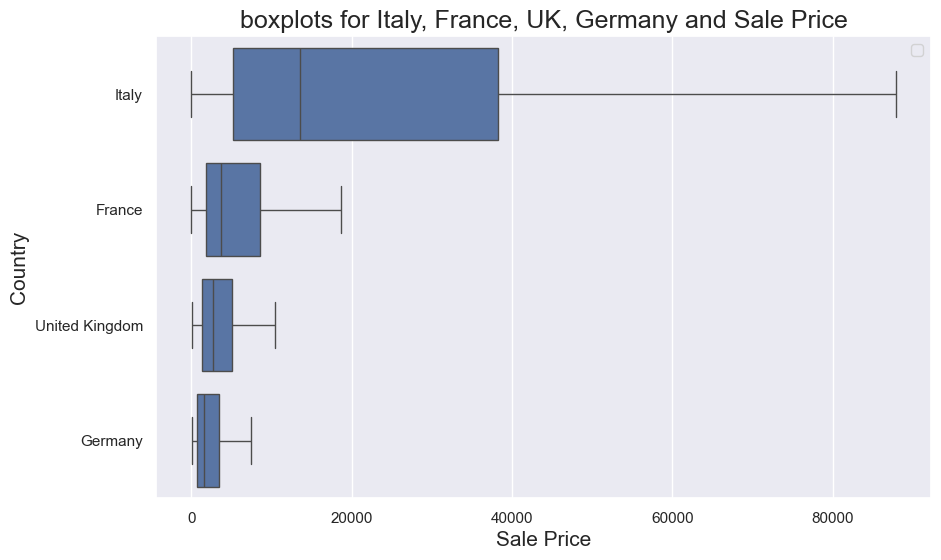

In [230]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

sns.boxplot(x=top4_regions['SalePrice'], y=top4_regions['Country'], showfliers=False)
plt.title('boxplots for Italy, France, UK, Germany and Sale Price', fontsize=18)
plt.ylabel('Country', fontsize=15)
plt.xlabel('Sale Price', fontsize=15)
plt.legend('')

plt.show()

<Figure size 1000x600 with 0 Axes>

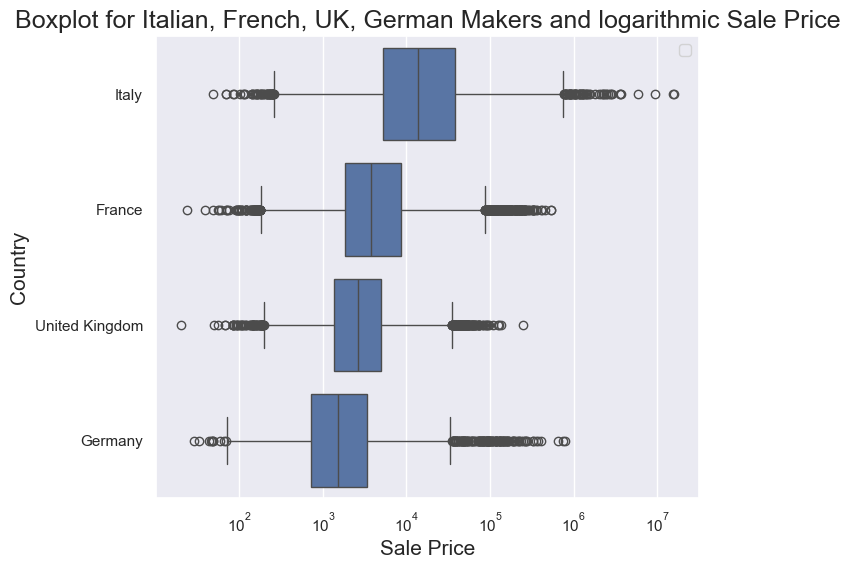

In [233]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

# Initialize the figure with a logarithmic x axis
fig, ax = plt.subplots(figsize=(7, 6))
ax.set_xscale('log')

sns.boxplot(x=top4_regions['SalePrice'], y=top4_regions['Country'])
plt.title('Boxplot for Italian, French, UK, German Makers and logarithmic Sale Price', fontsize=18)
plt.ylabel('Country', fontsize=15)
plt.xlabel('Sale Price', fontsize=15)
plt.legend('')

plt.show()

<Figure size 1000x600 with 0 Axes>

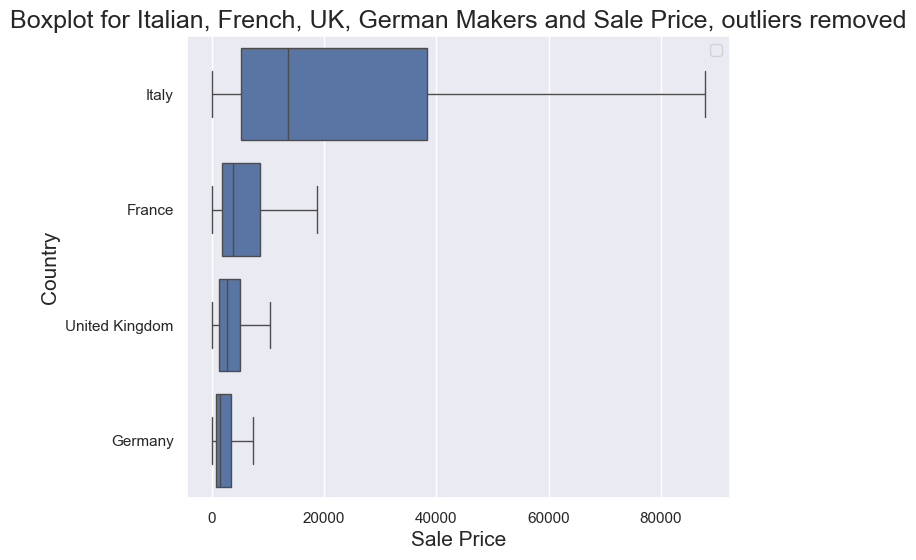

In [234]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

# Initialize the figure with a logarithmic x axis
fig, ax = plt.subplots(figsize=(7, 6))
# 

sns.boxplot(x=top4_regions['SalePrice'], y=top4_regions['Country'], showfliers = False)
plt.title('Boxplot for Italian, French, UK, German Makers and Sale Price, outliers removed', fontsize=18)
plt.ylabel('Country', fontsize=15)
plt.xlabel('Sale Price', fontsize=15)
plt.legend('')

plt.show()

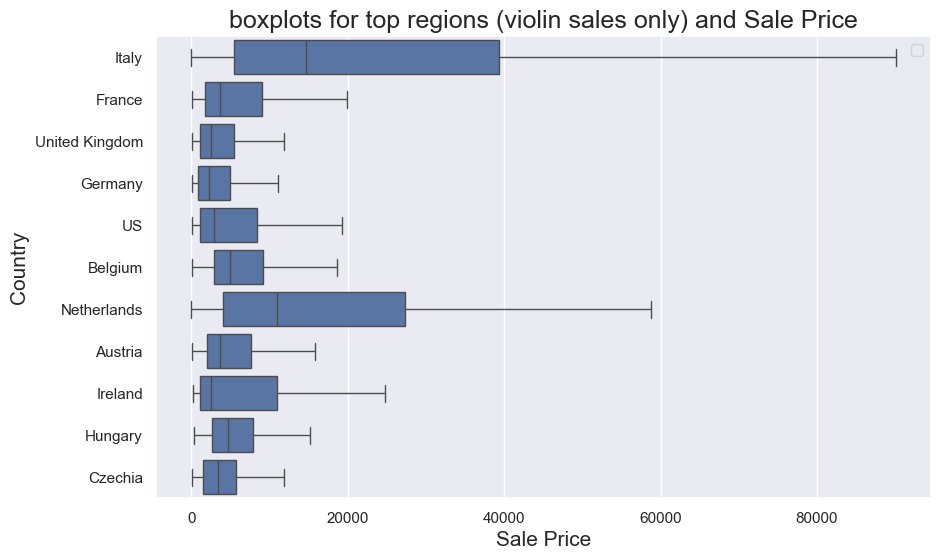

In [235]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

sns.boxplot(x=vln_top_regions['SalePrice'], y=vln_top_regions['Country'], showfliers=False)
plt.title('boxplots for top regions (violin sales only) and Sale Price', fontsize=18)
plt.ylabel('Country', fontsize=15)
plt.xlabel('Sale Price', fontsize=15)
plt.legend('')

plt.show()

<Figure size 1000x600 with 0 Axes>

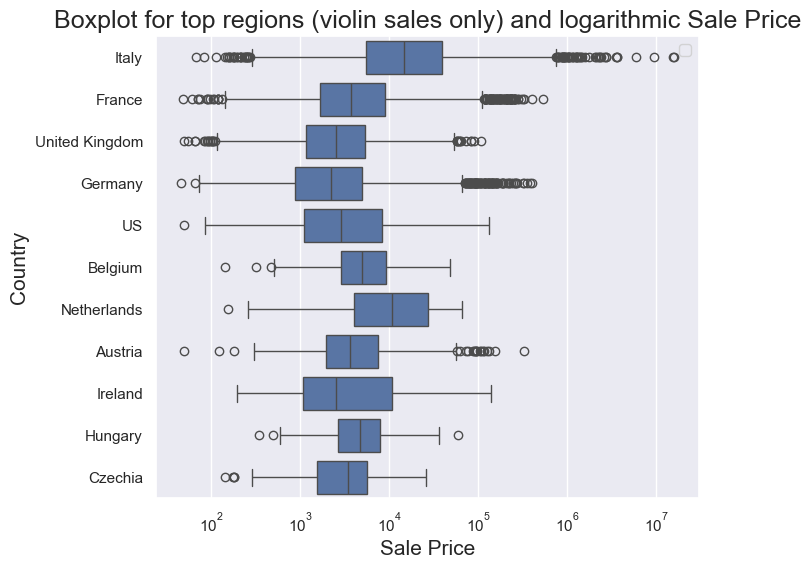

In [236]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

# Initialize the figure with a logarithmic x axis
fig, ax = plt.subplots(figsize=(7, 6))
ax.set_xscale('log')

sns.boxplot(x=vln_top_regions['SalePrice'], y=vln_top_regions['Country'])
plt.title('Boxplot for top regions (violin sales only) and logarithmic Sale Price', fontsize=18)
plt.ylabel('Country', fontsize=15)
plt.xlabel('Sale Price', fontsize=15)
plt.legend('')

plt.show()

<Figure size 1000x600 with 0 Axes>

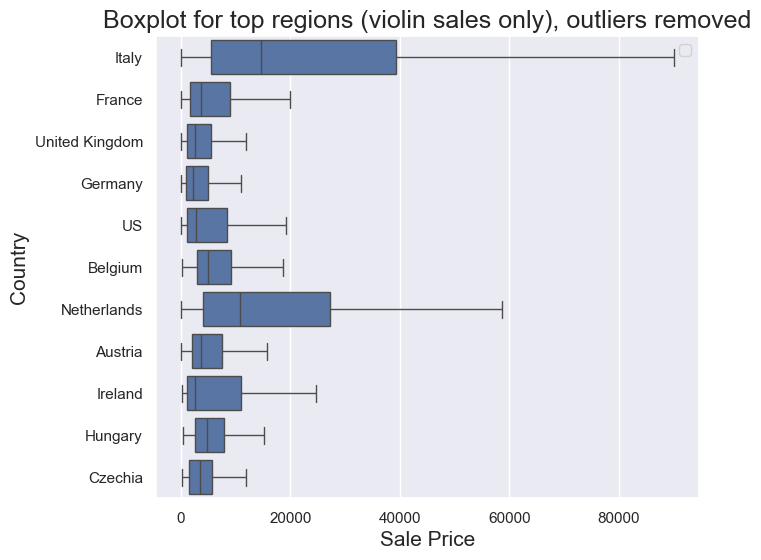

In [238]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

# Initialize the figure with a logarithmic x axis
fig, ax = plt.subplots(figsize=(7, 6))

sns.boxplot(x=vln_top_regions['SalePrice'], y=vln_top_regions['Country'], showfliers=False)
plt.title('Boxplot for top regions (violin sales only), outliers removed', fontsize=18)
plt.ylabel('Country', fontsize=15)
plt.xlabel('Sale Price', fontsize=15)
plt.legend('')

plt.show()

# More Maker Trends

[Return to Table of Contents](#Contents)

Looking at violin sales by individual makers and fitting trends with linear, quadratic, and cubic regression lines.

In [248]:
# Find a single violin maker
Strads_Antonio = violins[(violins['Maker'].str.contains('Strad')) & (violins['Maker'].str.contains('Antonio'))]
Strads_Antonio

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
21948,Violin,2023-06-09,5900000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy,2023
21949,Violin,2023-03-28,2215565,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy,2023
21950,Violin,2023-03-28,1452426,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy,2023
21951,Violin,2022-06-10,15340000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy,2022
21952,Violin,2017-03-28,2410310,Ingles & Hayday,Cremona,"Stradivari, Antonio",Cremona,Italy,2017
...,...,...,...,...,...,...,...,...,...
22109,Violin,1862-06-26,853,Puttick & Simpson,NaN,"Stradivari, Antonio",Cremona,Italy,1862
22110,Violin,1857-02-18,973,Christie & Manson,NaN,"Stradivari, Antonio",Cremona,Italy,1857
22111,Violin,1853-05-28,606,Puttick & Simpson,NaN,"Stradivari, Antonio",Cremona,Italy,1853
22112,Violin,1850-11-28,588,Puttick & Simpson,NaN,"Stradivari, Antonio",Cremona,Italy,1850


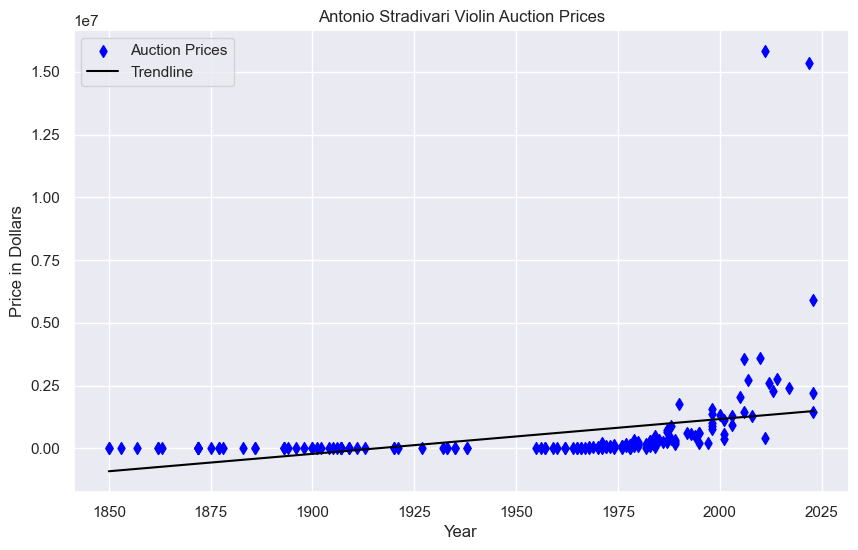

In [249]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(Strads_Antonio['Year'], Strads_Antonio['SalePrice'], color='blue', label='Auction Prices', marker='d')

# Fit a trendline
slope, intercept, _, _, _ = linregress(Strads_Antonio['Year'], Strads_Antonio['SalePrice'])
plt.plot(Strads_Antonio['Year'], slope * Strads_Antonio['Year'] + intercept, color='black', label='Trendline')

# Adding labels and title
plt.title('Antonio Stradivari Violin Auction Prices')
plt.xlabel('Year')
plt.ylabel('Price in Dollars')
plt.legend()
plt.show()

### Linear regression fit:

R^2 Score: 0.11844653865530319
Coefficients: [    0.         13862.39098137]
Intercept: -26557275.727682862
5-Fold Cross-Validation R^2 Scores for 2nd degree Polynomial Regression: [-3.63103469e-01 -7.54435916e+00 -1.89748773e+02 -3.10855176e+03
 -4.28339825e+06]
Average R^2 Score: -857340.8911936956


/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


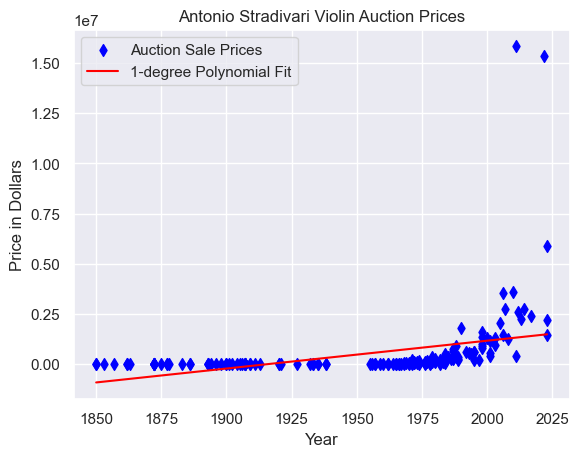

In [252]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score

# Assuming X and y are your data points:
# Replace X and y with the actual Year and Price data from your dataset.
X = Strads_Antonio[['Year']]
y = Strads_Antonio['SalePrice']
    # X = np.array([your_year_data]).reshape(-1, 1)
    # y = np.array([your_price_data])

# Define the degree of the polynomial (e.g., 2 for quadratic, 3 for cubic)
degree = 1
poly = PolynomialFeatures(degree=degree)
X_poly = poly.fit_transform(X)

# Fit the polynomial regression model
model = LinearRegression()
model.fit(X_poly, y)

# Calculate R^2, coefficients and intercept
r_squared = model.score(X_poly, y)
coefficients = model.coef_
intercept = model.intercept_

# Print results
print("R^2 Score:", r_squared)
print("Coefficients:", coefficients)
print("Intercept:", intercept)

# Perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_poly, y, cv=5, scoring='r2')

# Output the results
print("5-Fold Cross-Validation R^2 Scores for 2nd degree Polynomial Regression:", cv_scores)
print("Average R^2 Score:", cv_scores.mean())

# Generate predictions for plotting
X_range = np.linspace(X.min(), X.max(), 500).reshape(-1, 1)
X_range_poly = poly.transform(X_range)
y_poly_pred = model.predict(X_range_poly)

# Plot the original data and the polynomial regression line
plt.scatter(X, y, color='blue', label='Auction Sale Prices', marker='d')
plt.plot(X_range, y_poly_pred, color='red', label=f'{degree}-degree Polynomial Fit')
plt.xlabel('Year')
plt.ylabel('Price in Dollars')
plt.title('Antonio Stradivari Violin Auction Prices')
plt.legend()
plt.show()

### Quadratic fit

R^2 Score: 0.29951311868972885
Coefficients: [ 0.00000000e+00 -1.64475346e+06  4.27748898e+02]
Intercept: 1580253551.9867961
5-Fold Cross-Validation R^2 Scores for 2nd degree Polynomial Regression: [-2.74399264e-01 -4.77350778e+00 -2.87440964e+01 -1.72563100e+04
 -1.48636782e+07]
Average R^2 Score: -2976193.668102987


/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


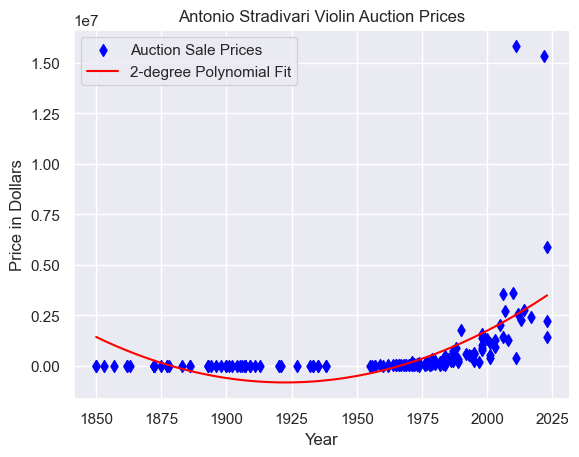

In [254]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score

# Assuming X and y are your data points:
# Replace X and y with the actual Year and Price data from your dataset.
X = Strads_Antonio[['Year']]
y = Strads_Antonio['SalePrice']
    # X = np.array([your_year_data]).reshape(-1, 1)
    # y = np.array([your_price_data])

# Define the degree of the polynomial (e.g., 2 for quadratic, 3 for cubic)
degree = 2
poly = PolynomialFeatures(degree=degree)
X_poly = poly.fit_transform(X)

# Fit the polynomial regression model
model = LinearRegression()
model.fit(X_poly, y)

# Calculate R^2, coefficients and intercept
r_squared = model.score(X_poly, y)
coefficients = model.coef_
intercept = model.intercept_

# Print results
print("R^2 Score:", r_squared)
print("Coefficients:", coefficients)
print("Intercept:", intercept)

# Perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_poly, y, cv=5, scoring='r2')

# Output the results
print("5-Fold Cross-Validation R^2 Scores for 2nd degree Polynomial Regression:", cv_scores)
print("Average R^2 Score:", cv_scores.mean())

# Generate predictions for plotting
X_range = np.linspace(X.min(), X.max(), 500).reshape(-1, 1)
X_range_poly = poly.transform(X_range)
y_poly_pred = model.predict(X_range_poly)

# Plot the original data and the polynomial regression line
plt.scatter(X, y, color='blue', label='Auction Sale Prices', marker='d')
plt.plot(X_range, y_poly_pred, color='red', label=f'{degree}-degree Polynomial Fit')
plt.xlabel('Year')
plt.ylabel('Price in Dollars')
plt.title('Antonio Stradivari Violin Auction Prices')
plt.legend()
plt.show()

In [439]:
violins[violins['Maker'] == 'Achner, Michael']

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
0,Violin,2010-02-20,4200,Tarisio,Wallgau,"Achner, Michael",Mittenwald,Germany,2010
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,"Achner, Michael",Mittenwald,Germany,1987


In [441]:
Tarisio[Tarisio['Maker'] == 'Achner, Michael']

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country,Year
0,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Mittenwald,Germany,2010
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Mittenwald,Germany,1987


In [453]:
Amati_Nicolo['Year'].count()

21

In [455]:
Amati_Nicolo['SalePrice'].count()

21

R^2 Score: 0.5508651350740095
Coefficients: [ 0.00000000e+00  7.29463394e+03 -1.63682769e+00]
Intercept: -8014639.19422729
5-Fold Cross-Validation R^2 Scores for 2nd degree Polynomial Regression: [-3.81749974e-01 -8.79864720e-02  2.20460494e-02 -1.84541572e+00
 -6.71072341e+01]
Average R^2 Score: -13.880068052580276


/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names



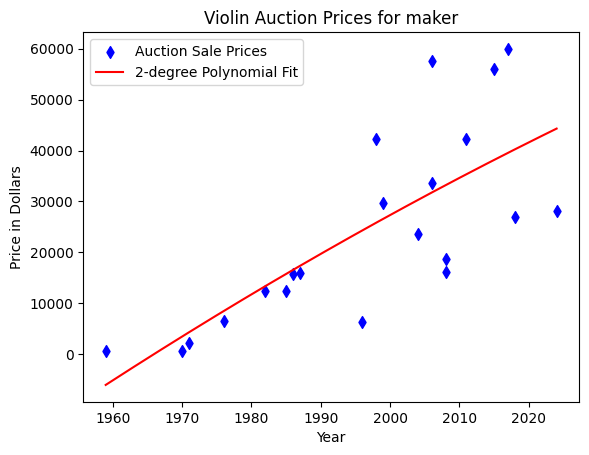

In [483]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score

# data
# df = violins[(violins['Maker'].str.contains('Achner')) & (violins['Maker'].str.contains('Michael'))]
df = violins[(violins['Maker'].str.contains('Amati')) & (violins['Maker'].str.contains('Nicolo'))]
# df = violins[(violins['Maker'].str.contains('Strad')) & (violins['Maker'].str.contains('Antonio'))]
num = df['Year'].count()

if num > 5:
    # Assuming X and y are your data points:
    # Replace X and y with the actual Year and Price data from your dataset.
    X = df[['Year']]
    y = df['SalePrice']
        # X = np.array([your_year_data]).reshape(-1, 1)
        # y = np.array([your_price_data])

    # Define the degree of the polynomial (e.g., 2 for quadratic, 3 for cubic)
    degree = 2
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)

    # Fit the polynomial regression model
    model = LinearRegression()
    model.fit(X_poly, y)
    
    # Calculate R^2, coefficients and intercept
    r_squared = model.score(X_poly, y)
    coefficients = model.coef_
    intercept = model.intercept_

    # Print results
    print("R^2 Score:", r_squared)
    print("Coefficients:", coefficients)
    print("Intercept:", intercept)
    
    # Perform 5-fold cross-validation
    cv_scores = cross_val_score(model, X_poly, y, cv=5, scoring='r2')
    
    # Output the results
    print("5-Fold Cross-Validation R^2 Scores for 2nd degree Polynomial Regression:", cv_scores)
    print("Average R^2 Score:", cv_scores.mean())

    # Generate predictions for plotting
    X_range = np.linspace(X.min(), X.max(), 500).reshape(-1, 1)
    X_range_poly = poly.transform(X_range)
    y_poly_pred = model.predict(X_range_poly)

    # Plot the original data and the polynomial regression line
    plt.scatter(X, y, color='blue', label='Auction Sale Prices', marker='d')
    plt.plot(X_range, y_poly_pred, color='red', label=f'{degree}-degree Polynomial Fit')
    plt.xlabel('Year')
    plt.ylabel('Price in Dollars')
    plt.title(f'Violin Auction Prices for maker')
    plt.legend()
    plt.show()


else:
    X = df['Year']
    y = df['SalePrice']
    
    plt.scatter(df['Year'], df['SalePrice'], color='blue', label='Auction Sale Prices', marker='d')
    plt.xlabel('Year')
    plt.ylabel('Price in Dollars')
    plt.title(f'Violin Auction Prices for maker')
    plt.legend()
    plt.show()

### Visualize with Plotly

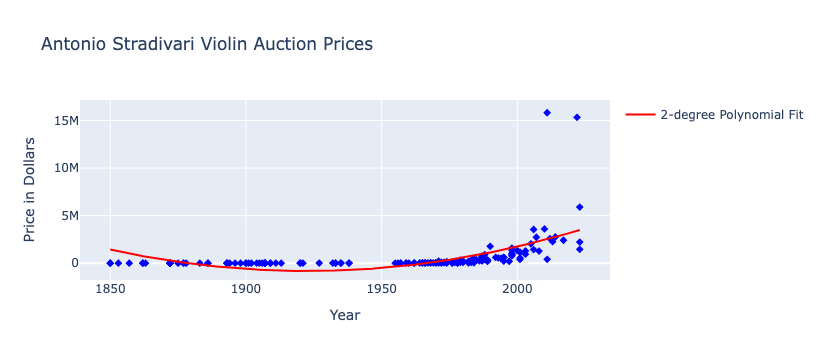

In [497]:
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score

# data to plot
Strads_Antonio = violins[(violins['Maker'].str.contains('Strad')) & (violins['Maker'].str.contains('Antonio'))]

# Assuming X and y are your data points:
X = Strads_Antonio[['Year']]
y = Strads_Antonio['SalePrice']

# Define the degree of the polynomial
degree = 2
# poly = PolynomialFeatures(degree=degree)
# X_poly = poly.fit_transform(X)
poly = PolynomialFeatures(degree=degree)
X_poly = poly.fit_transform(X.values)  # Converts DataFrame to array

# Fit the polynomial regression model
model = LinearRegression()
model.fit(X_poly, y)

# Generate predictions for plotting
# X_range = np.linspace(X.min(), X.max(), 500).reshape(-1, 1)
# X_range_poly = poly.transform(X_range)
# Later calls to poly.transform() should also use arrays, like so:
X_range = np.linspace(X['Year'].min(), X['Year'].max(), 500).reshape(-1, 1)
X_range_poly = poly.transform(X_range)  # This will work since both are arrays
y_poly_pred = model.predict(X_range_poly)

# Create Plotly scatter plot for actual data points
fig = px.scatter(x=X.squeeze(), y=y, labels={'x': 'Year', 'y': 'Price in Dollars'},
                 title='Antonio Stradivari Violin Auction Prices')
fig.update_traces(marker=dict(color='blue', symbol='diamond'), name='Auction Sale Prices')

# Add the polynomial regression line
fig.add_trace(go.Scatter(x=X_range.squeeze(), y=y_poly_pred, mode='lines',
                         name=f'{degree}-degree Polynomial Fit', line=dict(color='red')))

# Display the plot
fig.show()

/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names

/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names

/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names

/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names

/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names

/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted 

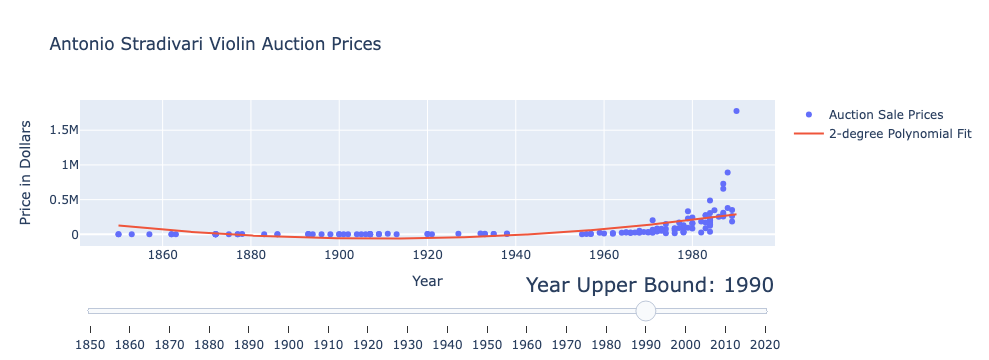

In [330]:
import numpy as np
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Assuming X and y are your data points:
X = Strads_Antonio[['Year']]
y = Strads_Antonio['SalePrice']

# Define polynomial degree
degree = 2
poly = PolynomialFeatures(degree=degree)

# Define a range of x-axis intervals (e.g., sliding by 10-year increments)
years = np.arange(X['Year'].min(), X['Year'].max(), 10).astype(int)
frames = []

for year in years:
    # Filter data for the current range
    X_filtered = X[X['Year'] <= year]
    y_filtered = y.loc[X_filtered.index]

    # Fit model on this subset
    X_poly_filtered = poly.fit_transform(X_filtered)
    model = LinearRegression()
    model.fit(X_poly_filtered, y_filtered)

    # Generate predictions for this frame
    X_range = np.linspace(X_filtered.min(), X_filtered.max(), 500).reshape(-1, 1)
    X_range_poly = poly.transform(X_range)
    y_poly_pred = model.predict(X_range_poly)

    # Create frame with this specific x-range and polynomial fit
    frames.append(go.Frame(
        data=[
            go.Scatter(x=X_filtered.squeeze(), y=y_filtered, mode='markers', name='Auction Sale Prices'),
            go.Scatter(x=X_range.squeeze(), y=y_poly_pred, mode='lines', name=f'{degree}-degree Polynomial Fit')
        ],
        name=str(year)
    ))

# Create initial scatter plot
fig = go.Figure(
    data=[
        go.Scatter(x=X.squeeze(), y=y, mode='markers', name='Auction Sale Prices'),
        go.Scatter(x=X_range.squeeze(), y=y_poly_pred, mode='lines', name=f'{degree}-degree Polynomial Fit')
    ],
    layout=go.Layout(
        title="Antonio Stradivari Violin Auction Prices",
        xaxis=dict(title='Year'),
        yaxis=dict(title='Price in Dollars'),
        sliders=[{
            "steps": [
                {
                    "method": "animate",
                    "label": str(year),
                    "args": [
                        [str(year)],
                        {"mode": "immediate", "frame": {"duration": 500, "redraw": True}, "fromcurrent": True}
                    ]
                } for year in years
            ],
            "active": 0,
            "yanchor": "top",
            "xanchor": "left",
            "currentvalue": {
                "font": {"size": 20},
                "prefix": "Year Upper Bound: ",
                "visible": True,
                "xanchor": "right"
            }
        }]
    ),
    frames=frames
)

fig.show()

### Cubic regression fit:

R^2 Score: 0.40813662552435104
Coefficients: [ 0.00000000e+00  7.00318012e+07 -3.65254727e+04  6.34821617e+00]
Intercept: -44745659297.46479
5-Fold Cross-Validation R^2 Scores for Cubic Regression: [-8.33362435e-02 -2.55659412e-01 -1.62224911e+01 -4.47995576e+03
 -3.04129066e+07]
Average R^2 Score: -6083480.613488029


/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


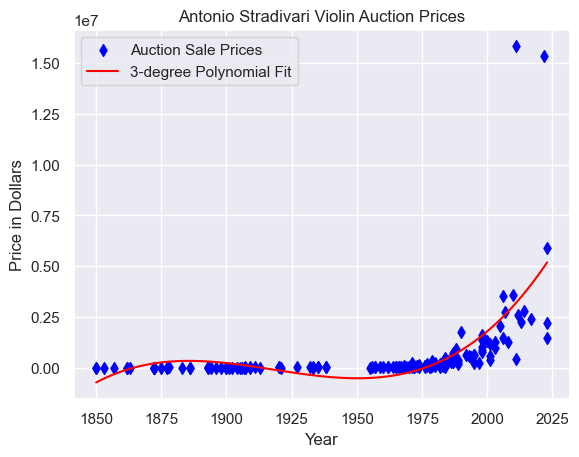

In [256]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score

# Assuming X and y are your data points:
# Replace X and y with the actual Year and Price data from your dataset.
X = Strads_Antonio[['Year']]
y = Strads_Antonio['SalePrice']
    # X = np.array([your_year_data]).reshape(-1, 1)
    # y = np.array([your_price_data])

# Define the degree of the polynomial (e.g., 2 for quadratic, 3 for cubic)
degree = 3
poly = PolynomialFeatures(degree=degree)
X_poly = poly.fit_transform(X)

# Fit the polynomial regression model
model = LinearRegression()
model.fit(X_poly, y)

# Calculate R^2, coefficients and intercept
r_squared = model.score(X_poly, y)
coefficients = model.coef_
intercept = model.intercept_

# Print results
print("R^2 Score:", r_squared)
print("Coefficients:", coefficients)
print("Intercept:", intercept)

# Perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_poly, y, cv=5, scoring='r2')

# Output the results
print("5-Fold Cross-Validation R^2 Scores for Cubic Regression:", cv_scores)
print("Average R^2 Score:", cv_scores.mean())

# Generate predictions for plotting
X_range = np.linspace(X.min(), X.max(), 500).reshape(-1, 1)
X_range_poly = poly.transform(X_range)
y_poly_pred = model.predict(X_range_poly)

# Plot the original data and the polynomial regression line
plt.scatter(X, y, color='blue', label='Auction Sale Prices', marker='d')
plt.plot(X_range, y_poly_pred, color='red', label=f'{degree}-degree Polynomial Fit')
plt.xlabel('Year')
plt.ylabel('Price in Dollars')
plt.title('Antonio Stradivari Violin Auction Prices')
plt.legend()
plt.show()

### Find top 6 makers (by aggregate sales) and plot each of their trend lines

In [258]:
m_df = violins.groupby(['Maker'])[['SalePrice']].sum()
m_df

,SalePrice
Maker,
"Achner, Michael",7038
"Achner, Philip",30030
"Acoulon, Alexandre Alfred",19823
"Acton, William John",2053
"Adams, Henry T.",4976
...,...
"van Soelen, Jacobus",1380
"van Vessem, J.",4938
"van de Geest, Jacob",7486


In [260]:
m_df.sort_values(by=['SalePrice'], ascending=False)

,SalePrice
Maker,
"Stradivari, Antonio",93927508
"Guadagnini, Giovanni Battista",30313631
"Vuillaume, Jean-Baptiste",25217048
"Guarneri, Bartolomeo Giuseppe 'del Gesù'",20893372
"Pressenda, Giovanni Francesco",13973764
...,...
"Roberts, A. J.",92
"Awalt, George Woodrow",85
"Howe, Arthur W.",62


In [262]:
m_df = m_df.sort_values(by=['SalePrice'], ascending=False)
m_df.nlargest(10, 'SalePrice')

,SalePrice
Maker,
"Stradivari, Antonio",93927508
"Guadagnini, Giovanni Battista",30313631
"Vuillaume, Jean-Baptiste",25217048
"Guarneri, Bartolomeo Giuseppe 'del Gesù'",20893372
"Pressenda, Giovanni Francesco",13973764
"Gagliano, Nicolò",10699066
"Amati, Nicolò",8272810
"Guarneri, Giuseppe 'filius Andreae'",7680943
"Fagnola, Annibale",6497514


### Look at makers whose aggregate sales exceed $10 million
There are 6 makers. Amati is not in there! Crazy! (not so crazy - see note) 

In [264]:
Strads_Antonio   = violins[(violins['Maker'].str.contains('Stradivari, Antonio'))]
Guad_Battista    = violins[(violins['Maker'].str.contains('Guadagnini, Giovanni Battista'))]
Vuillaume        = violins[(violins['Maker'].str.contains('Vuillaume, Jean-Baptiste'))]
Guarneri_delGesu = violins[(violins['Maker'].str.contains("Guarneri, Bartolomeo Giuseppe 'del Gesù'"))]
Pressenda        = violins[(violins['Maker'].str.contains('Pressenda, Giovanni Francesco'))]
Gagliano_Nicolo  = violins[(violins['Maker'].str.contains('Gagliano, Nicolò'))]
Guarneri_delGesu

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
11402,Violin,2023-03-17,9440000,NaN,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,2023
11403,Violin,2022-06-03,3637892,NaN,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,2022
11404,Violin,2012-06-25,2333175,Tarisio,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,2012
11405,Violin,2007-10-12,937000,Christie's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,2007
11406,Violin,2000-11-14,445632,Sotheby's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,2000
11407,Violin,1997-11-18,935068,Sotheby's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,1997
11408,Violin,1989-06-15,384434,Sotheby's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,1989
11409,Violin,1988-11-23,1050764,Sotheby's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,1988
11410,Violin,1988-11-23,444554,Christie's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,1988
11411,Violin,1986-03-19,317245,Sotheby's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,1986


In [266]:
makers_above10 = pd.concat([Strads_Antonio, Guad_Battista, Vuillaume, Guarneri_delGesu, Pressenda, Gagliano_Nicolo])
makers_above10

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
21948,Violin,2023-06-09,5900000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy,2023
21949,Violin,2023-03-28,2215565,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy,2023
21950,Violin,2023-03-28,1452426,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy,2023
21951,Violin,2022-06-10,15340000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy,2022
21952,Violin,2017-03-28,2410310,Ingles & Hayday,Cremona,"Stradivari, Antonio",Cremona,Italy,2017
...,...,...,...,...,...,...,...,...,...
9835,Violin,1969-11-27,4800,Sotheby's,NaN,"Gagliano, Nicolò",Aachen,Germany,1969
9836,Violin,1969-04-24,6240,Sotheby's,NaN,"Gagliano, Nicolò",Aachen,Germany,1969
9837,Violin,1968-07-19,2104,Sotheby's,NaN,"Gagliano, Nicolò",Aachen,Germany,1968
9838,Violin,1968-04-18,2883,Sotheby's,NaN,"Gagliano, Nicolò",Aachen,Germany,1968


In [268]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Define the list of makers
makers_above10 = pd.concat([Strads_Antonio, Guad_Battista, Vuillaume, Guarneri_delGesu, Pressenda, Gagliano_Nicolo])
makers = [
    'Stradivari, Antonio', 'Guadagnini, Giovanni Battista', 'Vuillaume, Jean-Baptiste', 
    "Guarneri, Bartolomeo Giuseppe 'del Gesù'", 'Pressenda, Giovanni Francesco', 'Gagliano, Nicolò'
         ]
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

In [463]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Define the list of makers
makers_above10 = pd.concat([Strads_Antonio, Guad_Battista, Vuillaume, Guarneri_delGesu, Pressenda, Gagliano_Nicolo])
makers = [
    'Stradivari, Antonio', 'Guadagnini, Giovanni Battista', 'Vuillaume, Jean-Baptiste', 
    "Guarneri, Bartolomeo Giuseppe 'del Gesù'", 'Pressenda, Giovanni Francesco', 'Gagliano, Nicolò'
         ]
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

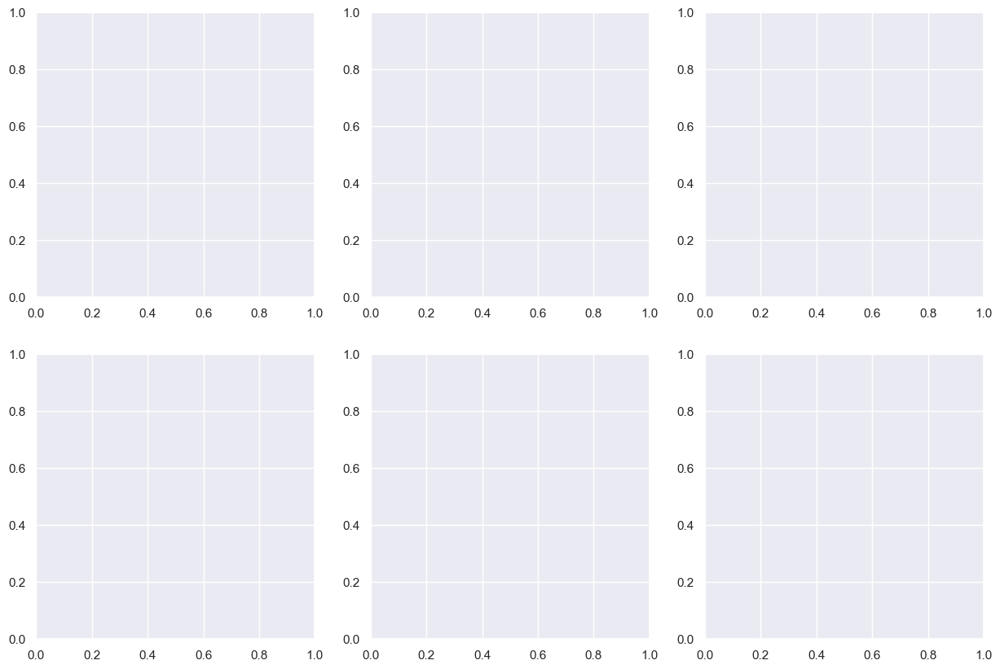

In [447]:
# Set up the layout for a 2x3 grid (or change to (3, 2) for a 3x2 layout)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()  # Flatten the 2D array of axes for easy indexing

In [270]:
# Loop through each maker and plot their data in each subplot
for i, maker in enumerate(makers):
    # Filter for each maker
    maker_df = makers_above10[makers_above10['Maker'] == maker]
    maker_df = makers_above10[makers_above10['Year'] == year]

maker_df

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
22056,Violin,1959-06-23,22750,Christie's,NaN,"Stradivari, Antonio",Cremona,Italy,1959


In [272]:
makers_above10.head()

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
21948,Violin,2023-06-09,5900000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy,2023
21949,Violin,2023-03-28,2215565,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy,2023
21950,Violin,2023-03-28,1452426,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy,2023
21951,Violin,2022-06-10,15340000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy,2022
21952,Violin,2017-03-28,2410310,Ingles & Hayday,Cremona,"Stradivari, Antonio",Cremona,Italy,2017


### Make a grid of makers, and fit each with a linear regression line

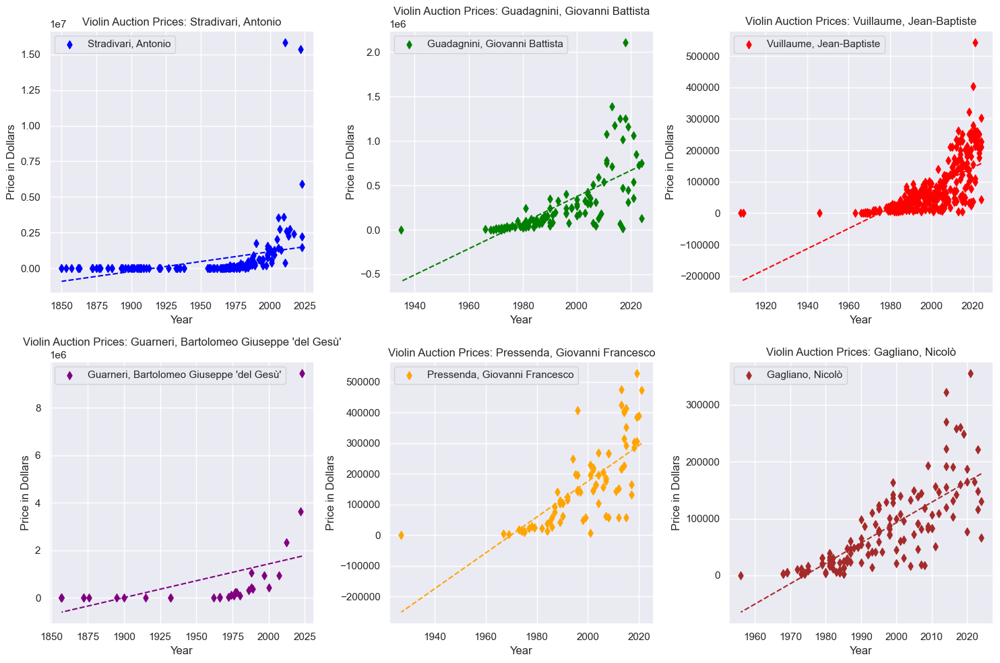

In [274]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Define the list of makers
makers_above10 = pd.concat([Strads_Antonio, Guad_Battista, Vuillaume, Guarneri_delGesu, Pressenda, Gagliano_Nicolo])
makers = [
    'Stradivari, Antonio', 'Guadagnini, Giovanni Battista', 'Vuillaume, Jean-Baptiste', 
    "Guarneri, Bartolomeo Giuseppe 'del Gesù'", 'Pressenda, Giovanni Francesco', 'Gagliano, Nicolò'
         ]
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

# Set up the layout for a 2x3 grid (or change to (3, 2) for a 3x2 layout)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Flatten the 2D array of axes for easy indexing
axes = axes.flatten()  

# Loop through each maker and plot their data in each subplot
for i, maker in enumerate(makers):
    # Filter for each maker
    maker_df = makers_above10[makers_above10['Maker'] == maker]

# Plot on the ith subplot
    ax = axes[i]
    ax.scatter(maker_df['Year'], maker_df['SalePrice'], color=colors[i], label=maker, marker='d')
    
# Fit and plot a trendline if there's enough data
    if len(maker_df) > 1:
        slope, intercept, _, _, _ = linregress(maker_df['Year'], maker_df['SalePrice'])
        ax.plot(maker_df['Year'], slope * maker_df['Year'] + intercept, color=colors[i], linestyle='--')
    
    # Set title and labels for each subplot
    ax.set_title(f'Violin Auction Prices: {maker}')
    ax.set_xlabel('Year')
    ax.set_ylabel('Price in Dollars')
    ax.legend()

# Adjust layout
plt.tight_layout()
plt.show()

### Look at the same data from 1970 on

Zoom in on when big changes of price begin, and look at a similar time period for each maker.

In [276]:
vlns_1970_on = violins[violins['Year'] >= 1970]
vlns_1970_on

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
0,Violin,2010-02-20,4200,Tarisio,Wallgau,"Achner, Michael",Mittenwald,Germany,2010
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,"Achner, Michael",Mittenwald,Germany,1987
2,Violin,2018-05-17,24000,Tarisio,Mittenwald,"Achner, Philip",Mittenwald,Germany,2018
3,Violin,2008-11-15,3884,Bongartz's,NaN,"Achner, Philip",Mittenwald,Germany,2008
4,Violin,1990-03-27,2146,Sotheby's,Mittenwald,"Achner, Philip",Mittenwald,Germany,1990
...,...,...,...,...,...,...,...,...,...
25260,Violin,2012-04-27,108000,Tarisio,"Brooklyn, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2012
25261,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2009
25262,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2009
25263,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2003


In [278]:
vlns_1970_on['Year'].min()

1970

In [280]:
Strads_Antonio1   = vlns_1970_on[(vlns_1970_on['Maker'].str.contains('Stradivari, Antonio'))]
Guad_Battista1    = vlns_1970_on[(vlns_1970_on['Maker'].str.contains('Guadagnini, Giovanni Battista'))]
Vuillaume1        = vlns_1970_on[(vlns_1970_on['Maker'].str.contains('Vuillaume, Jean-Baptiste'))]
Guarneri_delGesu1 = vlns_1970_on[(vlns_1970_on['Maker'].str.contains("Guarneri, Bartolomeo Giuseppe 'del Gesù'"))]
Pressenda1        = vlns_1970_on[(vlns_1970_on['Maker'].str.contains('Pressenda, Giovanni Francesco'))]
Gagliano_Nicolo1  = vlns_1970_on[(vlns_1970_on['Maker'].str.contains('Gagliano, Nicolò'))]
Guarneri_delGesu1

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
11402,Violin,2023-03-17,9440000,NaN,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,2023
11403,Violin,2022-06-03,3637892,NaN,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,2022
11404,Violin,2012-06-25,2333175,Tarisio,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,2012
11405,Violin,2007-10-12,937000,Christie's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,2007
11406,Violin,2000-11-14,445632,Sotheby's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,2000
11407,Violin,1997-11-18,935068,Sotheby's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,1997
11408,Violin,1989-06-15,384434,Sotheby's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,1989
11409,Violin,1988-11-23,1050764,Sotheby's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,1988
11410,Violin,1988-11-23,444554,Christie's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,1988
11411,Violin,1986-03-19,317245,Sotheby's,Cremona,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",Cremona,Italy,1986


In [282]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Define the list of makers
makers_above10_1970 = pd.concat([Strads_Antonio1, Guad_Battista1, Vuillaume1, Guarneri_delGesu1, Pressenda1, Gagliano_Nicolo1])
makers = [
    'Stradivari, Antonio', 'Guadagnini, Giovanni Battista', 'Vuillaume, Jean-Baptiste', 
    "Guarneri, Bartolomeo Giuseppe 'del Gesù'", 'Pressenda, Giovanni Francesco', 'Gagliano, Nicolò'
         ]
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

In [284]:
makers_above10_1970['Year'].min()

1970

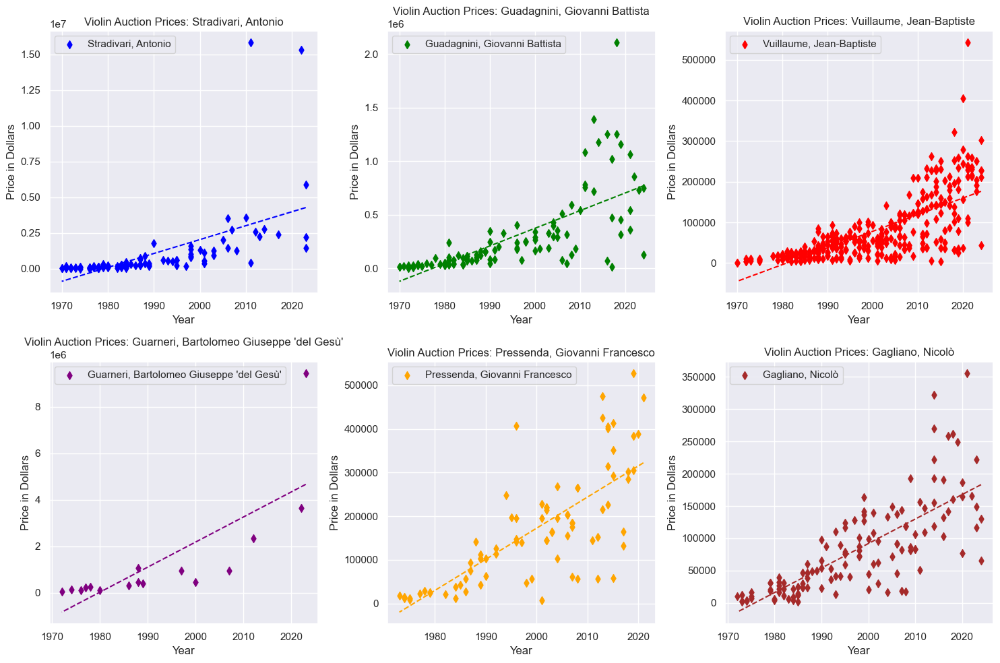

In [853]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Define the list of makers
makers_above10_1970 = pd.concat([Strads_Antonio1, Guad_Battista1, Vuillaume1, Guarneri_delGesu1, Pressenda1, Gagliano_Nicolo1])
makers = [
    'Stradivari, Antonio', 'Guadagnini, Giovanni Battista', 'Vuillaume, Jean-Baptiste', 
    "Guarneri, Bartolomeo Giuseppe 'del Gesù'", 'Pressenda, Giovanni Francesco', 'Gagliano, Nicolò'
         ]
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

# Set up the layout for a 2x3 grid (or change to (3, 2) for a 3x2 layout)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Flatten the 2D array of axes for easy indexing
axes = axes.flatten()  

# Loop through each maker and plot their data in each subplot
for i, maker in enumerate(makers):
    # Filter for each maker
    maker_df = makers_above10_1970[makers_above10_1970['Maker'] == maker]

# Plot on the ith subplot
    ax = axes[i]
    ax.scatter(maker_df['Year'], maker_df['SalePrice'], color=colors[i], label=maker, marker='d')
    
# Fit and plot a trendline if there's enough data
    if len(maker_df) > 1:
        slope, intercept, _, _, _ = linregress(maker_df['Year'], maker_df['SalePrice'])
        ax.plot(maker_df['Year'], slope * maker_df['Year'] + intercept, color=colors[i], linestyle='--')  
    
    # Set title and labels for each subplot
    ax.set_title(f'Violin Auction Prices: {maker}')
    ax.set_xlabel('Year')
    ax.set_ylabel('Price in Dollars')
    ax.legend()

# Adjust layout
plt.tight_layout()
plt.show()

### Fit the data with an n-degree polynomial

Set degree = 1, 2, or 3

makers_above10_1970 is a small dataframe of violin makers whose aggregate sales exceed $10 million

and includes violin sales starting in 1970.

Stradivari, Antonio
R^2 Score: 0.3986879122175335
Coefficients: [ 0.00000000e+00 -1.18597437e+07  2.99769459e+03]
Intercept: 11730189477.840666
5-Fold Cross-Validation R^2 Scores for 2 -degree Polynomial Regression: [ -0.05460605  -0.56022852  -0.30228281  -1.33133095 -27.25081717]
Average R^2 Score: -5.899853097678752
#####################
Guadagnini, Giovanni Battista
R^2 Score: 0.49125259311917135
Coefficients: [ 0.00000000e+00 -9.89610180e+05  2.51901292e+02]
Intercept: 971928241.6936089
5-Fold Cross-Validation R^2 Scores for 2 -degree Polynomial Regression: [-0.15314473  0.1243916   0.15261134  0.05360331 -3.0392387 ]
Average R^2 Score: -0.5723554362799204
#####################
Vuillaume, Jean-Baptiste
R^2 Score: 0.5698075683655567
Coefficients: [ 0.00000000e+00 -4.24252630e+05  1.07097661e+02]
Intercept: 420172654.30421996
5-Fold Cross-Validation R^2 Scores for 2 -degree Polynomial Regression: [  0.08926494   0.1927565   -0.17354435  -0.66982476 -27.49743337]
Average R^2 Score: -

/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarnin

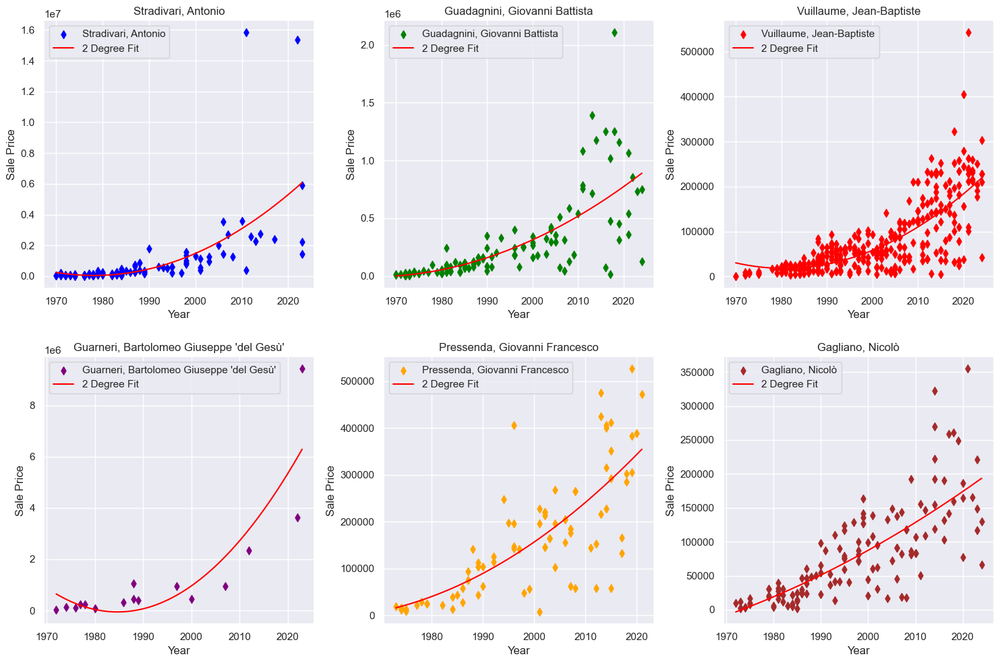

In [287]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Define the list of makers
makers_above10_1970 = pd.concat([Strads_Antonio1, Guad_Battista1, Vuillaume1, Guarneri_delGesu1, Pressenda1, Gagliano_Nicolo1])
makers = [
    'Stradivari, Antonio', 'Guadagnini, Giovanni Battista', 'Vuillaume, Jean-Baptiste', 
    "Guarneri, Bartolomeo Giuseppe 'del Gesù'", 'Pressenda, Giovanni Francesco', 'Gagliano, Nicolò'
         ]
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

# Set up the layout for a 2x3 grid (or change to (3, 2) for a 3x2 layout)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Flatten the 2D array of axes for easy indexing
axes = axes.flatten()  

# Loop through each maker and plot their data in each subplot
for i, maker in enumerate(makers):
    # Filter for each maker
    maker_df = makers_above10_1970[makers_above10_1970['Maker'] == maker]

    # Assign data points
    X = maker_df[['Year']]
    y = maker_df['SalePrice']
 
    # Define the degree of the polynomial (e.g., 1 for linear, 2 for quadratic, 3 for cubic)
    degree = 2
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)
    
    # Fit the polynomial regression model
    model = LinearRegression()
    model.fit(X_poly, y)
   
    # Calculate R^2, coefficients and intercept
    r_squared = model.score(X_poly, y)
    coefficients = model.coef_
    intercept = model.intercept_
    
    # Print results
    print(maker)
    print("R^2 Score:", r_squared)
    print("Coefficients:", coefficients)
    print("Intercept:", intercept)
    
    # Perform 5-fold cross-validation
    cv_scores = cross_val_score(model, X_poly, y, cv=5, scoring='r2')
    
    # Output the results
    print("5-Fold Cross-Validation R^2 Scores for", degree, "-degree Polynomial Regression:", cv_scores)
    print("Average R^2 Score:", cv_scores.mean())
    print("#####################")

    # Generate predictions for plotting
    X_range = np.linspace(X.min(), X.max(), 500).reshape(-1, 1)
    X_range_poly = poly.transform(X_range)
    y_poly_pred = model.predict(X_range_poly)
  
    # Plot the original data and the polynomial regression line on the ith subplot
    axes[i].scatter(X, y, color=colors[i], label=maker, marker='d')
    axes[i].plot(X_range, y_poly_pred, color='red', label=f'{degree} Degree Fit')
    axes[i].set_title(f'{maker}')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Sale Price')
    axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show() 


### Violins under $1 million, by region

vlns_by_region

In [289]:
vlns_by_region

,Country,SalePrice
0,Algeria,66067
1,Argentina,568209
2,Australia,30024
3,Austria,3166358
4,Belgium,4289968
5,Brazil,19860
6,Canada,27301
7,China,11826
8,Czechia,1488213
9,Denmark,465537


In [291]:
# violins_under_mill = by_region[by_region['SalePrice'] < 1000000]
# violins_under_mill.count()

In [293]:
violins_under_mill1 = violins[violins['SalePrice'] < 1000000]
violins_under_mill1.count()

Instrument      25229
SaleDate        25229
SalePrice       25229
AuctionHouse    23690
AuctionCity     18860
Maker           25229
City            24342
Country         24340
Year            25229
dtype: int64

In [295]:
vlns_by_region

,Country,SalePrice
0,Algeria,66067
1,Argentina,568209
2,Australia,30024
3,Austria,3166358
4,Belgium,4289968
5,Brazil,19860
6,Canada,27301
7,China,11826
8,Czechia,1488213
9,Denmark,465537


In [297]:
violins.head()

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
0,Violin,2010-02-20,4200,Tarisio,Wallgau,"Achner, Michael",Mittenwald,Germany,2010
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,"Achner, Michael",Mittenwald,Germany,1987
2,Violin,2018-05-17,24000,Tarisio,Mittenwald,"Achner, Philip",Mittenwald,Germany,2018
3,Violin,2008-11-15,3884,Bongartz's,NaN,"Achner, Philip",Mittenwald,Germany,2008
4,Violin,1990-03-27,2146,Sotheby's,Mittenwald,"Achner, Philip",Mittenwald,Germany,1990


In [299]:
vlns_by_region1 = violins.groupby(['Country', 'Maker'])['SalePrice'].sum()
vlns_by_region1 = pd.DataFrame(by_region).reset_index()
vlns_by_region1

,index,Country,Maker,SalePrice
0,0,Algeria,"Bauer, Jean",124833
1,1,Algeria,"Peyrot, Alfred",583
2,2,Argentina,"Baldoni, Dante",59190
3,3,Argentina,"Bruni, Mateo",30396
4,4,Argentina,"Capalbo, Giovanni",6900
...,...,...,...,...
3078,3078,United States,"Smart, Winfred",2070
3079,3079,United States,"Watson, William D.",440258
3080,3080,United States,"Woodward, C.F.",6436
3081,3081,Uruguay,"Fulquet, Annibal",6703


### Visualize mean sale prices for violins under $1 million dollars, by country 

In [303]:
violins_under_mill1 = violins[violins['SalePrice'] < 1000000]
violins_under_mill1

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
0,Violin,2010-02-20,4200,Tarisio,Wallgau,"Achner, Michael",Mittenwald,Germany,2010
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,"Achner, Michael",Mittenwald,Germany,1987
2,Violin,2018-05-17,24000,Tarisio,Mittenwald,"Achner, Philip",Mittenwald,Germany,2018
3,Violin,2008-11-15,3884,Bongartz's,NaN,"Achner, Philip",Mittenwald,Germany,2008
4,Violin,1990-03-27,2146,Sotheby's,Mittenwald,"Achner, Philip",Mittenwald,Germany,1990
...,...,...,...,...,...,...,...,...,...
25260,Violin,2012-04-27,108000,Tarisio,"Brooklyn, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2012
25261,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2009
25262,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2009
25263,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2003


In [305]:
violins_under_mill1.groupby('Country')[['SalePrice']].mean()

,SalePrice
Country,
Algeria,4719.071429
Argentina,8002.943662
Australia,6004.800000
Austria,14524.577982
Belgium,6986.918567
Brazil,3972.000000
Canada,2730.100000
China,5913.000000
Czechia,4252.037143


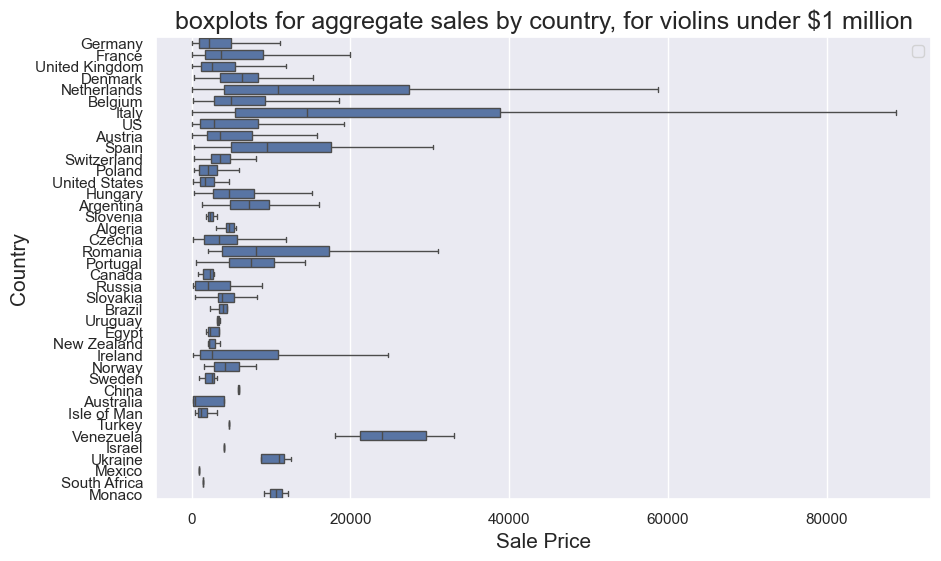

In [1002]:
# Visualize instruments under $1 million by region
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

sns.boxplot(x=violins_under_mill1['SalePrice'], y=violins_under_mill1['Country'], showfliers=False)
plt.title('boxplots for aggregate sales by country, for violins under $1 million', fontsize=18)
plt.ylabel('Country', fontsize=15)
plt.xlabel('Sale Price', fontsize=15)
plt.legend('')

plt.show()

In [307]:
violins_under_mill1[violins_under_mill1['Country'] == 'Venezuela']

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
18278,Violin,2024-03-15,33000,NaN,"Haddonfield, NJ","Peresson, Sergio",Caracas,Venezuela,2024
18279,Violin,2020-03-24,20715,Tarisio,Udine,"Peresson, Sergio",Caracas,Venezuela,2020
18280,Violin,2017-02-24,24000,Tarisio,"Philadelphia, PA","Peresson, Sergio",Caracas,Venezuela,2017
18281,Violin,2016-10-14,42000,Tarisio,NaN,"Peresson, Sergio",Caracas,Venezuela,2016
18282,Violin,2014-10-17,27600,Tarisio,"Haddonfield, NJ","Peresson, Sergio",Caracas,Venezuela,2014
18283,Violin,2011-10-14,32500,Christie's,NaN,"Peresson, Sergio",Caracas,Venezuela,2011
18284,Violin,2008-10-22,30278,Tarisio,"Haddonfield, NJ","Peresson, Sergio",Caracas,Venezuela,2008
18285,Violin,2006-07-15,4025,Tarisio,"Haddonfield, NJ","Peresson, Sergio",Caracas,Venezuela,2006
18286,Violin,2005-04-22,24000,Christie's,NaN,"Peresson, Sergio",Caracas,Venezuela,2005
18287,Violin,2004-05-06,28750,Tarisio,"Haddonfield, NJ","Peresson, Sergio",Caracas,Venezuela,2004


In [309]:
violins[violins['Country'] == 'Venezuela']

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
18278,Violin,2024-03-15,33000,NaN,"Haddonfield, NJ","Peresson, Sergio",Caracas,Venezuela,2024
18279,Violin,2020-03-24,20715,Tarisio,Udine,"Peresson, Sergio",Caracas,Venezuela,2020
18280,Violin,2017-02-24,24000,Tarisio,"Philadelphia, PA","Peresson, Sergio",Caracas,Venezuela,2017
18281,Violin,2016-10-14,42000,Tarisio,NaN,"Peresson, Sergio",Caracas,Venezuela,2016
18282,Violin,2014-10-17,27600,Tarisio,"Haddonfield, NJ","Peresson, Sergio",Caracas,Venezuela,2014
18283,Violin,2011-10-14,32500,Christie's,NaN,"Peresson, Sergio",Caracas,Venezuela,2011
18284,Violin,2008-10-22,30278,Tarisio,"Haddonfield, NJ","Peresson, Sergio",Caracas,Venezuela,2008
18285,Violin,2006-07-15,4025,Tarisio,"Haddonfield, NJ","Peresson, Sergio",Caracas,Venezuela,2006
18286,Violin,2005-04-22,24000,Christie's,NaN,"Peresson, Sergio",Caracas,Venezuela,2005
18287,Violin,2004-05-06,28750,Tarisio,"Haddonfield, NJ","Peresson, Sergio",Caracas,Venezuela,2004


In [311]:
violins_under_mill1.groupby('Country').count()

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Year
Country,,,,,,,,
Algeria,14,14,14,11,10,14,14,14
Argentina,71,71,71,65,65,71,71,71
Australia,5,5,5,5,5,5,5,5
Austria,218,218,218,211,174,218,218,218
Belgium,614,614,614,547,495,614,614,614
Brazil,5,5,5,5,3,5,5,5
Canada,10,10,10,9,10,10,10,10
China,2,2,2,1,2,2,2,2
Czechia,350,350,350,338,265,350,350,350


In [313]:
violins.groupby('Country').count()

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Year
Country,,,,,,,,
Algeria,14,14,14,11,10,14,14,14
Argentina,71,71,71,65,65,71,71,71
Australia,5,5,5,5,5,5,5,5
Austria,218,218,218,211,174,218,218,218
Belgium,614,614,614,547,495,614,614,614
Brazil,5,5,5,5,3,5,5,5
Canada,10,10,10,9,10,10,10,10
China,2,2,2,1,2,2,2,2
Czechia,350,350,350,338,265,350,350,350


In [315]:
vlns_france = violins[violins['Country'] == 'France']
vlns_france[vlns_france['SalePrice'] <= 1000000]

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
5,Violin,2019-11-08,2950,Tarisio,NaN,"Acoulon, Alexandre Alfred",Mirecourt,France,2019
6,Violin,2013-10-16,3000,Tarisio,Paris,"Acoulon, Alexandre Alfred",Mirecourt,France,2013
7,Violin,2007-10-25,4388,Tarisio,Mirecourt,"Acoulon, Alexandre Alfred",Mirecourt,France,2007
8,Violin,1994-07-19,1365,Bonhams,Paris,"Acoulon, Alexandre Alfred",Mirecourt,France,1994
9,Violin,1989-06-22,874,Phillip's,Mirecourt,"Acoulon, Alexandre Alfred",Mirecourt,France,1989
...,...,...,...,...,...,...,...,...,...
24348,Violin,1969-02-28,408,Sotheby's,NaN,"Vuillaume (St. Cecile mark), Jean-Baptiste & N...",Mirecourt,France,1969
24356,Violin,2014-11-09,375,Skinner,Tyrol,"Wagner, H.",Paris,France,2014
24357,Violin,2011-11-11,3900,Tarisio,Paris,"Wagner, H.",Paris,France,2011
24358,Violin,2005-11-04,4025,Tarisio,Paris,"Wagner, H.",Paris,France,2005


# ISN'T THIS FOR ALL INSTRUMENTS!? 

In [318]:
by_region

,Country,Maker,SalePrice
0,Algeria,"Bauer, Jean",124833
1,Algeria,"Peyrot, Alfred",583
2,Argentina,"Baldoni, Dante",59190
3,Argentina,"Bruni, Mateo",30396
4,Argentina,"Capalbo, Giovanni",6900
...,...,...,...
3078,United States,"Smart, Winfred",2070
3079,United States,"Watson, William D.",440258
3080,United States,"Woodward, C.F.",6436
3081,Uruguay,"Fulquet, Annibal",6703


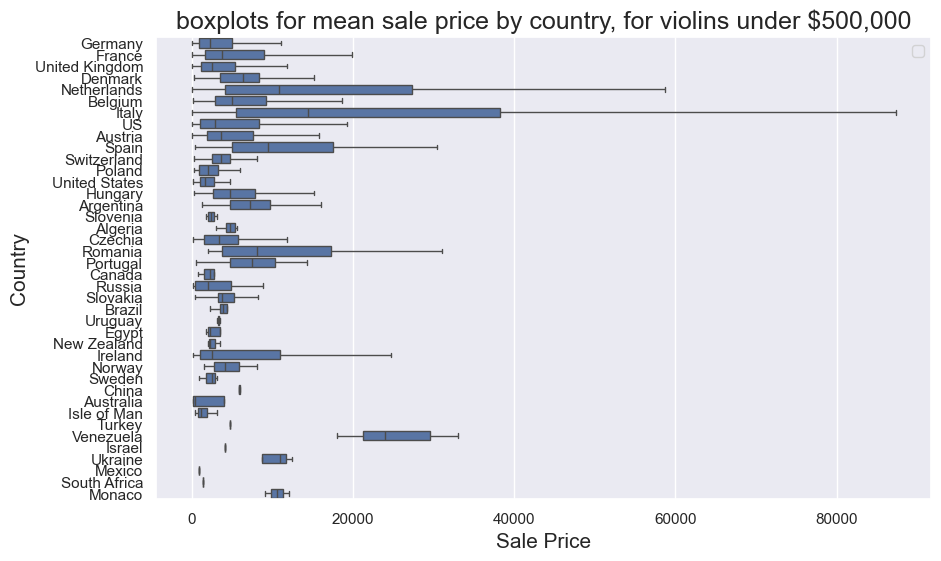

In [1031]:
# Visualize instruments under $500,000 by region
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

# Data for instruments under $500,000
violins_under_500 = violins[violins['SalePrice'] < 500000]

sns.boxplot(x=violins_under_500['SalePrice'], y=violins_under_500['Country'], showfliers=False)
plt.title('boxplots for mean sale price by country, for violins under $500,000', fontsize=18)
plt.ylabel('Country', fontsize=15)
plt.xlabel('Sale Price', fontsize=15)
plt.legend('')

plt.show()

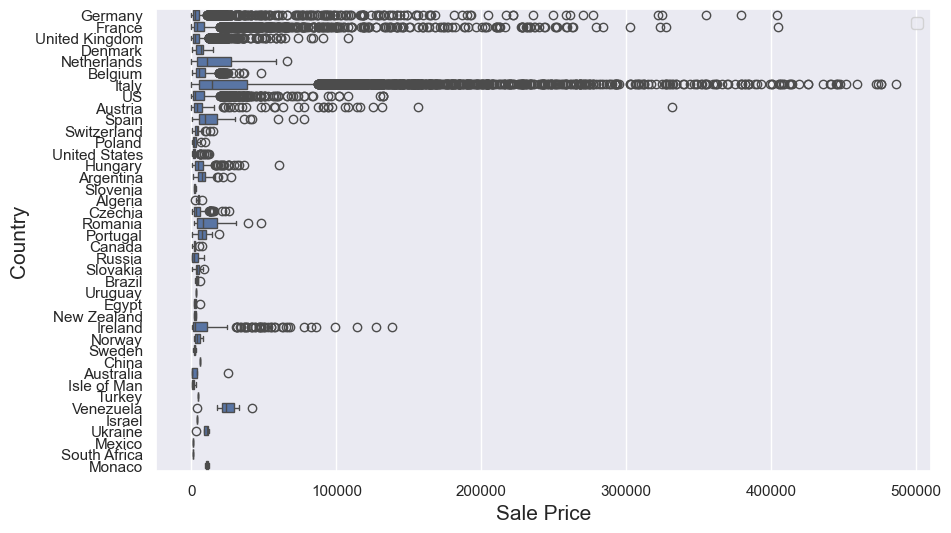

In [320]:
# Visualize instruments under $500,000 by region
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

# Data for instruments under $500,000
violins_under_500 = violins[violins['SalePrice'] < 500000]

sns.boxplot(x=violins_under_500['SalePrice'], y=violins_under_500['Country'])
plt.title('', fontsize=18)
plt.ylabel('Country', fontsize=15)
plt.xlabel('Sale Price', fontsize=15)
plt.legend('')

plt.show()

### Box Plot by Decade to Show Distribution Changes

In [322]:
vln_top_regions['Country'].unique()

array(['Italy', 'France', 'United Kingdom', 'Germany', 'US', 'Belgium',
       'Netherlands', 'Austria', 'Ireland', 'Hungary', 'Czechia'],
      dtype=object)

In [324]:
vln_top_regions

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
33,Violin,2019-11-08,4130,Tarisio,Milan,"Agostinelli, Luigi",Gubbio,Italy,2019
34,Violin,2018-06-25,3603,Tarisio,Milan,"Agostinelli, Luigi",Gubbio,Italy,2018
35,Violin,2017-10-23,5934,Tarisio,Turin,"Agostinelli, Luigi",Gubbio,Italy,2017
36,Violin,2013-10-16,4800,Tarisio,Milan,"Agostinelli, Luigi",Gubbio,Italy,2013
37,Violin,2005-10-16,4700,Skinner,Milan,"Agostinelli, Luigi",Gubbio,Italy,2005
...,...,...,...,...,...,...,...,...,...
24450,Violin,2019-10-21,4054,Brompton's,Znojmo,"Wassermann, Joseph",Znojmo,Czechia,2019
24451,Violin,2008-03-31,3706,Dorotheum,NaN,"Wassermann, Joseph",Znojmo,Czechia,2008
24452,Violin,1990-03-27,5366,Sotheby's,NaN,"Wassermann, Joseph",Znojmo,Czechia,1990
24758,Violin,1995-05-11,143,Phillip's,Rochdale,"Wild, Franz Anton",Brno,Czechia,1995


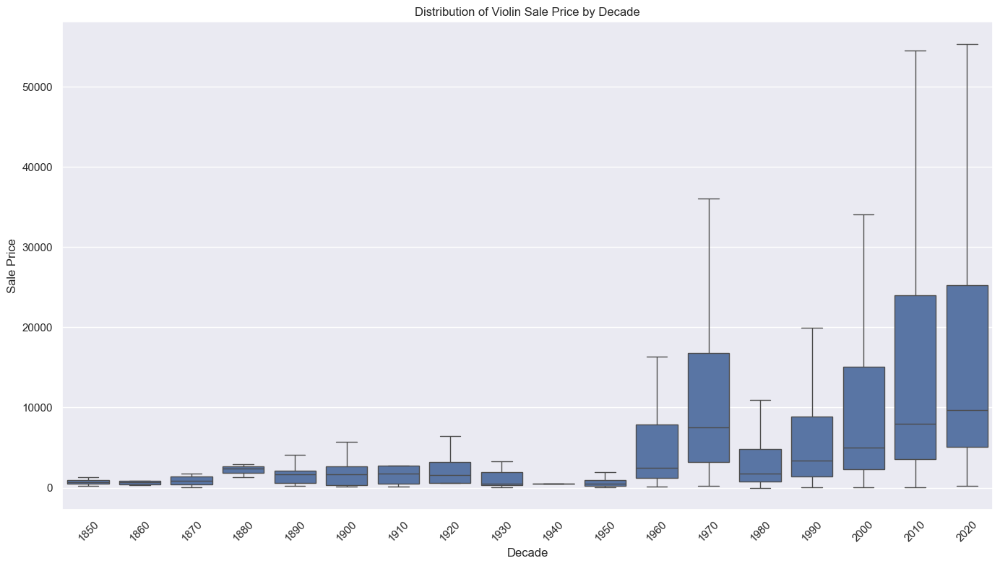

In [515]:
# Using seaborn, matplotlib

# Copy dataframe
vlns_by_decade1 = violins.copy()

# Add a decade column
vlns_by_decade1['Decade'] = (vlns_by_decade1['Year'] // 10) * 10

# Box plot by decade
plt.figure(figsize=(14, 8))
fig = sns.set_theme()   # set defaults: grey background and white grid lines
fig = sns.boxplot(x='Decade', y='SalePrice', data=vlns_by_decade1, showfliers=False)
# plt.yscale('log')
plt.xlabel('Decade')
plt.ylabel('Sale Price')
plt.title('Distribution of Violin Sale Price by Decade')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

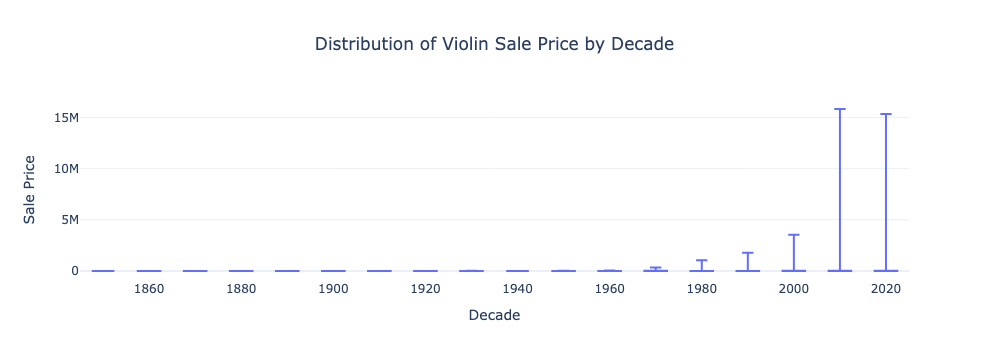

In [12]:
import pandas as pd
import plotly.express as px
import numpy as np

violins = Tarisio.query('Instrument == "Violin"').reset_index().drop(['index','MakerID'], axis=1)

# Copy dataframe
vlns_by_decade2 = violins.copy()

# Calculate the Decade column
vlns_by_decade2['Decade'] = (vlns_by_decade2['Year'] // 10) * 10

# Calculate stats for each Decade
stats = vlns_by_decade2.groupby('Decade').agg(
    mean_price=('SalePrice', 'mean'),
    min_price=('SalePrice', 'min'),
    max_price=('SalePrice', 'max')
).reset_index()

# Merge stats back to the main DataFrame for hover information
vlns_by_decade2 = vlns_by_decade2.merge(stats, on='Decade')

# Create the boxplot with Plotly
fig = px.box(
    vlns_by_decade2,
    x='Decade',
    y='SalePrice',
    points=False,  # To hide outliers
    labels={'SalePrice': 'Sale Price', 'Decade': 'Decade'},
    title='Distribution of Violin Sale Price by Decade'
)

# Customize hover template
fig.update_traces(
    hovertemplate=(
        "Decade: %{x}<br>"
        "Sale Price: %{y}<br>"
        "Mean Price: $%{customdata[0]:,.2f}<br>"
        "Min Price: $%{customdata[1]:,.2f}<br>"
        "Max Price: $%{customdata[2]:,.2f}<br>"
    ),
    customdata=np.stack(
        [vlns_by_decade2['mean_price'], vlns_by_decade2['min_price'], vlns_by_decade2['max_price']],
        axis=-1
    )
)

# Update layout
fig.update_layout(
    xaxis_title="Decade",
    yaxis_title="Sale Price",
    title_x=0.5,  # Center the title
    template="plotly_white"  # Clean white background
)

# Show the plot
fig.show()

In [328]:
Strads

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country
21948,Violin,2023-06-09,5900000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21949,Violin,2023-03-28,2215565,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21950,Violin,2023-03-28,1452426,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21951,Violin,2022-06-10,15340000,NaN,Cremona,"Stradivari, Antonio",Cremona,Italy
21952,Violin,2017-03-28,2410310,Ingles & Hayday,Cremona,"Stradivari, Antonio",Cremona,Italy
...,...,...,...,...,...,...,...,...
22115,Violin,1974-04-25,36045,Sotheby's,NaN,"Stradivari, Francesco",Cremona,Italy
22116,Violin,2016-05-13,156000,Tarisio,Cremona,"Stradivari, Omobono Felice",Cremona,Italy
22117,Violin,2005-11-04,370000,Tarisio,Cremona,"Stradivari, Omobono Felice",Cremona,Italy
22118,Violin,1976-05-06,28059,Sotheby's,NaN,"Stradivari, Omobono Felice",Cremona,Italy


### Look at decade trends for Strads

Took out the data for the 2020 decade. 

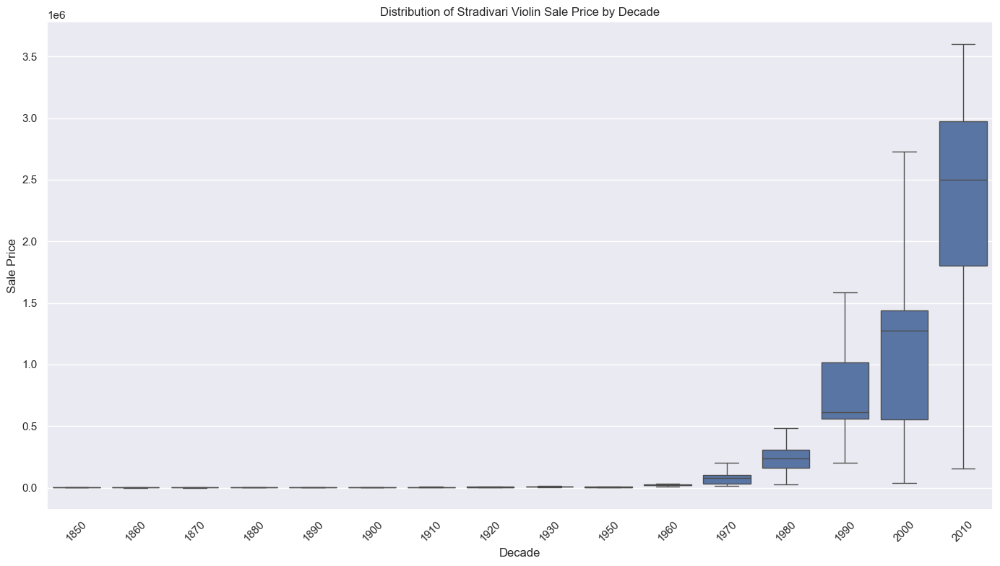

In [347]:
# Copy dataframe
Strads_by_decade = Strads.copy()

# Add a 'Year' column to Strads df
Strads_by_decade['Year'] = Strads_by_decade['SaleDate'].dt.year

# Remove 2020 decade data ($15 mill violin)
Strads_by_decade = Strads_by_decade[Strads_by_decade['Year'] < 2020]

# Add a decade column
Strads_by_decade['Decade'] = (Strads_by_decade['Year'] // 10) * 10

# Box plot by decade
plt.figure(figsize=(14, 8))
sns.boxplot(x='Decade', y='SalePrice', data=Strads_by_decade, showfliers=False)
# plt.yscale('log')
plt.xlabel('Decade')
plt.ylabel('Sale Price')
plt.title('Distribution of Stradivari Violin Sale Price by Decade')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [1059]:
top4_regions

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country
152,Violin,2019-11-08,4130,Tarisio,Milan,2665,"Agostinelli, Luigi",Gubbio,Italy
153,Violin,2018-06-25,3603,Tarisio,Milan,2665,"Agostinelli, Luigi",Gubbio,Italy
154,Violin,2017-10-23,5934,Tarisio,Turin,2665,"Agostinelli, Luigi",Gubbio,Italy
155,Violin,2013-10-16,4800,Tarisio,Milan,2665,"Agostinelli, Luigi",Gubbio,Italy
156,Viola,2012-11-27,8180,Tarisio,Milan,2665,"Agostinelli, Luigi",Gubbio,Italy
...,...,...,...,...,...,...,...,...,...
55234,Violin,1985-03-14,250,Phillip's,Markneukirchen,1394,"Zimmermann, Julius Heinrich",Markneukirchen,Germany
55266,Violin,2002-10-24,2138,Tarisio,NaN,15204,"Zwerger, Anton II",Passau,Germany
55267,Violin,1997-11-18,2633,Bonhams,Passau,15204,"Zwerger, Anton II",Passau,Germany
55268,Viola,1991-09-19,1520,Phillip's,Passau,15204,"Zwerger, Anton II",Passau,Germany


In [1065]:
top4_regions['Year'] = top4_regions['SaleDate'].dt.year
top4_regions

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country,Year
152,Violin,2019-11-08,4130,Tarisio,Milan,2665,"Agostinelli, Luigi",Gubbio,Italy,2019
153,Violin,2018-06-25,3603,Tarisio,Milan,2665,"Agostinelli, Luigi",Gubbio,Italy,2018
154,Violin,2017-10-23,5934,Tarisio,Turin,2665,"Agostinelli, Luigi",Gubbio,Italy,2017
155,Violin,2013-10-16,4800,Tarisio,Milan,2665,"Agostinelli, Luigi",Gubbio,Italy,2013
156,Viola,2012-11-27,8180,Tarisio,Milan,2665,"Agostinelli, Luigi",Gubbio,Italy,2012
...,...,...,...,...,...,...,...,...,...,...
55234,Violin,1985-03-14,250,Phillip's,Markneukirchen,1394,"Zimmermann, Julius Heinrich",Markneukirchen,Germany,1985
55266,Violin,2002-10-24,2138,Tarisio,NaN,15204,"Zwerger, Anton II",Passau,Germany,2002
55267,Violin,1997-11-18,2633,Bonhams,Passau,15204,"Zwerger, Anton II",Passau,Germany,1997
55268,Viola,1991-09-19,1520,Phillip's,Passau,15204,"Zwerger, Anton II",Passau,Germany,1991


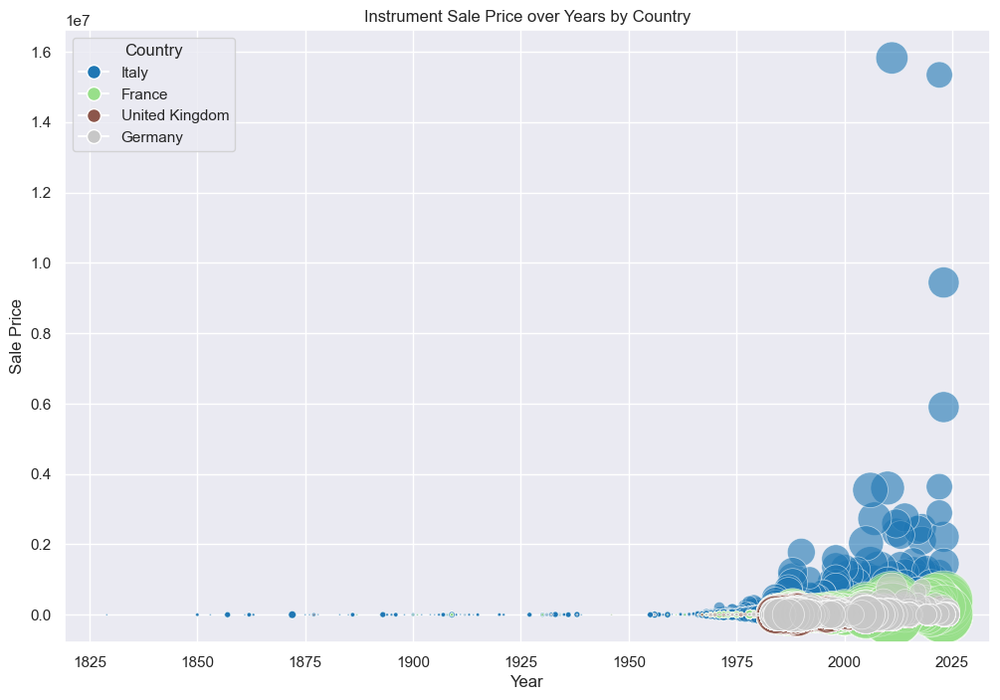

In [1069]:
### Make a bubble chart for violins with SalePrice and Year, with bubble size set to countryimport pandas as pd
import matplotlib.pyplot as plt

# copy of violins data to use
vlns_bubb = top4_regions.copy()

# Count the number of instruments by Year, Country, and Maker
instrument_counts = vlns_bubb.groupby(['Year', 'Country']).size().reset_index(name='InstrumentCount')

# Merge the counts back to the original DataFrame to get the count per row
vlns_bubb = pd.merge(vlns_bubb, instrument_counts, on=['Year', 'Country'], how='left')

# Set up color mapping by Country
countries = vlns_bubb['Country'].unique()
color_map = {country: plt.cm.tab20(i / len(countries)) for i, country in enumerate(countries)}

# Map colors to each country in the DataFrame
vlns_bubb['Color'] = vlns_bubb['Country'].map(color_map)

# Create the bubble plot
plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    vlns_bubb['Year'],
    vlns_bubb['SalePrice'],
    s=vlns_bubb['InstrumentCount'] * 2,  # Adjust the size scaling as needed
    c=vlns_bubb['Color'],
    alpha=0.6,
    edgecolors="w",
    linewidth=0.5
)

# Add legend for countries
handles = [plt.Line2D([0], [0], marker='o', color='w', label=country, markersize=10, 
            markerfacecolor=color_map[country]) for country in countries]
plt.legend(handles=handles, title="Country")

# Label axes and show plot
plt.xlabel('Year')
plt.ylabel('Sale Price')
plt.title('Instrument Sale Price over Years by Country')
plt.show()

In [1055]:
vlns_bubb

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year,InstrumentCount
0,Violin,2010-02-20,4200,Tarisio,Wallgau,"Achner, Michael",Mittenwald,Germany,2010,97.0
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,"Achner, Michael",Mittenwald,Germany,1987,134.0
2,Violin,2018-05-17,24000,Tarisio,Mittenwald,"Achner, Philip",Mittenwald,Germany,2018,29.0
3,Violin,2008-11-15,3884,Bongartz's,NaN,"Achner, Philip",Mittenwald,Germany,2008,119.0
4,Violin,1990-03-27,2146,Sotheby's,Mittenwald,"Achner, Philip",Mittenwald,Germany,1990,118.0
...,...,...,...,...,...,...,...,...,...,...
25260,Violin,2012-04-27,108000,Tarisio,"Brooklyn, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2012,49.0
25261,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2009,35.0
25262,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2009,35.0
25263,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2003,35.0


In [1071]:
instrument_counts.describe()

,Year,InstrumentCount
count,312.000000,312.000000
mean,1975.009615,147.410256
std,41.293981,164.726661
min,1829.000000,1.000000
25%,1965.750000,3.000000
50%,1985.500000,101.000000
75%,2005.000000,252.000000
max,2024.000000,1043.000000


In [1047]:
violins

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
0,Violin,2010-02-20,4200,Tarisio,Wallgau,"Achner, Michael",Mittenwald,Germany,2010
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,"Achner, Michael",Mittenwald,Germany,1987
2,Violin,2018-05-17,24000,Tarisio,Mittenwald,"Achner, Philip",Mittenwald,Germany,2018
3,Violin,2008-11-15,3884,Bongartz's,NaN,"Achner, Philip",Mittenwald,Germany,2008
4,Violin,1990-03-27,2146,Sotheby's,Mittenwald,"Achner, Philip",Mittenwald,Germany,1990
...,...,...,...,...,...,...,...,...,...
25260,Violin,2012-04-27,108000,Tarisio,"Brooklyn, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2012
25261,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2009
25262,Violin,2009-12-14,15634,Brompton's,NaN,"Zygmuntowicz, Samuel","Brooklyn, NY",US,2009
25263,Violin,2003-05-08,130000,Tarisio,"Brooklyn, NY","Zygmuntowicz, Samuel","Brooklyn, NY",US,2003


# Nicolo Gagliano, German???? 

In [365]:
Tarisio[Tarisio['Maker'] == 'Gagliano, Nicolò']

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country
16803,Violin,2024-05-31,66000,NaN,Naples,1497,"Gagliano, Nicolò",Aachen,Germany
16804,Violin,2024-03-15,130000,NaN,Naples,1497,"Gagliano, Nicolò",Aachen,Germany
16805,Violin,2023-10-31,116521,NaN,Naples,1497,"Gagliano, Nicolò",Aachen,Germany
16806,Violin,2023-06-05,148578,NaN,Naples,1497,"Gagliano, Nicolò",Aachen,Germany
16807,Violin,2023-03-28,221556,NaN,Naples,1497,"Gagliano, Nicolò",Aachen,Germany
...,...,...,...,...,...,...,...,...,...
16938,Violin,1968-07-19,2104,Sotheby's,NaN,1497,"Gagliano, Nicolò",Aachen,Germany
16939,Violin,1968-04-18,2883,Sotheby's,NaN,1497,"Gagliano, Nicolò",Aachen,Germany
16940,Violin,1956-05-24,320,Puttick & Simpson,NaN,1497,"Gagliano, Nicolò",Aachen,Germany
16941,Cello,1946-10-22,2200,Puttick & Simpson,NaN,1497,"Gagliano, Nicolò",Aachen,Germany


In [373]:
Gagliano_family = Tarisio[Tarisio['Maker'].str.contains('Gagliano')]
Gagliano_family

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country
16460,Violin,2023-06-05,89147,NaN,Naples,187,"Gagliano, Alessandro",Naples,Italy
16461,Violin,2022-03-29,283662,NaN,Naples,187,"Gagliano, Alessandro",Naples,Italy
16462,Violin,2019-10-21,3430,Brompton's,NaN,187,"Gagliano, Alessandro",Naples,Italy
16463,Violin,2016-06-28,218461,Tarisio,Naples,187,"Gagliano, Alessandro",Naples,Italy
16464,Violin,2014-10-17,228000,Tarisio,Naples,187,"Gagliano, Alessandro",Naples,Italy
...,...,...,...,...,...,...,...,...,...
16974,Violin,1989-11-05,8360,Skinner,Naples,193,"Gagliano, Raffaele & Antonio",Naples,Italy
16975,Violin,1987-04-30,3836,Sotheby's,Naples,193,"Gagliano, Raffaele & Antonio",Naples,Italy
16976,Cello,1985-04-02,18075,Christie's,Naples,193,"Gagliano, Raffaele & Antonio",Naples,Italy
16977,Cello,1981-03-07,30899,Bongartz's,NaN,193,"Gagliano, Raffaele & Antonio",Naples,Italy


In [375]:
Gagliano_family.groupby(['Maker', 'City'])['SalePrice'].count()

Maker                                   City   
Gagliano, Alessandro                    Naples      37
Gagliano, Antonio                       Naples      10
Gagliano, Antonio II                    Naples       3
Gagliano, Carlo                         Belluno      1
Gagliano, Ferdinando                    Naples      76
Gagliano, Gaetano                       Naples       2
Gagliano, Gennaro                       Naples      67
Gagliano, Giovanni I                    Naples      22
Gagliano, Giuseppe                      Belluno     77
Gagliano, Giuseppe & Antonio            Milan       47
Gagliano, Giuseppe, Antonio & Giovanni  Naples       1
Gagliano, Nicolò                        Aachen     140
Gagliano, Raffaele & Antonio            Naples      35
Gagliano, Vincenzo                      Naples       1
Name: SalePrice, dtype: int64

In [521]:
# From vln_top_regions

Italy_df   = violins[violins['Country'] == 'Italy']
France_df  = violins[violins['Country'] == 'France']
UK_df      = violins[violins['Country'] == 'United Kingdom']
Germany_df = violins[violins['Country'] == 'Germany']

In [523]:
top_makers_Italy = Italy_df.groupby(['Maker', 'Year', 'Country'])['SalePrice'].max()
top_makers_Italy = top_makers_Italy.sort_values(ascending=False)

import pandas as pd
top_makers_Italy_df = pd.DataFrame(data=top_makers_Italy).reset_index()
top_makers_Italy_df  #.groupby('Maker')['SalePrice'].sum()

,Maker,Year,Country,SalePrice
0,"Stradivari, Antonio",2011,Italy,15821285
1,"Stradivari, Antonio",2022,Italy,15340000
2,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",2023,Italy,9440000
3,"Stradivari, Antonio",2023,Italy,5900000
4,"Guarneri, Bartolomeo Giuseppe 'del Gesù'",2022,Italy,3637892
...,...,...,...,...
5413,"Guidanti, Giovanni",1955,Italy,153
5414,"Amati, Antonio & Girolamo",1908,Italy,143
5415,"Toppani, Angelo",1915,Italy,114
5416,"Albani, Matthias II",1955,Italy,84


In [527]:
# Group by 'Maker' and find total sales for each one
top_makers_Italy = Italy_df.groupby(['Maker',])['SalePrice'].sum()

# Get the top 10 makers by total sales
top10_makers_Italy = top_makers_Italy.nlargest(10).index.tolist()
print(top10_makers_Italy)

# Filter original dataset for these makers
top10_makers_Italy_df = Italy_df[Italy_df['Maker'].isin(top10_makers_Italy)]
top10_makers_Italy_df 

['Stradivari, Antonio', 'Guadagnini, Giovanni Battista', "Guarneri, Bartolomeo Giuseppe 'del Gesù'", 'Pressenda, Giovanni Francesco', 'Amati, Nicolò', "Guarneri, Giuseppe 'filius Andreae'", 'Fagnola, Annibale', 'Guarneri, Andrea', 'Rocca, Giuseppe Antonio', 'Storioni, Lorenzo']


,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
320,Violin,2023-06-09,354000,NaN,Cremona,"Amati, Nicolò",Cremona,Italy,2023
321,Violin,2023-03-23,8866,NaN,NaN,"Amati, Nicolò",Cremona,Italy,2023
322,Violin,2018-03-19,117957,Brompton's,Cremona,"Amati, Nicolò",Cremona,Italy,2018
323,Violin,2018-02-22,274500,Tarisio,Cremona,"Amati, Nicolò",Cremona,Italy,2018
324,Violin,2016-06-27,332315,Brompton's,Cremona,"Amati, Nicolò",Cremona,Italy,2016
...,...,...,...,...,...,...,...,...,...
22109,Violin,1862-06-26,853,Puttick & Simpson,NaN,"Stradivari, Antonio",Cremona,Italy,1862
22110,Violin,1857-02-18,973,Christie & Manson,NaN,"Stradivari, Antonio",Cremona,Italy,1857
22111,Violin,1853-05-28,606,Puttick & Simpson,NaN,"Stradivari, Antonio",Cremona,Italy,1853
22112,Violin,1850-11-28,588,Puttick & Simpson,NaN,"Stradivari, Antonio",Cremona,Italy,1850


In [529]:
# Group by 'Maker' and find total sales for each one
top_makers_France = France_df.groupby(['Maker',])['SalePrice'].sum()

# Get the top 10 makers by total sales
top10_makers_France = top_makers_France.nlargest(10).index.tolist()
print(top10_makers_France)

# Filter original dataset for these makers
top10_makers_France_df = France_df[France_df['Maker'].isin(top10_makers_France)]
top10_makers_France_df 

['Vuillaume, Jean-Baptiste', 'Lupot, Nicolas', 'Hel, Pierre Joseph', 'Bernardel, Auguste Sébastien Philippe père', 'Pique, François-Louis', 'Gand & Bernardel,  Firm', 'Collin-Mézin, Charles Jean-Baptiste III', 'Derazey, Honoré (Jean-Joseph)', 'Silvestre, Pierre', 'Silvestre, Hippolyte Chrétien']


,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
2004,Violin,2024-10-08,23721,NaN,Paris,"Bernardel, Auguste Sébastien Philippe père",Mirecourt,France,2024
2005,Violin,2024-03-22,12102,NaN,Paris,"Bernardel, Auguste Sébastien Philippe père",Mirecourt,France,2024
2006,Violin,2024-03-22,45382,NaN,Paris,"Bernardel, Auguste Sébastien Philippe père",Mirecourt,France,2024
2007,Violin,2023-10-31,32043,NaN,Paris,"Bernardel, Auguste Sébastien Philippe père",Mirecourt,France,2023
2008,Violin,2023-10-30,23311,NaN,Paris,"Bernardel, Auguste Sébastien Philippe père",Mirecourt,France,2023
...,...,...,...,...,...,...,...,...,...
24235,Violin,1966-11-17,392,Puttick & Simpson,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France,1966
24236,Violin,1963-05-30,556,Puttick & Simpson,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France,1963
24237,Violin,1946-09-26,460,Puttick & Simpson,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France,1946
24238,Violin,1909-10-27,319,Glendining & Co.,NaN,"Vuillaume, Jean-Baptiste",Mirecourt,France,1909


In [531]:
# Group by 'Maker' and find total sales for each one
top_makers_UK = UK_df.groupby(['Maker',])['SalePrice'].sum()

# Get the top 10 makers by total sales
top10_makers_UK = top_makers_UK.nlargest(10).index.tolist()
print(top10_makers_UK)

# Filter original dataset for these makers
top10_makers_UK_df = UK_df[UK_df['Maker'].isin(top10_makers_UK)]
top10_makers_UK_df 

['Chanot, Georges I', 'Hill & Sons, W. E. Firm', 'Craske, George', 'Lott, John Frederick II', 'Wulme-Hudson, George', 'Boullangier, Charles', 'Banks, Benjamin', 'Hesketh, Thomas Earle', 'Betts, John I', 'Chanot, Georges Adolphe']


,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
1345,Violin,2023-06-06,12645,NaN,Salisbury,"Banks, Benjamin",London,United Kingdom,2023
1346,Violin,2021-11-19,12000,NaN,Salisbury,"Banks, Benjamin",London,United Kingdom,2021
1347,Violin,2017-06-26,7642,Brompton's,Salisbury,"Banks, Benjamin",London,United Kingdom,2017
1348,Violin,2016-02-26,9440,Tarisio,London,"Banks, Benjamin",London,United Kingdom,2016
1349,Violin,2015-11-03,8311,Ingles & Hayday,Salisbury,"Banks, Benjamin",London,United Kingdom,2015
...,...,...,...,...,...,...,...,...,...
25137,Violin,1985-04-03,3613,Sotheby's,London,"Wulme-Hudson, George",Chessington,United Kingdom,1985
25138,Violin,1984-10-11,2695,Phillip's,NaN,"Wulme-Hudson, George",Chessington,United Kingdom,1984
25139,Violin,1984-06-21,3146,Sotheby's,London,"Wulme-Hudson, George",Chessington,United Kingdom,1984
25140,Violin,1983-11-25,2890,Sotheby's,London,"Wulme-Hudson, George",Chessington,United Kingdom,1983


In [533]:
# Group by 'Maker' and find total sales for each one
top_makers_Germany = Germany_df.groupby(['Maker',])['SalePrice'].sum()

# Get the top 10 makers by total sales
top10_makers_Germany = top_makers_Germany.nlargest(10).index.tolist()
print(top10_makers_Germany)

# Filter original dataset for these makers
top10_makers_Germany_df = Germany_df[Germany_df['Maker'].isin(top10_makers_Germany)]
top10_makers_Germany_df 

['Gagliano, Nicolò', 'Serafin, Santo', 'Sderci, Igino', 'Roth, Ernst Heinrich', 'Geissenhof, Franz', 'Gobetti, Francesco', 'Duke, Richard', 'Klotz, Aegidius Sebastian', 'Widhalm, Leopold I', 'Klotz, Sebastian I']


,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
7993,Violin,2023-03-28,5908,NaN,London,"Duke, Richard",Aachen,Germany,2023
7994,Violin,2022-06-02,6420,NaN,London,"Duke, Richard",Aachen,Germany,2022
7995,Violin,2020-12-03,5730,Vichy-Enchères,London,"Duke, Richard",Aachen,Germany,2020
7996,Violin,2020-03-24,5618,Tarisio,London,"Duke, Richard",Aachen,Germany,2020
7997,Violin,2019-03-18,6874,Brompton's,London,"Duke, Richard",Aachen,Germany,2019
...,...,...,...,...,...,...,...,...,...
24719,Violin,1986-03-22,1963,Bongartz's,Nürnberg,"Widhalm, Leopold I",Nürnberg,Germany,1986
24720,Violin,1984-11-22,2700,Sotheby's,Nürnberg,"Widhalm, Leopold I",Nürnberg,Germany,1984
24721,Violin,1984-11-26,1617,Bongartz's,Nürnberg,"Widhalm, Leopold I",Nürnberg,Germany,1984
24722,Violin,1984-04-09,1673,Bongartz's,Nürnberg,"Widhalm, Leopold I",Nürnberg,Germany,1984


# Bubble Charts
[Return to Table of Contents](#Contents)

# Top 10 makers from top 4 countries - bubble chart

In [533]:
import pandas as pd
top_bubb_regions = pd.concat([top10_makers_Italy_df, top10_makers_France_df, top10_makers_UK_df, top10_makers_Germany_df])
top_bubb_regions

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,Maker,City,Country,Year
320,Violin,2023-06-09,354000,NaN,Cremona,"Amati, Nicolò",Cremona,Italy,2023
321,Violin,2023-03-23,8866,NaN,NaN,"Amati, Nicolò",Cremona,Italy,2023
322,Violin,2018-03-19,117957,Brompton's,Cremona,"Amati, Nicolò",Cremona,Italy,2018
323,Violin,2018-02-22,274500,Tarisio,Cremona,"Amati, Nicolò",Cremona,Italy,2018
324,Violin,2016-06-27,332315,Brompton's,Cremona,"Amati, Nicolò",Cremona,Italy,2016
...,...,...,...,...,...,...,...,...,...
24719,Violin,1986-03-22,1963,Bongartz's,Nürnberg,"Widhalm, Leopold I",Nürnberg,Germany,1986
24720,Violin,1984-11-22,2700,Sotheby's,Nürnberg,"Widhalm, Leopold I",Nürnberg,Germany,1984
24721,Violin,1984-11-26,1617,Bongartz's,Nürnberg,"Widhalm, Leopold I",Nürnberg,Germany,1984
24722,Violin,1984-04-09,1673,Bongartz's,Nürnberg,"Widhalm, Leopold I",Nürnberg,Germany,1984


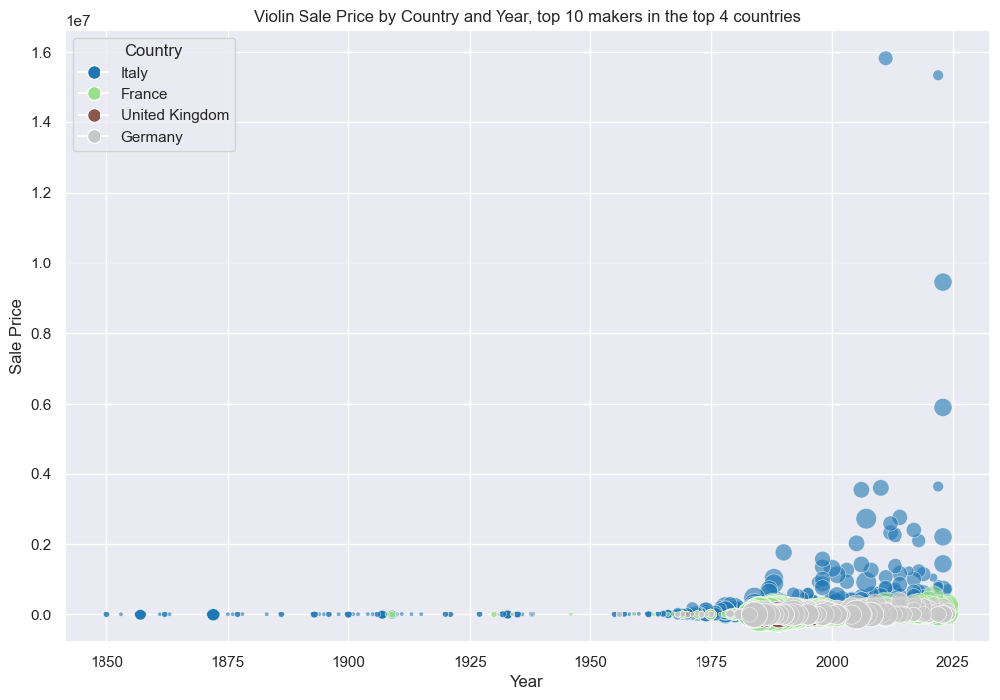

In [539]:
### Make a bubble chart for violins with SalePrice and Year, with bubble size set to country
import pandas as pd
import matplotlib.pyplot as plt

# copy of violins data to use
vlns_bubb = top_bubb_regions.copy()

# Count the number of instruments by Year, Country, and Maker
instrument_counts = vlns_bubb.groupby(['Year', 'Country']).size().reset_index(name='InstrumentCount')

# Merge the counts back to the original DataFrame to get the count per row
vlns_bubb = pd.merge(vlns_bubb, instrument_counts, on=['Year', 'Country'], how='left')

# Set up color mapping by Country
countries = vlns_bubb['Country'].unique()
color_map = {country: plt.cm.tab20(i / len(countries)) for i, country in enumerate(countries)}

# Map colors to each country in the DataFrame
vlns_bubb['Color'] = vlns_bubb['Country'].map(color_map)

# Create the bubble plot
plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    vlns_bubb['Year'],
    vlns_bubb['SalePrice'],
    s=vlns_bubb['InstrumentCount'] * 10,  # Adjust the size scaling as needed
    c=vlns_bubb['Color'],
    alpha=0.6,
    edgecolors="w",
    linewidth=0.5
)

# Add legend for countries
handles = [plt.Line2D([0], [0], marker='o', color='w', label=country, markersize=10, 
            markerfacecolor=color_map[country]) for country in countries]
plt.legend(handles=handles, title="Country")

# Label axes and show plot
plt.xlabel('Year')
plt.ylabel('Sale Price')
plt.title('Violin Sale Price by Country and Year, top 10 makers in the top 4 countries')
plt.show()

### Visualize top 10 makers in France

top10_makers_France_df

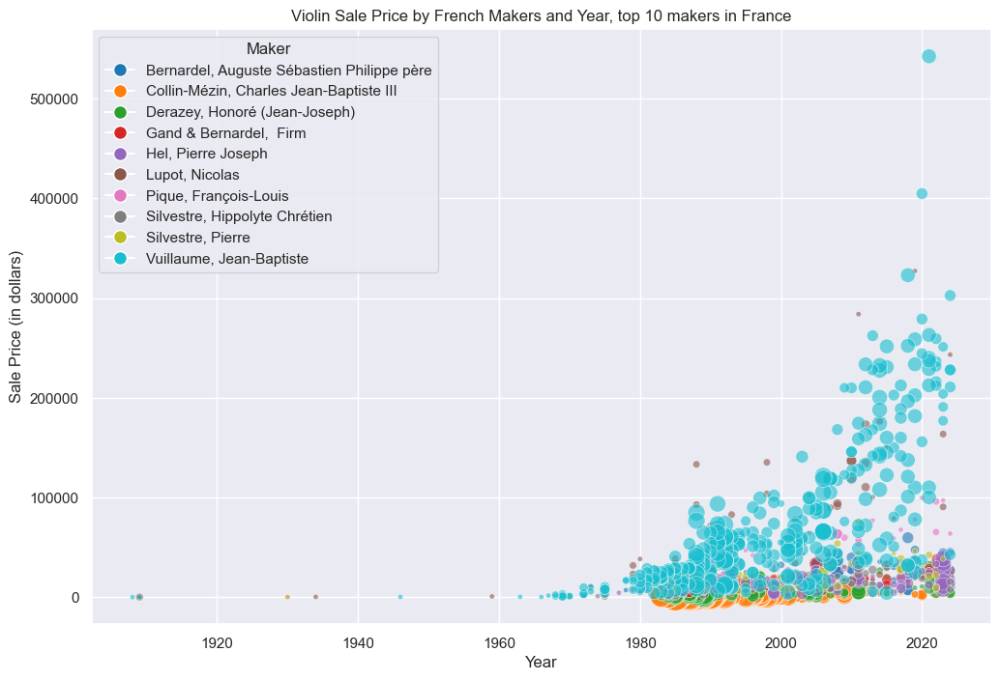

In [628]:
### Make a bubble chart for violins with SalePrice and Year, with bubble size set to country
import pandas as pd
import matplotlib.pyplot as plt
    
# copy of violins data to use
french_vlns_bubb = top10_makers_France_df.copy()

# Count the number of instruments by Year and Maker
instrument_counts = french_vlns_bubb.groupby(['Year', 'Maker']).size().reset_index(name='InstrumentCount')

# Merge the counts back to the original DataFrame to get the count per row
french_vlns_bubb = pd.merge(french_vlns_bubb, instrument_counts, on=['Year', 'Maker'], how='left')

# Set up color mapping by Country
makers = french_vlns_bubb['Maker'].unique()
color_map = {maker: plt.cm.tab20(i / len(makers)) for i, maker in enumerate(makers)}

# Map colors to each country in the DataFrame
french_vlns_bubb['Color'] = french_vlns_bubb['Maker'].map(color_map)

# Create the bubble plot
plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    french_vlns_bubb['Year'],
    french_vlns_bubb['SalePrice'],
    s=french_vlns_bubb['InstrumentCount'] * 15,  # Adjust the size scaling as needed
    c=french_vlns_bubb['Color'],
    alpha=0.6,
    edgecolors="w",
    linewidth=0.5
)

# Add legend for countries
handles = [plt.Line2D([0], [0], marker='o', color='w', label=maker, markersize=10, 
            markerfacecolor=color_map[maker]) for maker in makers]
plt.legend(handles=handles, title="Maker")

# Label axes and show plot
plt.xlabel('Year')
plt.ylabel('Sale Price (in dollars)')
plt.title(f'Violin Sale Price by French Makers and Year, top 10 makers in France')
plt.show()

### define a function to more easily change between countries:

Choose between Italian, French, UK, and German makers

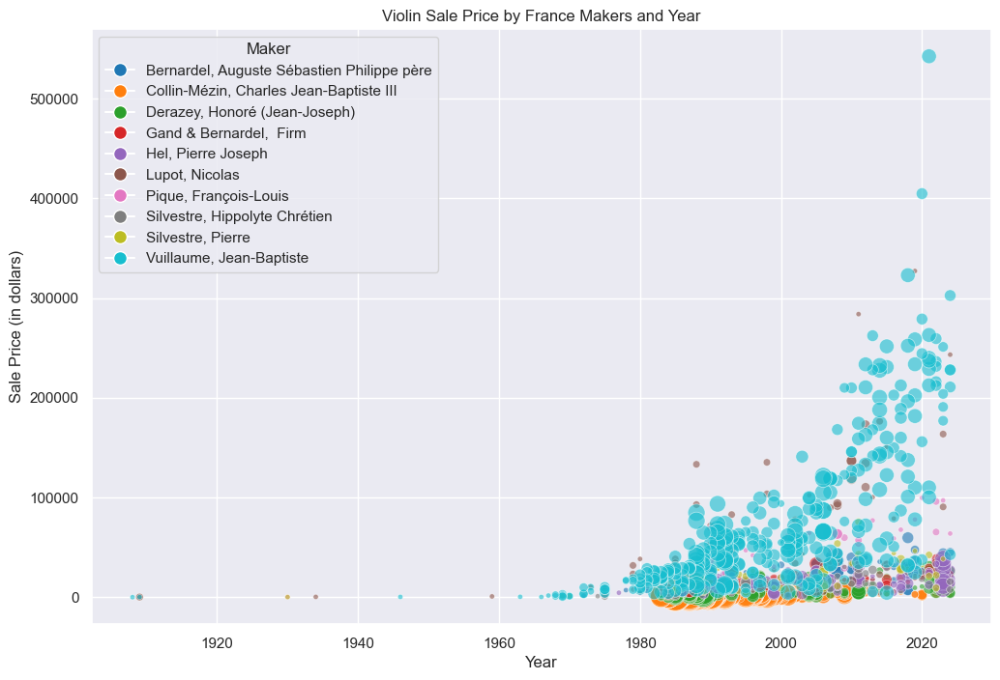

In [640]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_vlns_maker10_byCountry(df, country, size_factor=15):
    """
    Plot a bubble chart of violin SalePrice vs. Year, with bubble size the number of instruments made by each maker.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the violin data with 'Year', 'SalePrice', 'Maker', and 'Country' columns.
        top10_makers_{france/italy/germany/UK}_df : contains violin data for top 10 makers in a single country
    
    country (str): The country to filter the data by (case-sensitive).
    
    size_factor (int): Factor to scale the bubble size. Default is 15.
    """
    # Filter data by the specified country
    country_df = df[df['Country'].str.lower() == country.lower()].copy()

    # Count the number of instruments by Year and Maker
    instrument_counts = country_df.groupby(['Year', 'Maker']).size().reset_index(name='InstrumentCount')

    # Merge the counts back to the original DataFrame to get the count per row
    country_df = pd.merge(country_df, instrument_counts, on=['Year', 'Maker'], how='left')

    # Set up color mapping by Maker
    makers = country_df['Maker'].unique()
    color_map = {maker: plt.cm.tab20(i / len(makers)) for i, maker in enumerate(makers)}

    # Map colors to each maker in the DataFrame
    country_df['Color'] = country_df['Maker'].map(color_map)

    # Create the bubble plot
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(
        country_df['Year'],
        country_df['SalePrice'],
        s=country_df['InstrumentCount'] * size_factor,  # Adjust the size scaling as needed
        c=country_df['Color'],
        alpha=0.6,
        edgecolors="w",
        linewidth=0.5
    )

    # Add legend for makers
    handles = [plt.Line2D([0], [0], marker='o', color='w', label=maker, markersize=10, 
                markerfacecolor=color_map[maker]) for maker in makers]
    plt.legend(handles=handles, title="Maker")

    # Label axes and show plot
    plt.xlabel('Year')
    plt.ylabel('Sale Price (in dollars)')
    plt.title(f'Violin Sale Price by {country.title()} Makers and Year')
#    plt.yscale('log')  # Optionally set the y-axis to a logarithmic scale if needed
    plt.show()

plot_vlns_maker10_byCountry(top10_makers_France_df, 'France')

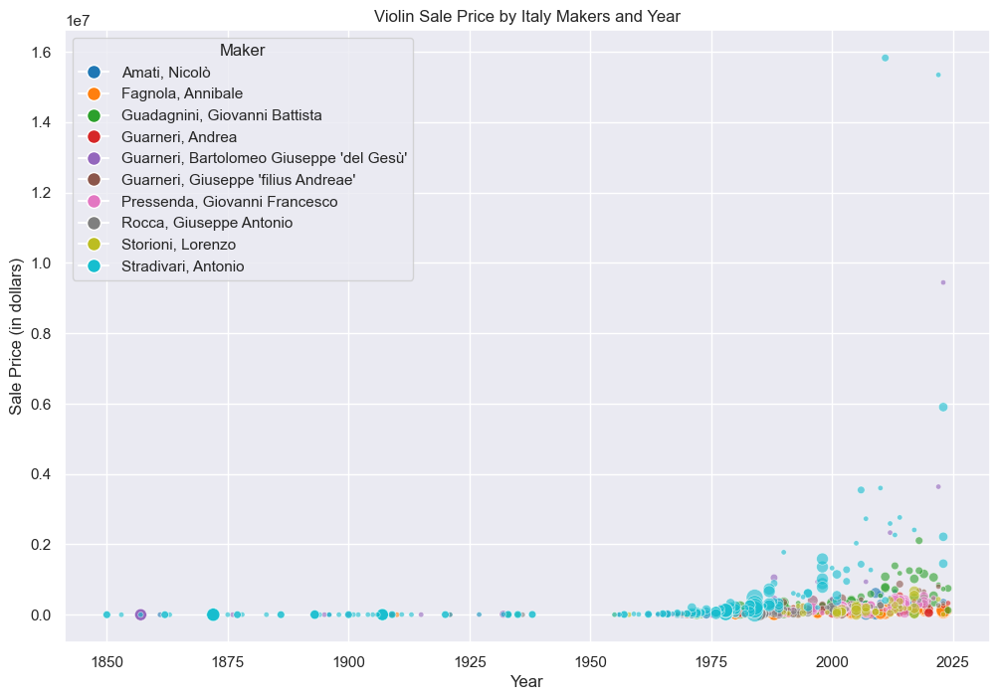

In [638]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_vlns_maker10_byCountry(df, country, size_factor=15):
    """
    Plot a bubble chart of violin SalePrice vs. Year, with bubble size the number of instruments made by each maker.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the violin data with 'Year', 'SalePrice', 'Maker', and 'Country' columns.
        top10_makers_{france/italy/germany/UK}_df : contains violin data for top 10 makers in a single country
    
    country (str): The country to filter the data by (case-sensitive).
    
    size_factor (int): Factor to scale the bubble size. Default is 15.
    """
    # Filter data by the specified country
    country_df = df[df['Country'].str.lower() == country.lower()].copy()

    # Count the number of instruments by Year and Maker
    instrument_counts = country_df.groupby(['Year', 'Maker']).size().reset_index(name='InstrumentCount')

    # Merge the counts back to the original DataFrame to get the count per row
    country_df = pd.merge(country_df, instrument_counts, on=['Year', 'Maker'], how='left')

    # Set up color mapping by Maker
    makers = country_df['Maker'].unique()
    color_map = {maker: plt.cm.tab20(i / len(makers)) for i, maker in enumerate(makers)}

    # Map colors to each maker in the DataFrame
    country_df['Color'] = country_df['Maker'].map(color_map)

    # Create the bubble plot
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(
        country_df['Year'],
        country_df['SalePrice'],
        s=country_df['InstrumentCount'] * size_factor,  # Adjust the size scaling as needed
        c=country_df['Color'],
        alpha=0.6,
        edgecolors="w",
        linewidth=0.5
    )

    # Add legend for makers
    handles = [plt.Line2D([0], [0], marker='o', color='w', label=maker, markersize=10, 
                markerfacecolor=color_map[maker]) for maker in makers]
    plt.legend(handles=handles, title="Maker")

    # Label axes and show plot
    plt.xlabel('Year')
    plt.ylabel('Sale Price (in dollars)')
    plt.title(f'Violin Sale Price by {country.title()} Makers and Year')
#    plt.yscale('log')  # Optionally set the y-axis to a logarithmic scale if needed
    plt.show()

plot_vlns_maker10_byCountry(top10_makers_Italy_df, 'Italy')

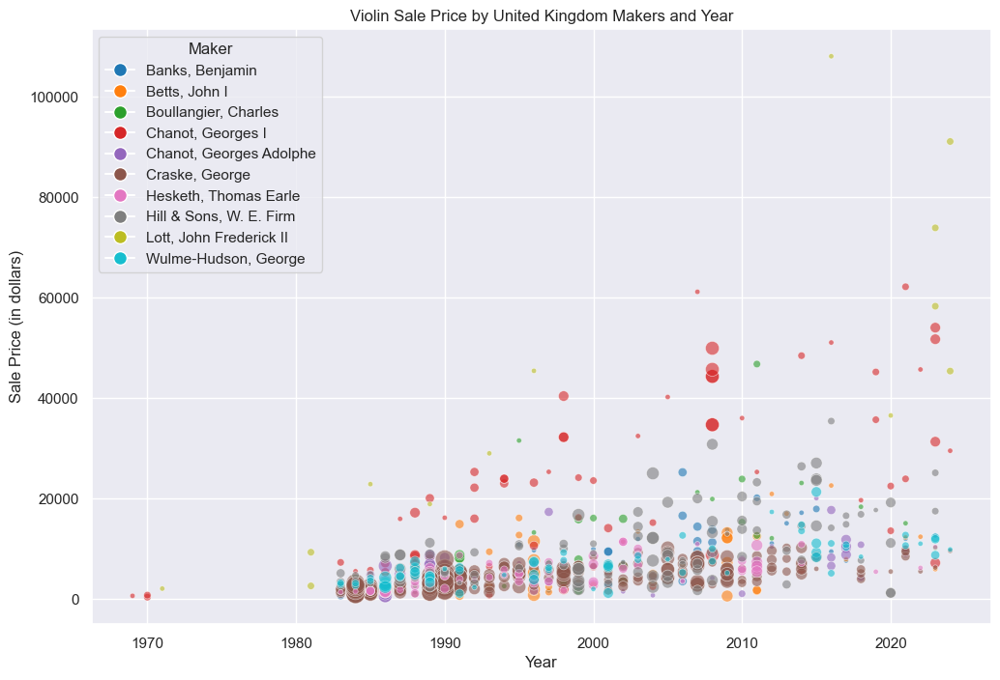

In [642]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_vlns_maker10_byCountry(df, country, size_factor=15):
    """
    Plot a bubble chart of violin SalePrice vs. Year, with bubble size the number of instruments made by each maker.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the violin data with 'Year', 'SalePrice', 'Maker', and 'Country' columns.
        top10_makers_{france/italy/germany/UK}_df : contains violin data for top 10 makers in a single country
    
    country (str): The country to filter the data by (case-sensitive).
    
    size_factor (int): Factor to scale the bubble size. Default is 15.
    """
    # Filter data by the specified country
    country_df = df[df['Country'].str.lower() == country.lower()].copy()

    # Count the number of instruments by Year and Maker
    instrument_counts = country_df.groupby(['Year', 'Maker']).size().reset_index(name='InstrumentCount')

    # Merge the counts back to the original DataFrame to get the count per row
    country_df = pd.merge(country_df, instrument_counts, on=['Year', 'Maker'], how='left')

    # Set up color mapping by Maker
    makers = country_df['Maker'].unique()
    color_map = {maker: plt.cm.tab20(i / len(makers)) for i, maker in enumerate(makers)}

    # Map colors to each maker in the DataFrame
    country_df['Color'] = country_df['Maker'].map(color_map)

    # Create the bubble plot
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(
        country_df['Year'],
        country_df['SalePrice'],
        s=country_df['InstrumentCount'] * size_factor,  # Adjust the size scaling as needed
        c=country_df['Color'],
        alpha=0.6,
        edgecolors="w",
        linewidth=0.5
    )

    # Add legend for makers
    handles = [plt.Line2D([0], [0], marker='o', color='w', label=maker, markersize=10, 
                markerfacecolor=color_map[maker]) for maker in makers]
    plt.legend(handles=handles, title="Maker")

    # Label axes and show plot
    plt.xlabel('Year')
    plt.ylabel('Sale Price (in dollars)')
    plt.title(f'Violin Sale Price by {country.title()} Makers and Year')
#    plt.yscale('log')  # Optionally set the y-axis to a logarithmic scale if needed
    plt.show()

plot_vlns_maker10_byCountry(top10_makers_UK_df, 'United Kingdom')

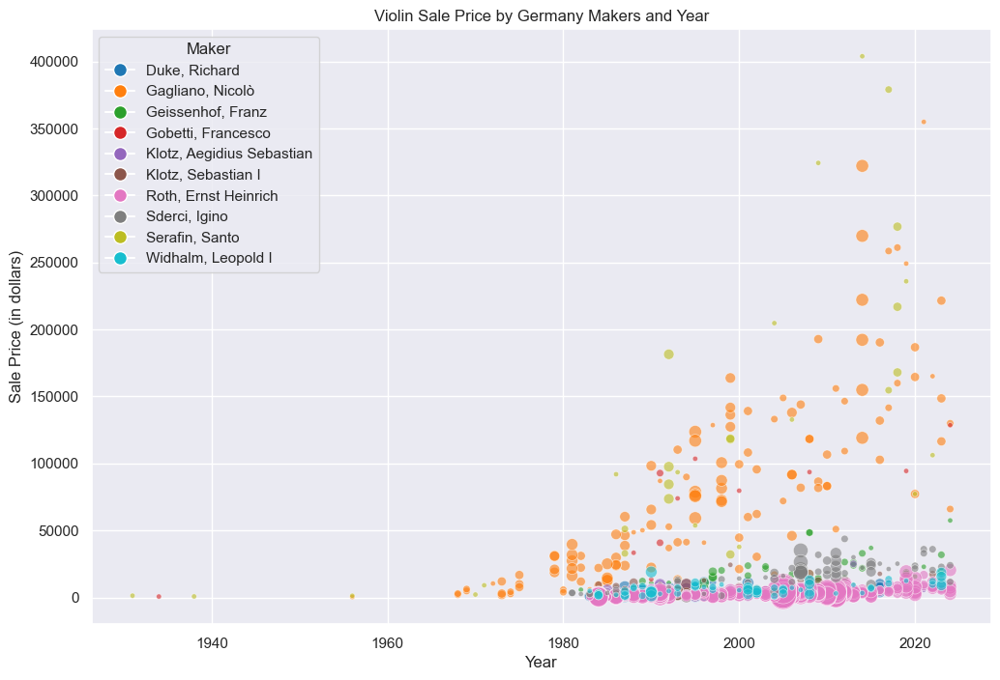

In [647]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_vlns_maker10_byCountry(df, country, size_factor=15):
    """
    Plot a bubble chart of violin SalePrice vs. Year, with bubble size the number of instruments made by each maker.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the violin data with 'Year', 'SalePrice', 'Maker', and 'Country' columns.
        top10_makers_{france/italy/germany/UK}_df : contains violin data for top 10 makers in a single country
    
    country (str): The country to filter the data by (case-sensitive).
    
    size_factor (int): Factor to scale the bubble size. Default is 15.
    """
    # Filter data by the specified country
    country_df = df[df['Country'].str.lower() == country.lower()].copy()

    # Count the number of instruments by Year and Maker
    instrument_counts = country_df.groupby(['Year', 'Maker']).size().reset_index(name='InstrumentCount')

    # Merge the counts back to the original DataFrame to get the count per row
    country_df = pd.merge(country_df, instrument_counts, on=['Year', 'Maker'], how='left')

    # Set up color mapping by Maker
    makers = country_df['Maker'].unique()
    color_map = {maker: plt.cm.tab20(i / len(makers)) for i, maker in enumerate(makers)}

    # Map colors to each maker in the DataFrame
    country_df['Color'] = country_df['Maker'].map(color_map)

    # Create the bubble plot
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(
        country_df['Year'],
        country_df['SalePrice'],
        s=country_df['InstrumentCount'] * size_factor,  # Adjust the size scaling as needed
        c=country_df['Color'],
        alpha=0.6,
        edgecolors="w",
        linewidth=0.5
    )

    # Add legend for makers
    handles = [plt.Line2D([0], [0], marker='o', color='w', label=maker, markersize=10, 
                markerfacecolor=color_map[maker]) for maker in makers]
    plt.legend(handles=handles, title="Maker")

    # Label axes and show plot
    plt.xlabel('Year')
    plt.ylabel('Sale Price (in dollars)')
    plt.title(f'Violin Sale Price by {country.title()} Makers and Year')
    #plt.yscale('log')  # Optionally set the y-axis to a logarithmic scale if needed
    plt.show()

plot_vlns_maker10_byCountry(top10_makers_Germany_df, 'Germany')

### Visualize with Plotly

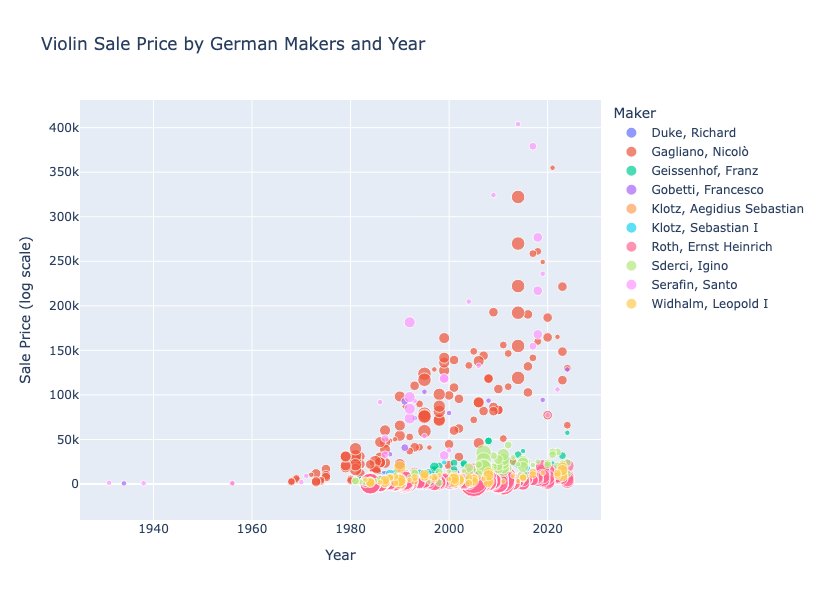

In [535]:
import plotly.express as px
import pandas as pd

def vlns_maker10_bubble_chart(df, country, country_label, size_factor=1):
    """
    Create a static bubble chart of violin SalePrice vs. Year for the top 10 makers in a specified country, 
        with bubble size by the number of instruments.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the violin data with 'Year', 'SalePrice', 'Maker', and 'Country' columns.
        Ex: top10_makers_{Italy/France/Germany/UK}_df
    country (str): The country to filter the data by (case-sensitive).
    country_label (str): The label for the country in the title (e.g., 'French' or 'Italian').
    size_factor (int): Factor to scale the bubble size. Default is 1.
    """
    # Filter data by the specified country
    country_df = df[df['Country'].str.lower() == country.lower()].copy()

    # Ensure 'InstrumentCount' column exists (or calculate it if needed)
    instrument_counts = country_df.groupby(['Year', 'Maker']).size().reset_index(name='InstrumentCount')
    country_df = pd.merge(country_df, instrument_counts, on=['Year', 'Maker'], how='left')

    # Create the static bubble chart
    fig = px.scatter(
        country_df,
        x='Year',
        y='SalePrice',
        size='InstrumentCount',  # Bubble size
        color='Maker',           # Bubble color
        hover_name='Maker',      # Hover info to show maker
        log_y=True,              # Log scale for SalePrice if needed
        title=f'Violin Sale Price by {country_label} Makers and Year',
        labels={'Year': 'Year', 'SalePrice': 'Sale Price (log scale)'}
    )

    # Customize the layout if needed
    fig.update_layout(
        width=1000,
        height=600,
        xaxis=dict(title='Year'),
        yaxis=dict(title='Sale Price (log scale)')
    )

    # Show the plot
    fig.show()

# vlns_maker10_bubble_chart(top10_makers_France_df, 'France', 'French')
# vlns_maker10_bubble_chart(top10_makers_Italy_df, 'Italy', 'Italian')
# vlns_maker10_bubble_chart(top10_makers_UK_df, 'United Kingdom', 'UK')
vlns_maker10_bubble_chart(top10_makers_Germany_df, 'Germany', 'German')

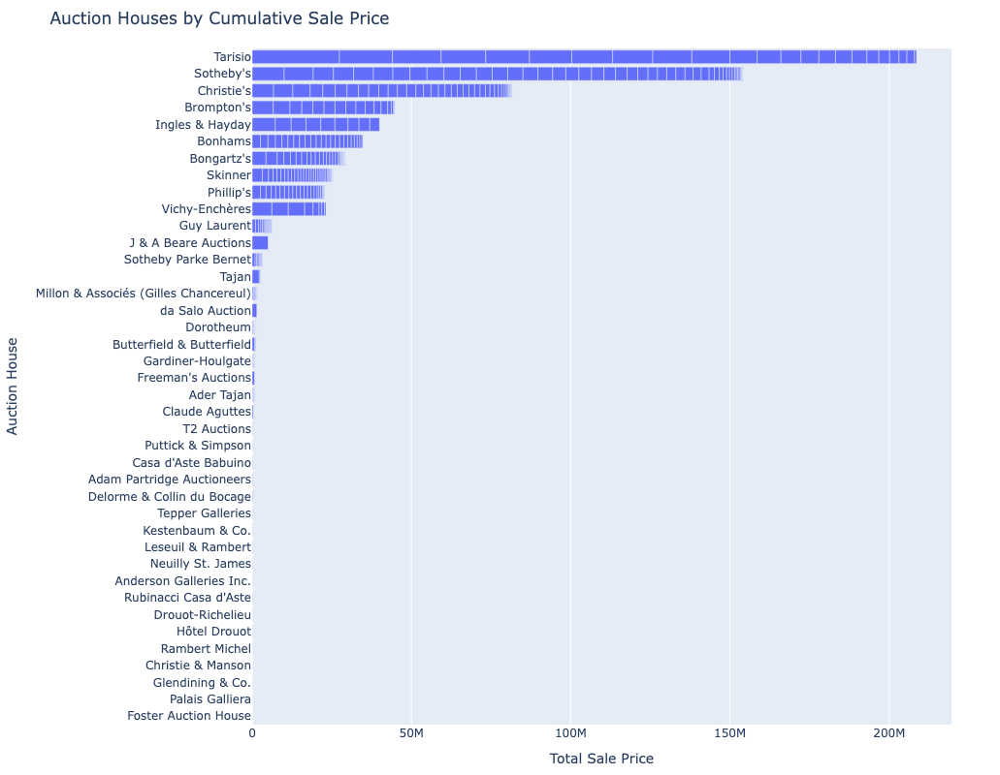

In [795]:
# Create a horizontal bar chart

# Import libraries
import numpy as np
import matplotlib.pyplot as plt

# Data to plot
AucHouse_sum = Tarisio.groupby(['AuctionHouse', 'Year'])['SalePrice'].sum()
AucHouse_sum = AucHouse_sum.sort_values(ascending=False)
AucHouse_sum = pd.DataFrame(AucHouse_sum).reset_index()
df = AucHouse_sum

# Create horizontal bar chart using Plotly
fig = px.bar(
    df,
    x="SalePrice",       # SalePrice on the x-axis
    y="AuctionHouse",    # AuctionHouse on the y-axis
    orientation='h',     # Horizontal orientation
    title="Auction Houses by Cumulative Sale Price",
    labels={"SalePrice": "Total Sale Price", "AuctionHouse": "Auction House"},
    hover_data={
        "SalePrice": True,  # Show SalePrice on hover
        "Year": True        # Show Year on hover
    }
)

# Update layout to make it visually appealing
fig.update_layout(
    height=800,  # Adjust the height for better readability
    xaxis=dict(title="Total Sale Price"),
    yaxis=dict(title="Auction House", categoryorder="total ascending"),  # Sort by ascending SalePrice
    margin=dict(l=150, r=50, t=50, b=50)  # Adjust margins for better layout
)

# Show the chart
fig.show()

In [799]:
# First dates when the auction house appears in the dataset
AucHouse_mindate = Tarisio.groupby('AuctionHouse')['Year'].min()
AucHouse_mindate.sort_values()

AuctionHouse
Sotheby's                                1829
Puttick & Simpson                        1850
Christie & Manson                        1857
Hôtel Drouot                             1872
Christie's                               1872
Foster Auction House                     1876
Glendining & Co.                         1906
Anderson Galleries Inc.                  1932
Palais Galliera                          1963
Phillip's                                1971
Tepper Galleries                         1976
Sotheby Parke Bernet                     1976
Bongartz's                               1978
Ader Tajan                               1987
Skinner                                  1987
Millon & Associés (Gilles Chancereul)    1989
Bonhams                                  1992
Guy Laurent                              1994
Drouot-Richelieu                         1994
Leseuil & Rambert                        1995
Tajan                                    1995
Claude Aguttes       

In [801]:
# Last dates when the auction house appears in the dataset
AucHouse_maxdate = Tarisio.groupby('AuctionHouse')['Year'].max()
AucHouse_maxdate.sort_values()

AuctionHouse
Christie & Manson                        1857
Foster Auction House                     1876
Hôtel Drouot                             1908
Glendining & Co.                         1909
Anderson Galleries Inc.                  1932
Palais Galliera                          1963
Puttick & Simpson                        1971
Tepper Galleries                         1977
Sotheby Parke Bernet                     1985
Ader Tajan                               1993
Drouot-Richelieu                         1994
Leseuil & Rambert                        1995
Neuilly St. James                        1996
Butterfield & Butterfield                1999
Rambert Michel                           2000
Phillip's                                2001
Claude Aguttes                           2003
da Salo Auction                          2005
Casa d'Aste Babuino                      2008
Rubinacci Casa d'Aste                    2008
Gardiner-Houlgate                        2008
Bongartz's           

In [803]:
# Add date ranges to hover 
AucHouse_sum

,AuctionHouse,Year,SalePrice
0,Tarisio,2011,27403725
1,Tarisio,2013,16658828
2,Tarisio,2018,15288676
3,Tarisio,2019,13983685
4,Tarisio,2012,13740318
...,...,...,...
438,Hôtel Drouot,1908,235
439,Puttick & Simpson,1885,219
440,Glendining & Co.,1908,176
441,Puttick & Simpson,1908,143


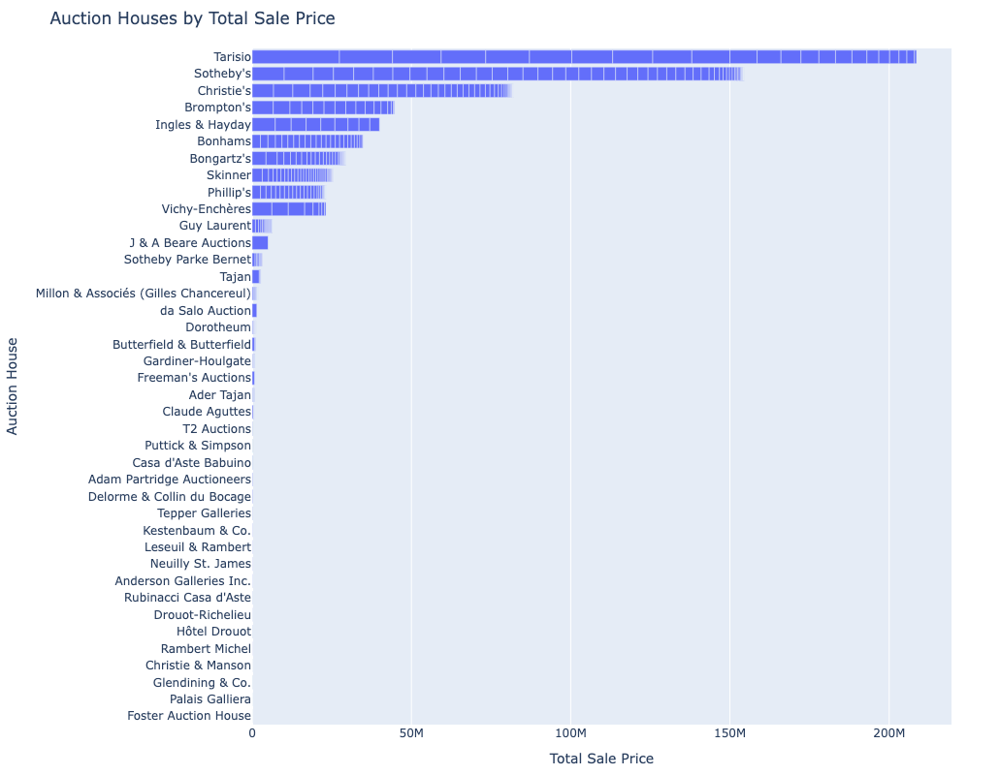

In [813]:
import plotly.express as px
import pandas as pd

# Data to plot
AucHouse_sum = Tarisio.groupby(['AuctionHouse', 'Year'])['SalePrice'].sum()
AucHouse_sum = AucHouse_sum.sort_values(ascending=False)
AucHouse_sum = pd.DataFrame(AucHouse_sum).reset_index()
df = AucHouse_sum

# Compute Aucmin and Aucmax
Aucmin = Tarisio.groupby('AuctionHouse')['Year'].min()
Aucmax = Tarisio.groupby('AuctionHouse')['Year'].max()

# Merge Aucmin and Aucmax into a date range string
date_range = (Aucmin.astype(str) + " to " + Aucmax.astype(str)).reset_index()
date_range.columns = ['AuctionHouse', 'DateRange']

# Merge the date range back into the original DataFrame
df = df.merge(date_range, on='AuctionHouse')

# Create horizontal bar chart using Plotly
fig = px.bar(
    df,
    x="SalePrice",       # SalePrice on the x-axis
    y="AuctionHouse",    # AuctionHouse on the y-axis
    orientation='h',     # Horizontal orientation
    title="Auction Houses by Total Sale Price",
    labels={"SalePrice": "Total Sale Price", "AuctionHouse": "Auction House"},
    hover_data={
        "SalePrice": True,    # Show SalePrice on hover
        "DateRange": True     # Add the date range to hover text
    }
)

# Update layout to make it visually appealing
fig.update_layout(
    height=800,  # Adjust the height for better readability
    xaxis=dict(title="Total Sale Price"),
    yaxis=dict(title="Auction House", categoryorder="total ascending"),  # Sort by ascending SalePrice
    margin=dict(l=150, r=50, t=50, b=50)  # Adjust margins for better layout
)

# Show the chart
fig.show()

# Map

In [667]:
Tarisio.head()

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country,Year
0,Violin,2010-02-20,4200,Tarisio,Wallgau,2919,"Achner, Michael",Mittenwald,Germany,2010
1,Violin,1987-04-27,2838,Bongartz's,Mittenwald,2919,"Achner, Michael",Mittenwald,Germany,1987
2,Violin,2018-05-17,24000,Tarisio,Mittenwald,2611,"Achner, Philip",Mittenwald,Germany,2018
3,Violin,2008-11-15,3884,Bongartz's,NaN,2611,"Achner, Philip",Mittenwald,Germany,2008
4,Violin,1990-03-27,2146,Sotheby's,Mittenwald,2611,"Achner, Philip",Mittenwald,Germany,1990


In [671]:
Tarisio_map = Tarisio[['Instrument', 'Year', 'SalePrice', 'AuctionHouse','AuctionCity']]
Tarisio_map

,Instrument,Year,SalePrice,AuctionHouse,AuctionCity
0,Violin,2010,4200,Tarisio,Wallgau
1,Violin,1987,2838,Bongartz's,Mittenwald
2,Violin,2018,24000,Tarisio,Mittenwald
3,Violin,2008,3884,Bongartz's,NaN
4,Violin,1990,2146,Sotheby's,Mittenwald
...,...,...,...,...,...
55278,Violin,2012,108000,Tarisio,"Brooklyn, NY"
55279,Violin,2009,15634,Brompton's,NaN
55280,Violin,2009,15634,Brompton's,NaN
55281,Violin,2003,130000,Tarisio,"Brooklyn, NY"


In [679]:
conda install geopandas

Retrieving notices: ...working... done
Channels:
 - defaults
Platform: osx-arm64
Solving environment: done

## Package Plan ##

  environment location: /opt/anaconda3

  added / updated specs:
    - geopandas


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    branca-0.6.0               |  py311hca03da5_0          52 KB
    cairo-1.16.0               |       h302bd0f_5         1.0 MB
    click-plugins-1.1.1        |     pyhd3eb1b0_0          10 KB
    cligj-0.7.2                |     pyhd3eb1b0_0          11 KB
    conda-24.11.0              |  py311hca03da5_0         1.2 MB
    expat-2.6.3                |       h313beb8_0         154 KB
    fiona-1.9.5                |  py311h7aedaa7_0         927 KB
    folium-0.14.0              |  py311hca03da5_0         130 KB
    fontconfig-2.14.1          |       hee714a5_2         254 KB
    freexl-2.0.0               |       ha3de405_0          5

In [689]:
pip install geopy

Note: you may need to restart the kernel to use updated packages.


In [705]:
# # Initialize a cache dictionary
# geo_cache = {}

# def geocode_city_cached(city):
#     if city in geo_cache:  # Check if already geocoded
#         return geo_cache[city]
#     try:
#         if pd.notna(city):
#             location = geolocator.geocode(city)
#             if location:
#                 geo_cache[city] = (location.latitude, location.longitude)
#                 return geo_cache[city]
#     except GeocoderTimedOut:
#         return None, None
#     geo_cache[city] = (None, None)
#     return geo_cache[city]

# # Apply geocoding with caching
# agg_df[['Latitude', 'Longitude']] = agg_df['AuctionCity'].apply(lambda x: pd.Series(geocode_city_cached(x)))

# # Save the cache for future use
# import pickle
# with open('geo_cache.pkl', 'wb') as f:
#     pickle.dump(geo_cache, f)

In [ ]:
import pandas as pd
import plotly.express as px
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut

In [827]:
# Data to map
df = Tarisio[['Instrument', 'Year', 'SalePrice', 'AuctionHouse','AuctionCity']]

# Get unique cities
unique_cities = df['AuctionCity'].dropna().unique()

# Geocode only unique cities
city_coords = {}
for city in unique_cities:
    city_coords[city] = geocode_city(city)

# Create a DataFrame for the geocoded results
coords_df = pd.DataFrame.from_dict(city_coords, orient='index', columns=['Latitude', 'Longitude'])

# Merge geocoded data back into the main dataframe
agg_df = agg_df.merge(coords_df, left_on='AuctionCity', right_index=True, how='left')
agg_df

GeocoderUnavailable: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Bonn&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))

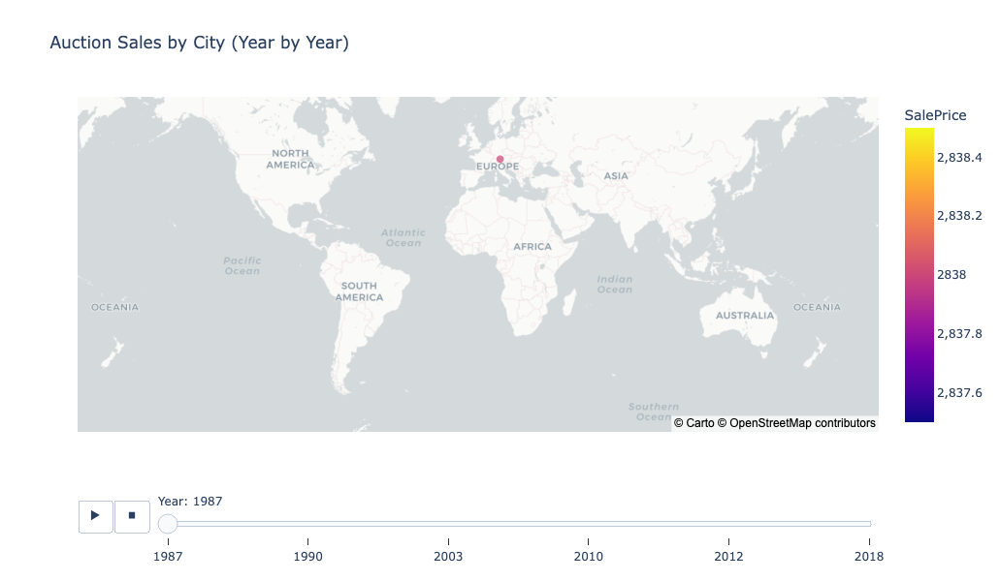

In [831]:
import pandas as pd
import plotly.express as px
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut

# import os
# import json

# def load_cache(cache_file):
#     if os.path.exists(cache_file):
#         with open(cache_file, 'r') as f:
#             return json.load(f)
#     return {}

# def save_cache(cache_file, cache_data):
#     with open(cache_file, 'w') as f:
#         json.dump(cache_data, f)

# cache_file = 'geocode_cache.json'
# city_coords = load_cache(cache_file)

# for city in unique_cities:
#     if city not in city_coords:
#         city_coords[city] = geocode_city(city)
#         save_cache(cache_file, city_coords)  # Save after each new geocode

# Geocode AuctionCity to get latitude and longitude
def geocode_city(city):
    geolocator = Nominatim(user_agent="auction_map")
    try:
        if pd.notna(city):
            location = geolocator.geocode(city)
            if location:
                return location.latitude, location.longitude
    except GeocoderTimedOut:
        return None, None
    return None, None

# Create the animated scatter map
fig = px.scatter_mapbox(
    agg_df,
    lat="Latitude",
    lon="Longitude",
    hover_name="AuctionCity",
    hover_data={
        "AuctionHouse": True,
        "SalePrice": True
    },
    color="SalePrice",
    size="SalePrice",
    size_max=50,
    animation_frame="Year",  # This creates the slider for years
    title="Auction Sales by City (Year by Year)",
    mapbox_style="carto-positron",
    zoom=4
)

fig.update_layout(
    mapbox=dict(
        style="carto-positron",  # Keep the map style
        zoom=0.5,  # Global view to include all continents
        center=dict(lat=0, lon=0)  # Center at the geographical center of the globe
    ),
    sliders=[{
        "currentvalue": {"prefix": "Year: "}
    }],
    width=1000,  # Set the width of the figure
    height=600   # Set the height of the figure
)

fig.show()

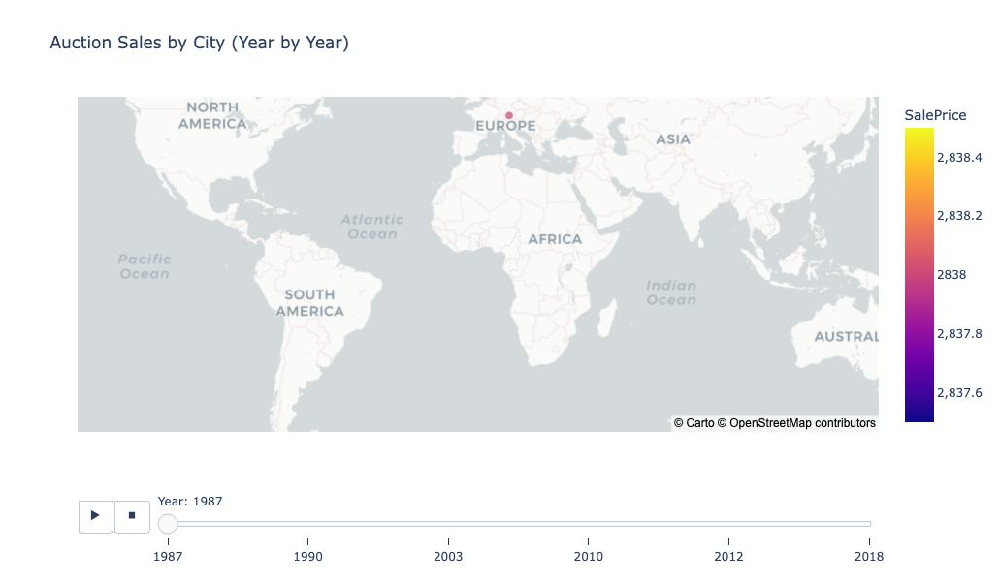

In [833]:
# Change scaling for very small sale price values, to allow for interaction


# Geocode AuctionCity to get latitude and longitude
geolocator = Nominatim(user_agent="auction_map")
def geocode_city(city):
    try:
        if pd.notna(city):
            location = geolocator.geocode(city)
            if location:
                return location.latitude, location.longitude
    except GeocoderTimedOut:
        return None, None
    return None, None

import numpy as np

import numpy as np

# Apply conditional scaling for BubbleSize
agg_df['BubbleSize'] = agg_df.apply(
    lambda row: np.log10(max(row['SalePrice'], 1)) if row['Year'] < 1967 else row['SalePrice'], axis=1
)

# Optionally scale BubbleSize for post-1967 values to ensure consistency
agg_df['BubbleSize'] = agg_df['BubbleSize'] / agg_df['BubbleSize'].max() * 50

# Create the animated scatter map
fig = px.scatter_mapbox(
    agg_df,
    lat="Latitude",
    lon="Longitude",
    hover_name="AuctionCity",
    hover_data={
        "AuctionHouse": True,
        "SalePrice": True
    },
    color="SalePrice",
    size="BubbleSize",  # Use the conditionally scaled bubble size
    size_max=50,  # Set the maximum bubble size
    title="Auction Sales by City (Year by Year)",
    animation_frame="Year",  # Creates the slider for years
    mapbox_style="carto-positron",
    zoom=1,  # Global view
    center=dict(lat=0, lon=0)
)

# Update layout settings (e.g., size and zoom adjustments)
fig.update_layout(
    sliders=[{
        "currentvalue": {"prefix": "Year: "}
    }],
    width=1000,  # Set the width of the figure
    height=600   # Set the height of the figure
)

fig.show()

In [626]:
Sartory_df = Tarisio[Tarisio['Maker'].str.contains('Sartory')]
Sartory_df['City'].unique()

array(['Brussels'], dtype=object)

In [545]:
Bailly_df = Tarisio[Tarisio['Maker'].str.contains('Bailly, Paul')]
Bailly_df['City'].unique()

array(['Brussels'], dtype=object)

In [569]:
StradA_df = Tarisio[Tarisio['Maker'].str.contains('Stradivari, Antonio')]
StradA_df

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country,Year
46375,Violin,2023-06-09,5900000,NaN,Cremona,722,"Stradivari, Antonio",Cremona,Italy,2023
46376,Violin,2023-03-28,2215565,NaN,Cremona,722,"Stradivari, Antonio",Cremona,Italy,2023
46377,Violin,2023-03-28,1452426,NaN,Cremona,722,"Stradivari, Antonio",Cremona,Italy,2023
46378,Viola,2022-11-01,2889958,NaN,Cremona,722,"Stradivari, Antonio",Cremona,Italy,2022
46379,Violin,2022-06-10,15340000,NaN,Cremona,722,"Stradivari, Antonio",Cremona,Italy,2022
...,...,...,...,...,...,...,...,...,...,...
46561,Cello,1857-02-18,633,Christie & Manson,NaN,722,"Stradivari, Antonio",Cremona,Italy,1857
46562,Violin,1857-02-18,973,Christie & Manson,NaN,722,"Stradivari, Antonio",Cremona,Italy,1857
46563,Violin,1853-05-28,606,Puttick & Simpson,NaN,722,"Stradivari, Antonio",Cremona,Italy,1853
46564,Violin,1850-11-28,588,Puttick & Simpson,NaN,722,"Stradivari, Antonio",Cremona,Italy,1850


In [547]:
Bailly_df

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country,Year
1503,Violin,2024-10-08,7907,NaN,Mirecourt,30,"Bailly, Paul",Brussels,Belgium,2024
1504,Violin,2024-06-06,15629,NaN,Paris,30,"Bailly, Paul",Brussels,Belgium,2024
1505,Violin,2024-06-06,14949,NaN,Mirecourt,30,"Bailly, Paul",Brussels,Belgium,2024
1506,Violin,2024-03-22,15127,NaN,Paris,30,"Bailly, Paul",Brussels,Belgium,2024
1507,Violin,2024-02-27,20813,NaN,Paris,30,"Bailly, Paul",Brussels,Belgium,2024
...,...,...,...,...,...,...,...,...,...,...
1686,Cello,1984-04-04,17018,Christie's,Paris,30,"Bailly, Paul",Brussels,Belgium,1984
1687,Violin,1984-01-18,2750,Sotheby Parke Bernet,Paris,30,"Bailly, Paul",Brussels,Belgium,1984
1688,Violin,1983-06-23,3729,Sotheby's,Paris,30,"Bailly, Paul",Brussels,Belgium,1983
1689,Violin,1983-06-23,2627,Sotheby's,Paris,30,"Bailly, Paul",Brussels,Belgium,1983


In [581]:
Bailly_df['City'].unique()

array(['Brussels'], dtype=object)

In [559]:
City = list(filter(lambda x: str(x) != 'nan', City))
City

['Mittenwald',
 'Mirecourt',
 'London',
 'Copenhagen',
 'Manchester',
 'Markneukirchen',
 'Amsterdam',
 'Brussels',
 'Gubbio',
 'Pavia',
 'Bologna',
 'Bolzano',
 'Freiburg',
 'New York, NY',
 'Milan',
 'Krems',
 'Nantes',
 'Birmingham',
 'Philadelphia, PA',
 'Ann Arbor, MI',
 'Munich',
 'Barnstaple',
 'Madrid',
 'Naples',
 'Frankfurt',
 'Gerona',
 'Augsburg',
 'Cremona',
 'Liège',
 'Edinburgh',
 'St. Ignatius, MT',
 'Lugano',
 'Paris',
 'Vienna',
 'Grand Rapids, MI',
 'Salerno',
 'Mantua',
 'Colle',
 'Miramont-De-Comminges',
 'Arezzo',
 'Como',
 'Cheshire',
 'Boscawen, NH',
 'Florence',
 'Newark, NJ',
 'Kansas City, MO',
 'Tottenham',
 'Troyes',
 'Le Havre',
 'Rome',
 'Palermo',
 'Caltanisetta',
 'San Diego, CA',
 'Madison, WI',
 'Turin',
 'Berlin',
 'Krakow',
 'Pisa',
 'Padua',
 'Dubuque. IA',
 'Boston, MA',
 'Oxford',
 'Budapest',
 'Perugia',
 'Ancona',
 'Buenos Aires',
 'Balham',
 'Springfield, MA',
 'Leeds',
 'Chur',
 'Ravenna',
 'Liverpool',
 'Reggio Emilia',
 'Dijon',
 'Avallon',

In [553]:
City = Tarisio['City'].unique().tolist()
City

['Mittenwald',
 'Mirecourt',
 'London',
 'Copenhagen',
 'Manchester',
 'Markneukirchen',
 'Amsterdam',
 'Brussels',
 'Gubbio',
 'Pavia',
 'Bologna',
 'Bolzano',
 'Freiburg',
 'New York, NY',
 'Milan',
 'Krems',
 nan,
 'Nantes',
 'Birmingham',
 'Philadelphia, PA',
 'Ann Arbor, MI',
 'Munich',
 'Barnstaple',
 'Madrid',
 'Naples',
 'Frankfurt',
 'Gerona',
 'Augsburg',
 'Cremona',
 'Liège',
 'Edinburgh',
 'St. Ignatius, MT',
 'Lugano',
 'Paris',
 'Vienna',
 'Grand Rapids, MI',
 'Salerno',
 'Mantua',
 'Colle',
 'Miramont-De-Comminges',
 'Arezzo',
 'Como',
 'Cheshire',
 'Boscawen, NH',
 'Florence',
 'Newark, NJ',
 'Kansas City, MO',
 'Tottenham',
 'Troyes',
 'Le Havre',
 'Rome',
 'Palermo',
 'Caltanisetta',
 'San Diego, CA',
 'Madison, WI',
 'Turin',
 'Berlin',
 'Krakow',
 'Pisa',
 'Padua',
 'Dubuque. IA',
 'Boston, MA',
 'Oxford',
 'Budapest',
 'Perugia',
 'Ancona',
 'Buenos Aires',
 'Balham',
 'Springfield, MA',
 'Leeds',
 'Chur',
 'Ravenna',
 'Liverpool',
 'Reggio Emilia',
 'Dijon',
 'Ava

In [557]:
type(City)

list

In [561]:
sorted(City)

['Aachen',
 'Aalborg',
 'Abano Terme',
 'Aberdeen',
 'Aberdeenshire',
 'Abington, MA',
 'Absam',
 'Adderbury',
 'Adorf',
 'Agram-Zagreb',
 'Ailstone',
 'Aix-la-Chapelle',
 'Alassio',
 'Alba',
 'Albany, NY',
 'Albuquerque, NM',
 'Alessandria',
 'Alexandria',
 'Algiers',
 'Allenton, RI',
 'Amberg',
 'Amiens',
 'Amsterdam',
 'Ancarano',
 'Ancenis',
 'Ancona',
 'Angers',
 'Ann Arbor, MI',
 'Ansbach',
 'Anta-Espinho',
 'Antwerp',
 'Apeldoorn',
 'Appignano',
 'Aquila',
 'Arad',
 'Arezzo',
 'Ariccia',
 'Arqua Polesine',
 'Ascoli Piceno',
 'Ashburnham, MA',
 'Ashland, OH',
 'Astoria, NY',
 'Athens, OH',
 'Atlanta, GA',
 'Auburn, ME',
 'Augsburg',
 'Avallon',
 'Avignon',
 'Bad Brambach',
 'Bad Saulgau',
 'Bagnacavallo',
 'Balham',
 'Baltimore, MD',
 'Bamberg',
 'Barcelona',
 'Barga',
 'Barnstaple',
 'Barrington, IL',
 'Barrow-in-Furness',
 'Basel',
 'Batavia, NY',
 'Bath',
 'Battle Creek, MI',
 'Bautzen',
 'Bedford',
 'Beijing',
 'Belfast',
 'Belgrade',
 'Belluno',
 'Belmonte',
 'Benevento',
 '

### Bubble animation

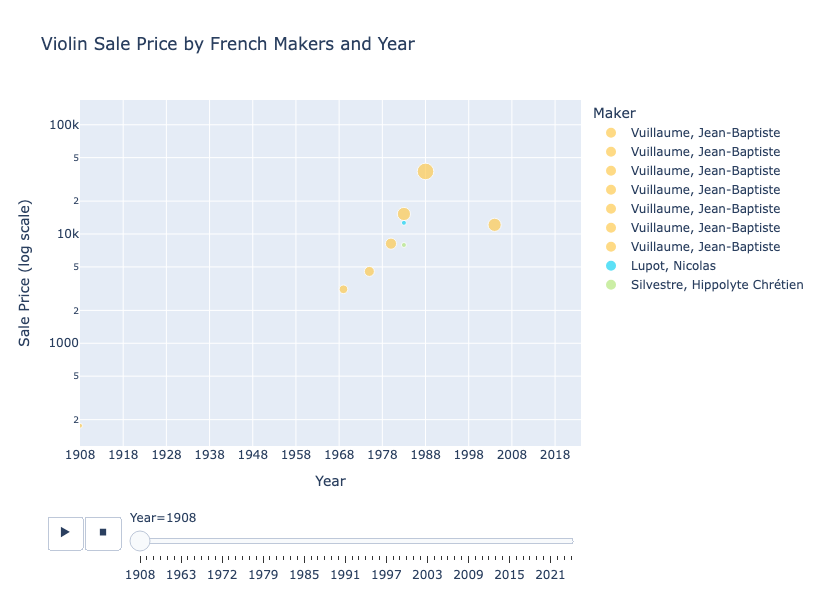

In [714]:
import plotly.express as px
import pandas as pd

def vlns_maker10_animated_bubble_chart(df, country, country_label, size_factor=1):
    """
    Create an animated bubble chart of violin SalePrice vs. Year for the top 10 makers in a specified country, 
    with bubble size by the number of instruments, animated by year.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the violin data with 'Year', 'SalePrice', 'Maker', and 'Country' columns.
        Ex: top10_makers_{Italy/France/Germany/UK}_df
    country (str): The country to filter the data by (case-sensitive).
    country_label (str): The label for the country in the title (e.g., 'French' or 'Italian').
    size_factor (int): Factor to scale the bubble size. Default is 1.
    """
    # Filter data by the specified country
    country_df = df[df['Country'].str.lower() == country.lower()].copy()

    # Ensure 'InstrumentCount' column exists (or calculate it if needed)
    instrument_counts = country_df.groupby(['Year', 'Maker']).size().reset_index(name='InstrumentCount')
    country_df = pd.merge(country_df, instrument_counts, on=['Year', 'Maker'], how='left')

    # Create the animated bubble chart
    fig = px.scatter(
        country_df,
        x='Year',
        y='SalePrice',
        size='InstrumentCount',   # Bubble size
        color='Maker',            # Bubble color
        hover_name='Maker',       # Hover info to show maker
        log_y=True,               # Log scale for SalePrice if needed
        animation_frame='Year',   # Add animation by year
        animation_group='Maker',  # Group animation by maker to show continuity
        title=f'Violin Sale Price by {country_label} Makers and Year',
        labels={'Year': 'Year', 'SalePrice': 'Sale Price (log scale)'}
    )

    # Customize the layout to show all years on the x-axis
    fig.update_layout(
        width=1000,
        height=600,
        xaxis=dict(
            title='Year',
            range=[country_df['Year'].min(), country_df['Year'].max()],  # Set the range to include all years
            tickmode='array',  # Use array mode for specific ticks
            tickvals=[year for year in range(country_df['Year'].min(), country_df['Year'].max() + 1, 10)],  # Decade intervals
            ticktext=[str(year) for year in range(country_df['Year'].min(), country_df['Year'].max() + 1, 10)]  # Labels for decades
        ),
        yaxis=dict(title='Sale Price (log scale)'),
        showlegend=True,
        sliders=[{
            "steps": [
                {
                    "args": [[str(year)], {
                        "frame": {"duration": 500, "redraw": True},
                        "mode": "immediate",
                        "transition": {"duration": 300}
                    }],
                    "label": str(year),
                    "method": "animate"
                } for year in sorted(country_df['Year'].unique())
            ],
            "active": 0,
            "x": 0.1,
            "len": 0.9,
            "xanchor": "left",
            "yanchor": "top"
        }]
    )

    # Show the plot
    fig.show()

# Example usage:
vlns_maker10_animated_bubble_chart(top10_makers_France_df, 'France', 'French')



# Giovanni Battista Guadagnini
maker with multiple city entries (no longer reflected in this Tarisio df. Dropped before the merging
of city_country_df and the makers df. 

In [396]:
Guadagnini_G_Battista = Tarisio[Tarisio['Maker'].str.contains('Guadagnini, Giovanni Battista')]
Guadagnini_G_Battista = Guadagnini_G_Battista.sort_values('SaleDate', ascending=False)
Guadagnini_G_Battista.head(35)

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country
19182,Violin,2024-03-15,750000,NaN,Milan,234,"Guadagnini, Giovanni Battista",Como,Italy
19183,Violin,2024-02-27,127916,NaN,Parma,234,"Guadagnini, Giovanni Battista",Como,Italy
19184,Violin,2023-10-24,732193,NaN,Piacenza,234,"Guadagnini, Giovanni Battista",Como,Italy
19185,Violin,2022-11-01,853226,NaN,Piacenza,234,"Guadagnini, Giovanni Battista",Como,Italy
19186,Cello,2022-10-25,1196134,NaN,Turin,234,"Guadagnini, Giovanni Battista",Como,Italy
19189,Violin,2021-11-19,540000,NaN,Milan,234,"Guadagnini, Giovanni Battista",Como,Italy
19187,Violin,2021-11-02,1062767,NaN,Piacenza,234,"Guadagnini, Giovanni Battista",Como,Italy
19188,Violin,2021-11-02,359706,NaN,Piacenza,234,"Guadagnini, Giovanni Battista",Como,Italy
19190,Violin,2019-10-21,311846,Brompton's,Parma,234,"Guadagnini, Giovanni Battista",Como,Italy
19191,Violin,2019-10-19,451735,Ingles & Hayday,Turin,234,"Guadagnini, Giovanni Battista",Como,Italy


# Violin Bow Sales
[Return to Table of Contents](#Contents)

In [143]:
# Create a smaller dataframe of violin bows
violin_bows = Tarisio.query('Instrument == "Violin Bow"').reset_index().drop(['index'], axis=1)
violin_bows

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country
0,Violin Bow,2005-11-12,3296,Bongartz's,NaN,890,"Acoulon, Alexandre Alfred",Mirecourt,France
1,Violin Bow,1991-09-19,2280,Phillip's,Paris,890,"Acoulon, Alexandre Alfred",Mirecourt,France
2,Violin Bow,1991-03-13,694,Phillip's,Paris,890,"Acoulon, Alexandre Alfred",Mirecourt,France
3,Violin Bow,1987-06-09,658,Sotheby's,Paris,890,"Acoulon, Alexandre Alfred",Mirecourt,France
4,Violin Bow,1985-11-18,295,Bongartz's,Paris,890,"Acoulon, Alexandre Alfred",Mirecourt,France
...,...,...,...,...,...,...,...,...,...
17328,Violin Bow,1989-10-12,245,Phillip's,Leipzig,1394,"Zimmermann, Julius Heinrich",Markneukirchen,Germany
17329,Violin Bow,2015-08-21,1200,Tarisio,NaN,1056,"Zöphel, Ernst Willy",NaN,NaN
17330,Violin Bow,2014-12-12,325,Tarisio,NaN,1056,"Zöphel, Ernst Willy",NaN,NaN
17331,Violin Bow,2001-11-13,1039,Sotheby's,NaN,1056,"Zöphel, Ernst Willy",NaN,NaN


In [144]:
violin_bows.query('Instrument == "Violin Bow"').SalePrice.max()

367862

In [145]:
violin_bows.sort_values(by=['SalePrice'], ascending = False)

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country
14577,Violin Bow,2018-12-05,367862,Vichy-Enchères,NaN,761,"Tourte, François Xavier 'le Jeune'",Paris,France
14572,Violin Bow,2019-11-28,324668,Vichy-Enchères,NaN,761,"Tourte, François Xavier 'le Jeune'",Paris,France
14566,Violin Bow,2020-12-03,316652,Vichy-Enchères,NaN,761,"Tourte, François Xavier 'le Jeune'",Paris,France
14562,Violin Bow,2024-03-15,228000,NaN,NaN,761,"Tourte, François Xavier 'le Jeune'",Paris,France
14565,Violin Bow,2020-12-03,218640,Vichy-Enchères,NaN,761,"Tourte, François Xavier 'le Jeune'",Paris,France
...,...,...,...,...,...,...,...,...,...
16973,Violin Bow,1983-09-29,49,Sotheby's,Dresden,1572,"Weichold, Richard",Dresden,Germany
7744,Violin Bow,2002-10-21,39,Millon & Associés (Gilles Chancereul),NaN,1118,"Lotte, François",Mirecourt,France
17327,Violin Bow,1991-11-11,33,Bongartz's,Leipzig,1394,"Zimmermann, Julius Heinrich",Markneukirchen,Germany
10563,Violin Bow,2002-10-21,24,Millon & Associés (Gilles Chancereul),NaN,1093,"Pajeot, Étienne",Mirecourt,France


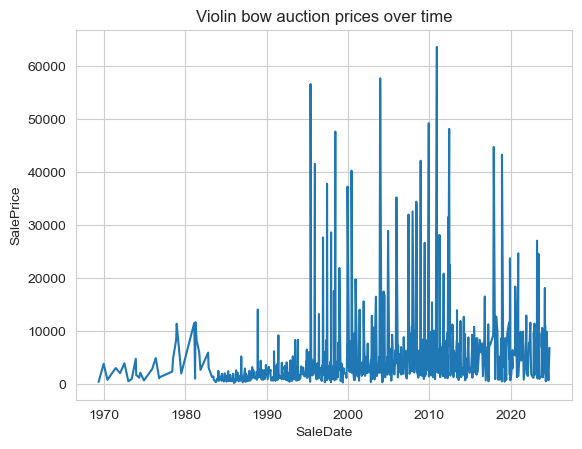

In [146]:
sns.lineplot(x = 'SaleDate', y = 'SalePrice', data = violin_bows, errorbar=None).set_title('Violin bow auction prices over time')
plt.show()

In [147]:
violin_bows.head()

,Instrument,SaleDate,SalePrice,AuctionHouse,AuctionCity,MakerID,Maker,City,Country
0,Violin Bow,2005-11-12,3296,Bongartz's,NaN,890,"Acoulon, Alexandre Alfred",Mirecourt,France
1,Violin Bow,1991-09-19,2280,Phillip's,Paris,890,"Acoulon, Alexandre Alfred",Mirecourt,France
2,Violin Bow,1991-03-13,694,Phillip's,Paris,890,"Acoulon, Alexandre Alfred",Mirecourt,France
3,Violin Bow,1987-06-09,658,Sotheby's,Paris,890,"Acoulon, Alexandre Alfred",Mirecourt,France
4,Violin Bow,1985-11-18,295,Bongartz's,Paris,890,"Acoulon, Alexandre Alfred",Mirecourt,France


### Box Plot by Decade to Show Distribution Changes in Violin Bow Sales

In [149]:
# Keep only a few columns
vb = violin_bows[['SalePrice', 'Country', 'SaleDate', 'Maker']]
vb

,SalePrice,Country,SaleDate,Maker
0,3296,France,2005-11-12,"Acoulon, Alexandre Alfred"
1,2280,France,1991-09-19,"Acoulon, Alexandre Alfred"
2,694,France,1991-03-13,"Acoulon, Alexandre Alfred"
3,658,France,1987-06-09,"Acoulon, Alexandre Alfred"
4,295,France,1985-11-18,"Acoulon, Alexandre Alfred"
...,...,...,...,...
17328,245,Germany,1989-10-12,"Zimmermann, Julius Heinrich"
17329,1200,NaN,2015-08-21,"Zöphel, Ernst Willy"
17330,325,NaN,2014-12-12,"Zöphel, Ernst Willy"
17331,1039,NaN,2001-11-13,"Zöphel, Ernst Willy"


In [150]:
# Add 'Year' column
vb['Year'] = vb['SaleDate'].dt.year
vb

/var/folders/tn/yy89yz_94q5b571nxcz7c_2m0000gn/T/ipykernel_50239/3043019495.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vb['Year'] = vb['SaleDate'].dt.year


,SalePrice,Country,SaleDate,Maker,Year
0,3296,France,2005-11-12,"Acoulon, Alexandre Alfred",2005
1,2280,France,1991-09-19,"Acoulon, Alexandre Alfred",1991
2,694,France,1991-03-13,"Acoulon, Alexandre Alfred",1991
3,658,France,1987-06-09,"Acoulon, Alexandre Alfred",1987
4,295,France,1985-11-18,"Acoulon, Alexandre Alfred",1985
...,...,...,...,...,...
17328,245,Germany,1989-10-12,"Zimmermann, Julius Heinrich",1989
17329,1200,NaN,2015-08-21,"Zöphel, Ernst Willy",2015
17330,325,NaN,2014-12-12,"Zöphel, Ernst Willy",2014
17331,1039,NaN,2001-11-13,"Zöphel, Ernst Willy",2001


In [151]:
vb['SaleDate'].min()

Timestamp('1969-04-24 00:00:00')

In [152]:
Tarisio_bows = Tarisio[Tarisio['Instrument'] == 'Violin Bow']
Tarisio_bows['SaleDate'].min()

Timestamp('1969-04-24 00:00:00')

### So, it looks like bows did not start passing through the data set until 1969. ?

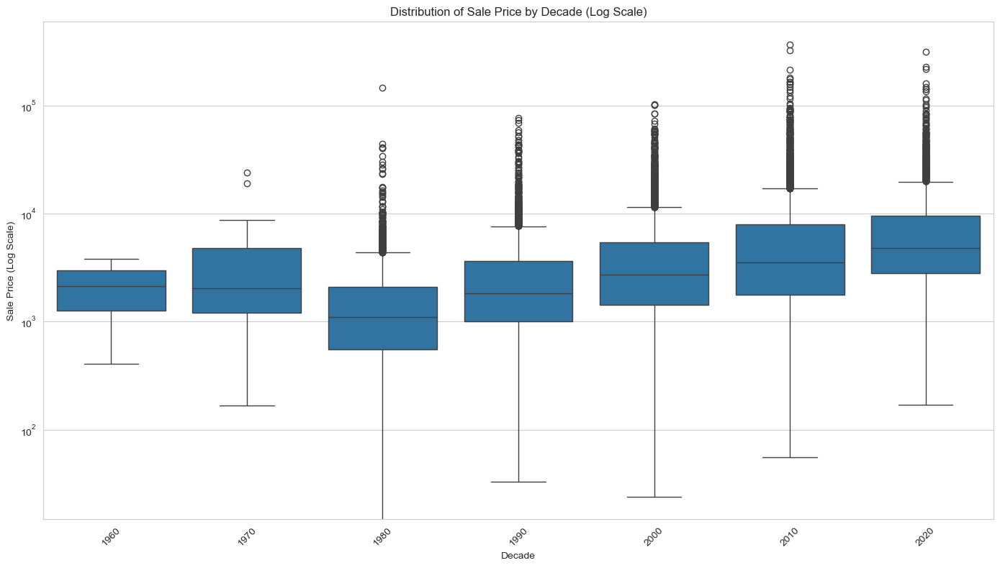

In [154]:
# Add a decade column
bows_by_decade = vb.copy()
bows_by_decade['Decade'] = (bows_by_decade['Year'] // 10) * 10

# Box plot by decade
plt.figure(figsize=(14, 8))
sns.boxplot(x='Decade', y='SalePrice', data=bows_by_decade)
plt.yscale('log')
plt.xlabel('Decade')
plt.ylabel('Sale Price (Log Scale)')
plt.title('Distribution of Sale Price by Decade (Log Scale)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [155]:
bows_by_decade['SalePrice'].describe()

count     17333.000000
mean       5490.125079
std       11091.230789
min           0.000000
25%        1240.000000
50%        2557.000000
75%        5398.000000
max      367862.000000
Name: SalePrice, dtype: float64

# Resources
[Return to Table of Contents](#Contents)

Plotly graphing library - visualization ref from James: <br>
https://plotly.com/python/plotly-express/